Python File 3

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
from itertools import combinations
from scipy.stats import chi2_contingency
import numpy as np

In [19]:
df = pd.read_csv("data_encoded.csv")
df.head()

,Customer_ID,Month,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Personal Loan,Home Equity Loan,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan,Credit_Mix_encoded,Payment_of_Min_Amount_encoded,Payment_Behaviour_encoded,Credit_Score_encoded
0,3392,1,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1,1,2,0
1,3392,2,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1,1,3,0
2,3392,3,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1,1,4,0
3,3392,4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,5.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1,1,5,0
4,3392,5,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,6.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1,1,1,0


# Plotting categorical features against the target feature "Credit_score"

c:\Users\Orange\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Orange\AppData\Local\Temp\ipykernel_17344\43092432.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


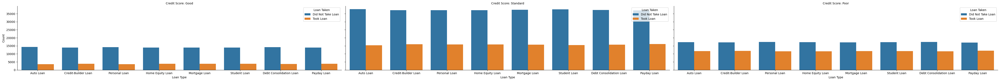

In [20]:
# Plotting the loans against the target feature "Credit_Score"

Loans = ["Auto Loan", "Credit-Builder Loan", "Personal Loan", "Home Equity Loan", 
         "Mortgage Loan", "Student Loan", "Debt Consolidation Loan", "Payday Loan"]

# Mapping for Credit_Score encoded values to labels to visualize
score_labels = {
    0: "Good",
    1: "Poor",
    2: "Standard"
}

# Map the encoded values to their labels
df['Credit_Score'] = df['Credit_Score_encoded'].map(score_labels)

# Create the catplot
g = sns.catplot(
    data = df.melt(id_vars = ['Credit_Score'], value_vars = Loans, var_name = 'Loan_Type', value_name = 'Loan_Taken'),
    x = 'Loan_Type', hue = 'Loan_Taken', col = 'Credit_Score',
    kind = 'count', height = 4, aspect = 4, legend_out = False
)
g.set_axis_labels("Loan Type", "Count")
g.set_titles("Credit Score: {col_name}")

# Setting the Legend labels and titles
legend_labels = ["Did Not Take Loan", "Took Loan"]
for ax in g.axes.flat:
    ax.legend(legend_labels, title = "Loan Taken")

plt.tight_layout()
plt.show()

c:\Users\Orange\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Orange\AppData\Local\Temp\ipykernel_17344\3910127062.py:37: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


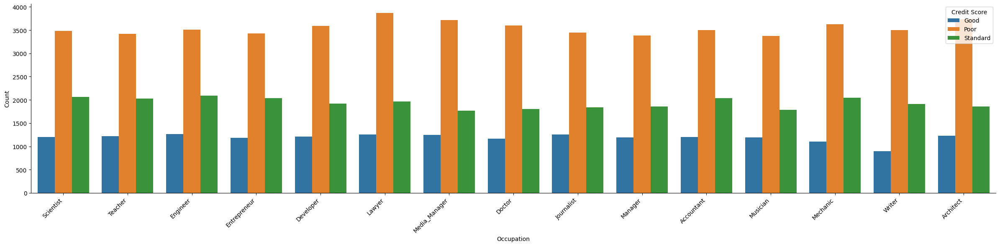

In [21]:
# Plotting the "Occupation_encoded" column against "Credit_Score" column

# Mapping for Occupation_encoded values to occupation names
occupation_labels = {
    0: "Accountant",
    1: "Architect",
    2: "Developer",
    3: "Doctor",
    4: "Engineer",
    5: "Entrepreneur",
    6: "Journalist",
    7: "Lawyer",
    8: "Manager",
    9: "Mechanic",
    10: "Media_Manager",
    11: "Musician",
    12: "Scientist",
    13: "Teacher",
    14: "Writer"
}
df['Occupation'] = df['Occupation_encoded'].map(occupation_labels)

# Create the catplot
g = sns.catplot(
    data = df, x = 'Occupation', hue = 'Credit_Score', kind = 'count',
    height = 6, aspect = 4 , legend_out = False
)
g.set_axis_labels("Occupation", "Count")
g.set_xticklabels(rotation = 45, ha = "right") # Rotating the x-axis labels 

# Setting the Legend labels and titles
legend_labels = ["Good", "Poor", "Standard"]
g._legend.set_title("Credit Score")
for t, l in zip(g._legend.texts, legend_labels):
    t.set_text(l)

plt.tight_layout()
plt.show()

c:\Users\Orange\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Orange\AppData\Local\Temp\ipykernel_17344\3770397018.py:26: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


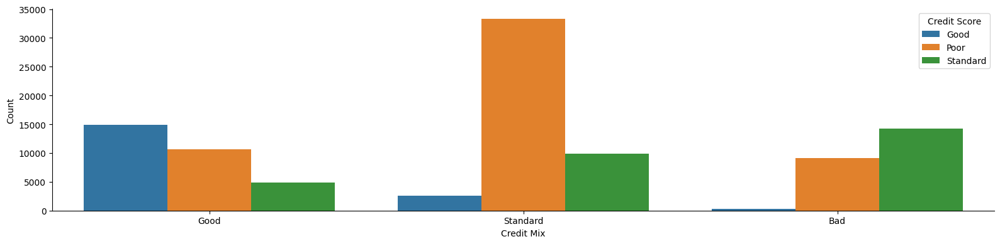

In [22]:
# Plotting the "Credit_Mix_encoded" column against "Credit_Score" column

# Mapping for Credit_Mix encoded values to labels to visualize
score_labels2 = {
    0: "Bad",
    1: "Good",
    2: "Standard"
}

# Map the encoded values to their labels
df['Credit_Mix'] = df['Credit_Mix_encoded'].map(score_labels2)

# Create the catplot
g = sns.catplot(
    data = df, x = 'Credit_Mix', hue = 'Credit_Score', kind = 'count',
    height = 4, aspect = 4 , legend_out = False
)
g.set_axis_labels("Credit Mix", "Count")

# Setting the Legend labels and titles
legend_labels = ["Good", "Poor", "Standard"]
g._legend.set_title("Credit Score")
for t, l in zip(g._legend.texts, legend_labels):
    t.set_text(l)

plt.tight_layout()
plt.show()



c:\Users\Orange\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Orange\AppData\Local\Temp\ipykernel_17344\114728320.py:25: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


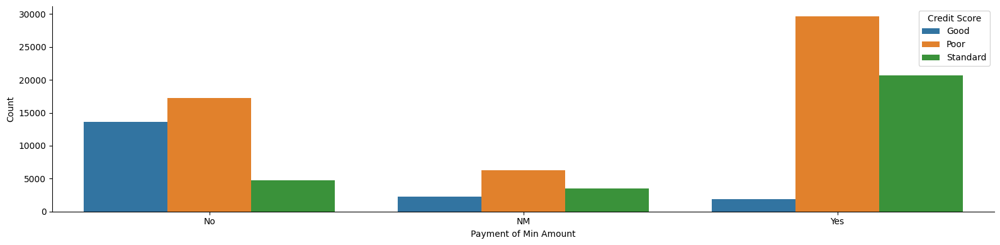

In [23]:
# Plotting the "Payment_of_Min_Amount_encoded" column against "Credit_Score" column

# Mapping for Payment_of_Min_Amount_encoded values to labels to visualize
payment_labels = {
    0: "NM",
    1: "No",
    2: "Yes"
}

df['Payment_of_Min_Amount'] = df['Payment_of_Min_Amount_encoded'].map(payment_labels)

# Create the catplot
g = sns.catplot(
    data = df, x = 'Payment_of_Min_Amount', hue = 'Credit_Score', kind = 'count',
    height = 4, aspect = 4 , legend_out = False
)
g.set_axis_labels("Payment of Min Amount", "Count")

# Setting the Legend labels and titles
legend_labels = ["Good", "Poor", "Standard"]
g._legend.set_title("Credit Score")
for t, l in zip(g._legend.texts, legend_labels):
    t.set_text(l)

plt.tight_layout()
plt.show()

c:\Users\Orange\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Orange\AppData\Local\Temp\ipykernel_17344\1832382672.py:30: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


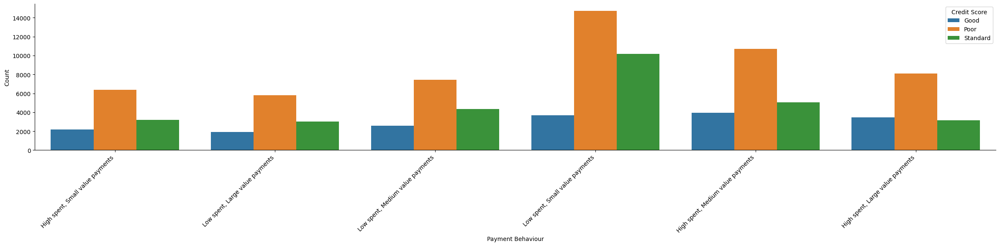

In [24]:
# Plotting the "Payment_Behaviour_encoded" column against "Credit_Score" column

# Mapping for Payment_Behaviour_encoded values to labels to visualize
payment_behavior_labels = {
    0: "High spent, Large value payments",
    1: "High spent, Medium value payments",
    2: "High spent, Small value payments",
    3: "Low spent, Large value payments",
    4: "Low spent, Medium value payments",
    5: "Low spent, Small value payments"
}

# Map the encoded values to their labels
df['Payment_Behaviour'] = df['Payment_Behaviour_encoded'].map(payment_behavior_labels)

# Create the catplot
g = sns.catplot(
    data = df, x = 'Payment_Behaviour', hue = 'Credit_Score', kind = 'count',
    height = 6, aspect = 4 , legend_out = False
)
g.set_axis_labels("Payment Behaviour", "Count")
g.set_xticklabels(rotation = 45, ha = "right") # Rotating the x-axis labels 

# Setting the Legend labels and titles
legend_labels = ["Good", "Poor", "Standard"]
g._legend.set_title("Credit Score")
for t, l in zip(g._legend.texts, legend_labels):
    t.set_text(l)

plt.tight_layout()
plt.show()


# Statistical Analysis on Categorical Columns

1. Auto loan


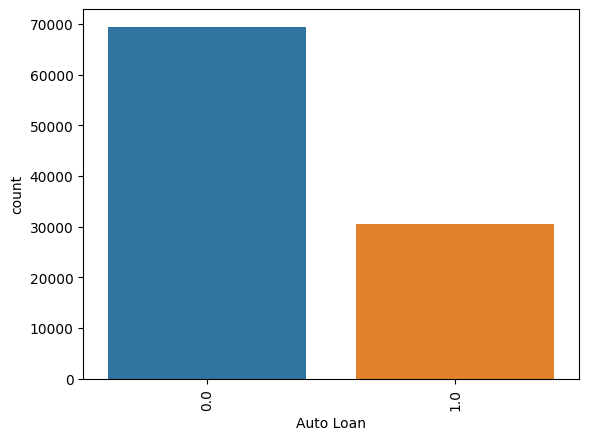

 
count    100000.000000
mean          0.305600
std           0.460663
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Auto Loan, dtype: float64
unique value: [1. 0.]
------------------------------------------------------------------------------------------
 
2. Credit-builder loan


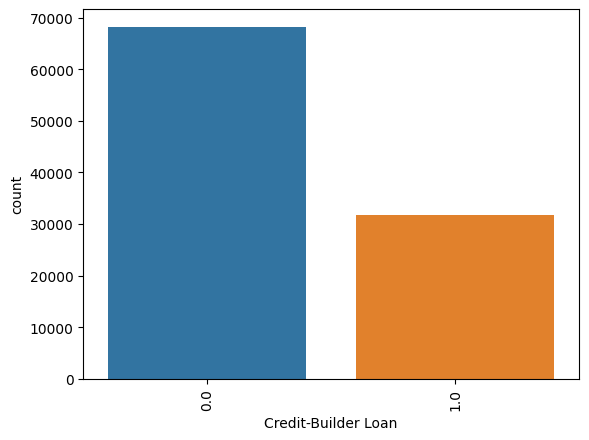

 
count    100000.00000
mean          0.31728
std           0.46542
min           0.00000
25%           0.00000
50%           0.00000
75%           1.00000
max           1.00000
Name: Credit-Builder Loan, dtype: float64
unique value: [1. 0.]
------------------------------------------------------------------------------------------
 
3. Personal loan


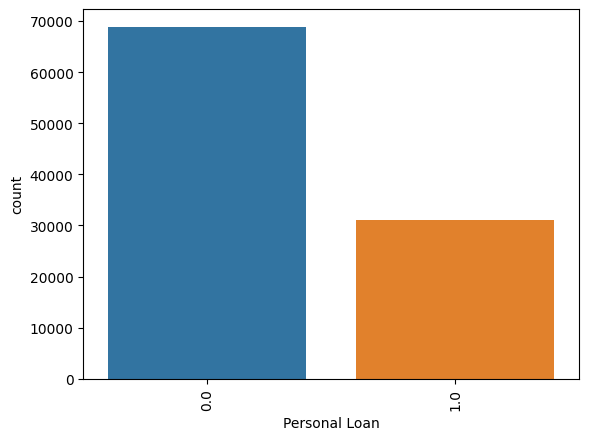

 
count    100000.000000
mean          0.311040
std           0.462921
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Personal Loan, dtype: float64
unique value: [1. 0.]
------------------------------------------------------------------------------------------
 
4. Home equity loan


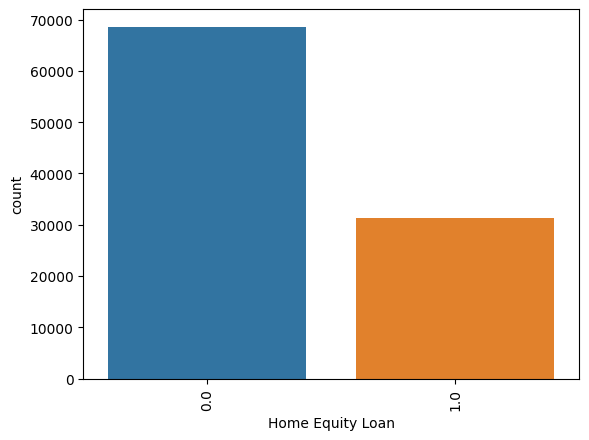

 
count    100000.000000
mean          0.314000
std           0.464119
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Home Equity Loan, dtype: float64
unique value: [1. 0.]
------------------------------------------------------------------------------------------
 
5. Mortgage loan


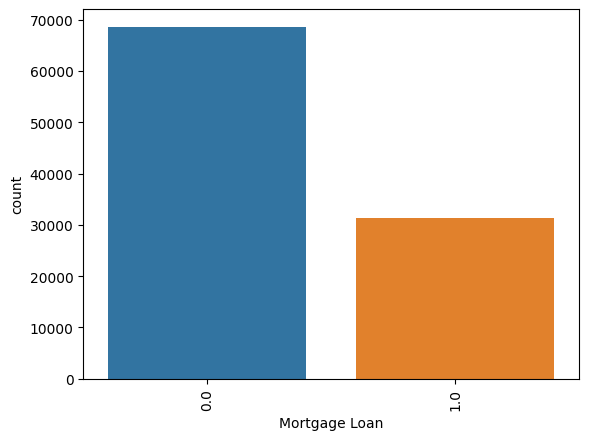

 
count    100000.000000
mean          0.313600
std           0.463958
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Mortgage Loan, dtype: float64
unique value: [0. 1.]
------------------------------------------------------------------------------------------
 
6. Student loan


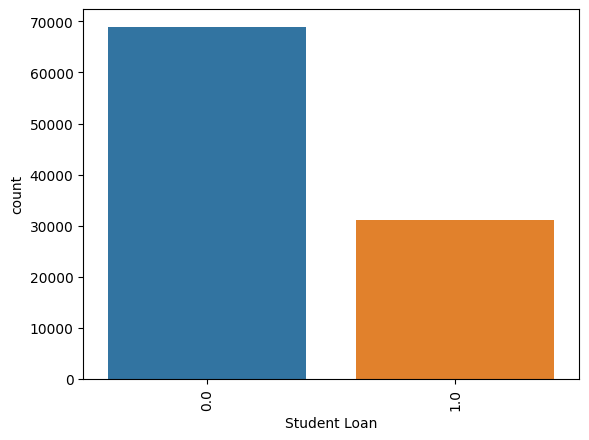

 
count    100000.00000
mean          0.31040
std           0.46266
min           0.00000
25%           0.00000
50%           0.00000
75%           1.00000
max           1.00000
Name: Student Loan, dtype: float64
unique value: [0. 1.]
------------------------------------------------------------------------------------------
 
7. Debt consolidation loan


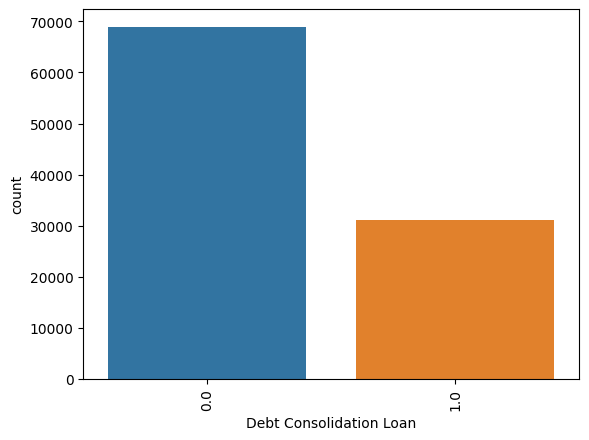

 
count    100000.00000
mean          0.31040
std           0.46266
min           0.00000
25%           0.00000
50%           0.00000
75%           1.00000
max           1.00000
Name: Debt Consolidation Loan, dtype: float64
unique value: [0. 1.]
------------------------------------------------------------------------------------------
 
8. Payday loan


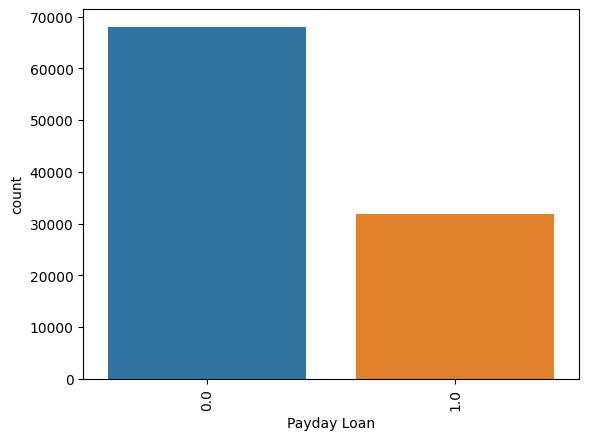

 
count    100000.000000
mean          0.319440
std           0.466262
min           0.000000
25%           0.000000
50%           0.000000
75%           1.000000
max           1.000000
Name: Payday Loan, dtype: float64
unique value: [0. 1.]
------------------------------------------------------------------------------------------
 
9. Occupation


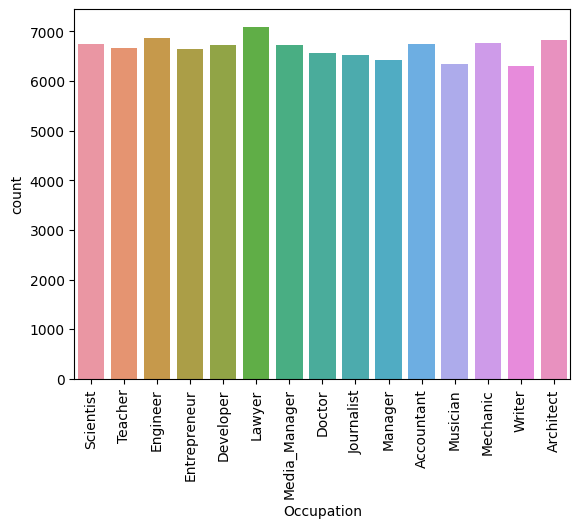

 
count     100000
unique        15
top       Lawyer
freq        7096
Name: Occupation, dtype: object
unique value: ['Scientist' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']
------------------------------------------------------------------------------------------
 
10. Credit mix


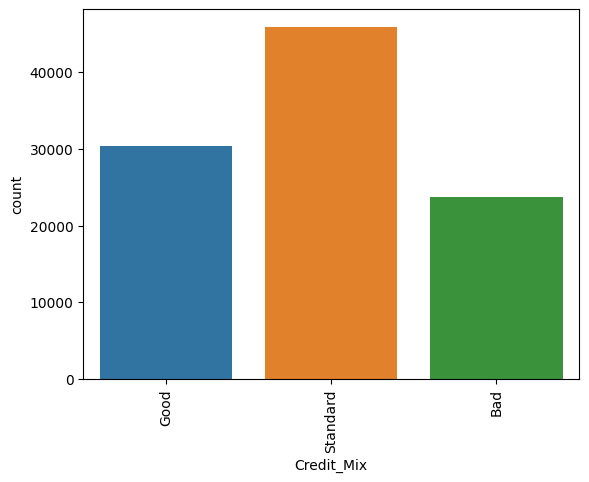

 
count       100000
unique           3
top       Standard
freq         45848
Name: Credit_Mix, dtype: object
unique value: ['Good' 'Standard' 'Bad']
------------------------------------------------------------------------------------------
 
11. Payment of min amount


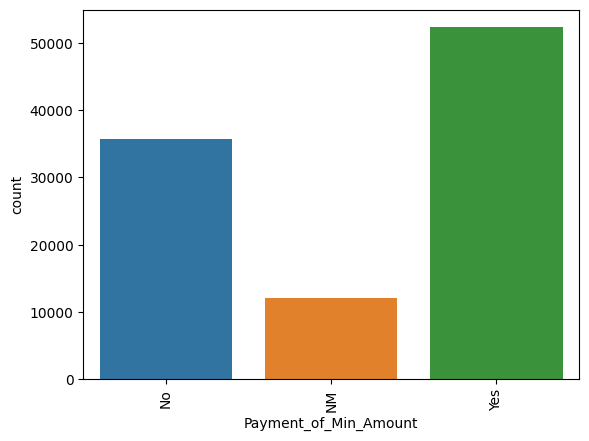

 
count     100000
unique         3
top          Yes
freq       52326
Name: Payment_of_Min_Amount, dtype: object
unique value: ['No' 'NM' 'Yes']
------------------------------------------------------------------------------------------
 
12. Payment behaviour


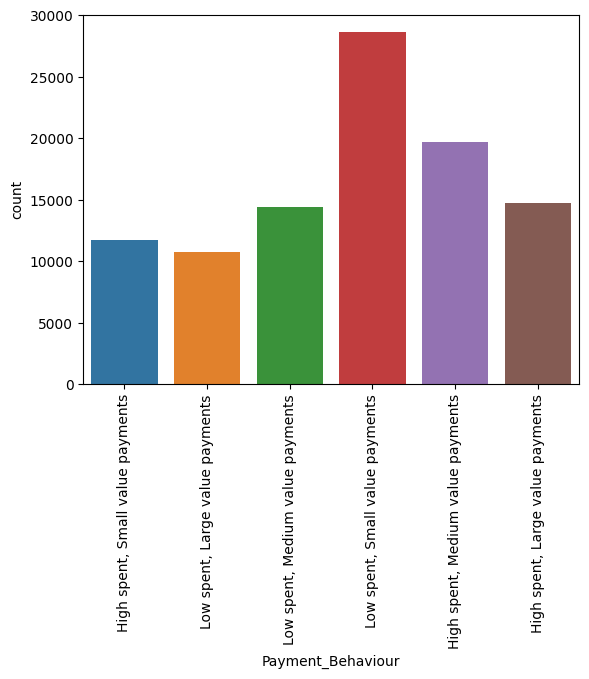

 
count                              100000
unique                                  6
top       Low spent, Small value payments
freq                                28616
Name: Payment_Behaviour, dtype: object
unique value: ['High spent, Small value payments' 'Low spent, Large value payments'
 'Low spent, Medium value payments' 'Low spent, Small value payments'
 'High spent, Medium value payments' 'High spent, Large value payments']
------------------------------------------------------------------------------------------
 


In [25]:
# Assigning a variable to hold the categorical values

cat_cols = ["Auto Loan", "Credit-Builder Loan", "Personal Loan", "Home Equity Loan", 
         "Mortgage Loan", "Student Loan", "Debt Consolidation Loan", "Payday Loan","Occupation", 
          "Credit_Mix", "Payment_of_Min_Amount", "Payment_Behaviour"]

# Univariate analysis of each categorical feature.

cat = []

for num, x in enumerate(cat_cols, 1):
    if len(df[x].unique()) <= 16:
        print(f'{num}. {x.replace("_", " ").capitalize()}')
        sns.countplot(data = df, x = x)
        plt.xticks(rotation = 90)
        plt.show()
        cat.append(x)
        print(' ')
        print(df[x].describe())
        print(f'unique value: {df[x].unique()}')
        print('-' * 90)
        print(' ')

Cramér's V value between Credit_Mix_encoded and Payment_of_Min_Amount_encoded: 0.5435
Cramér's V value between Credit-Builder Loan and Credit_Mix_encoded: 0.2700
Cramér's V value between Mortgage Loan and Credit_Mix_encoded: 0.2643
Cramér's V value between Home Equity Loan and Credit_Mix_encoded: 0.2580
Cramér's V value between Auto Loan and Credit_Mix_encoded: 0.2578
Cramér's V value between Payday Loan and Credit_Mix_encoded: 0.2544
Cramér's V value between Personal Loan and Credit_Mix_encoded: 0.2541
Cramér's V value between Student Loan and Credit_Mix_encoded: 0.2487
Cramér's V value between Debt Consolidation Loan and Credit_Mix_encoded: 0.2441
Cramér's V value between Payday Loan and Payment_of_Min_Amount_encoded: 0.1990
Cramér's V value between Credit-Builder Loan and Payment_of_Min_Amount_encoded: 0.1973
Cramér's V value between Home Equity Loan and Payment_of_Min_Amount_encoded: 0.1954
Cramér's V value between Auto Loan and Payment_of_Min_Amount_encoded: 0.1948
Cramér's V valu

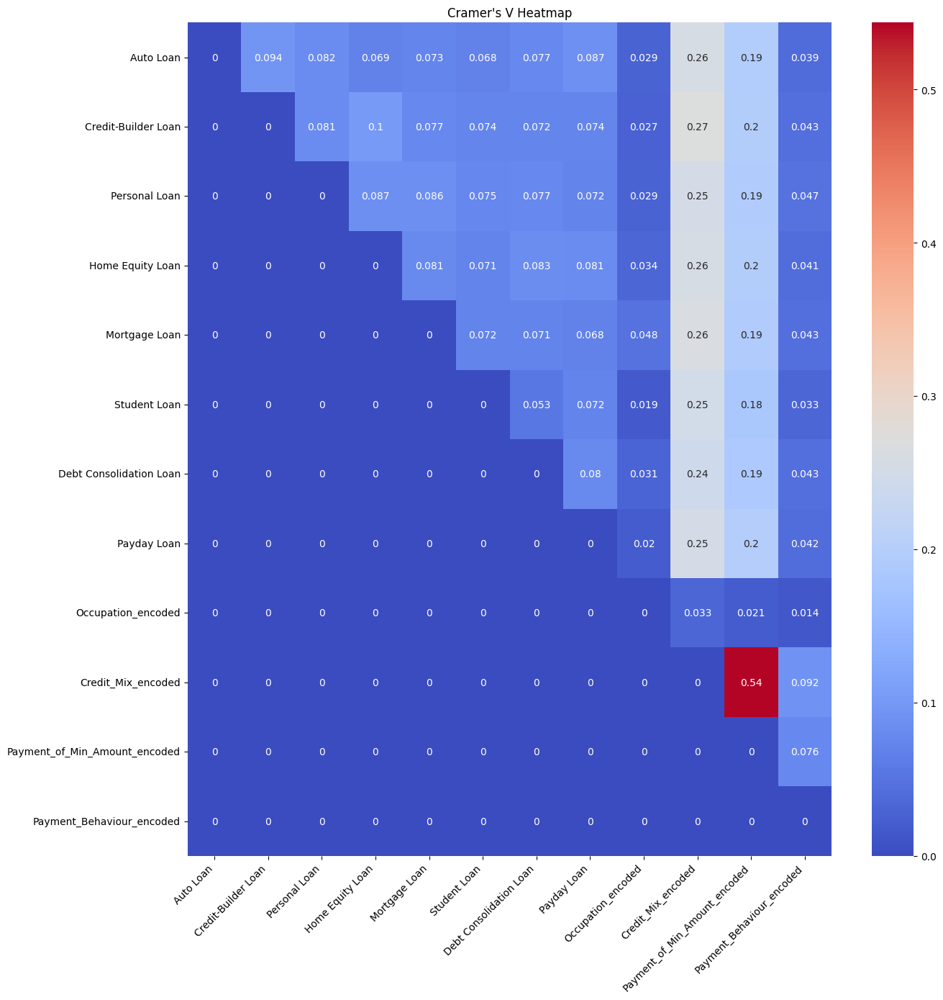

In [10]:
cat_cols = ["Auto Loan", "Credit-Builder Loan", "Personal Loan", "Home Equity Loan", 
            "Mortgage Loan", "Student Loan", "Debt Consolidation Loan", "Payday Loan", 
            "Occupation_encoded", "Credit_Mix_encoded", "Payment_of_Min_Amount_encoded", 
            "Payment_Behaviour_encoded"]

# Calculate Cramer's V values
cramer_v_values = []

for i, col1 in enumerate(cat_cols):
    for j, col2 in enumerate(cat_cols):
        if i < j:
            contingency_table = pd.crosstab(df[col1], df[col2])
            chi2, _, _, _ = chi2_contingency(contingency_table)
            n = df.shape[0]
            min_dim = min(contingency_table.shape)
            cramer_v = np.sqrt(chi2 / (n * (min_dim - 1)))
            cramer_v_values.append((col1, col2, cramer_v))

# Print Cramer's V values in descending order
cramer_v_values = sorted(cramer_v_values, key=lambda x: x[2], reverse=True)

for col1, col2, cramer_v in cramer_v_values:
    print(f"Cramér's V value between {col1} and {col2}: {cramer_v:.4f}")

# Create a matrix to visualize the Cramer's V values
num_cols = len(cat_cols)
cramer_v_matrix = np.zeros((num_cols, num_cols))

for i, col1 in enumerate(cat_cols):
    for j, col2 in enumerate(cat_cols):
        if i < j:
            cramer_v_matrix[i, j] = next(item[2] for item in cramer_v_values if (item[0] == col1 and item[1] == col2) or (item[0] == col2 and item[1] == col1))

# Visualizing the values using a heatmap
plt.figure(figsize=(14, 14))
sns.heatmap(cramer_v_matrix, annot=True, xticklabels=cat_cols, yticklabels=cat_cols, cmap="coolwarm")
plt.title("Cramer's V Heatmap")
plt.xticks(rotation = 45, ha = "right")
plt.yticks(rotation = 0)
plt.tight_layout()
plt.show()

In [11]:
# Dropping "Payment_of_Min_Amount_encoded" since both "Credit_Mix_encoded" and "Payment_of_Min_Amount_encoded" have a high Cramer V value-
# corresponding to high dependency that may affect model performance.
# "Payment_of_Min_Amount_encoded" is dropped since it holds the least correlation to the target column "Credit_Score"

df.drop("Payment_of_Min_Amount_encoded", axis = 1, inplace = True)

In [12]:
# Dropping mapped columns 

mapped_columns = ["Occupation", "Credit_Mix", "Payment_of_Min_Amount", "Payment_Behaviour"]
df.drop(mapped_columns, axis = 1, inplace = True)

# Plotting Credit_Score in a Pie chart

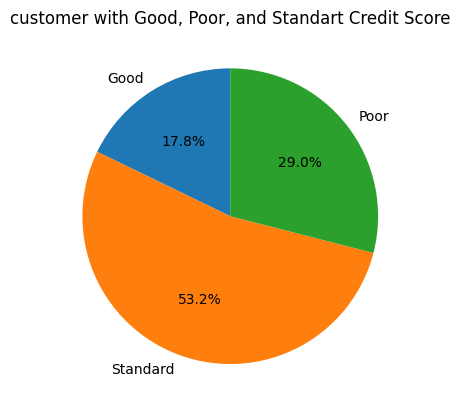

In [13]:
data = [df[df['Credit_Score']=='Good']['Credit_Score'].count(),
        df[df['Credit_Score']=='Standard']['Credit_Score'].count(),
       df[df['Credit_Score']=='Poor']['Credit_Score'].count()]
categori = ['Good','Standard','Poor']

plt.pie(data,
        labels = categori,
        autopct = '%1.1f%%',
        startangle = 90)

plt.title('customer with Good, Poor, and Standart Credit Score')

plt.show()

# Statistical Analysis on Continuous Columns

In [14]:
# Function for outlier detection
def outlier(x):  # Calculating Quartiles
    q1 = np.nanpercentile(x, 25)
    q3 = np.nanpercentile(x, 75)
    iqr = q3 - q1  # Calculating the IQR
    lower_fence = q1 - 1.5 * iqr # Calculating the lower fence 
    upper_fence = q3 + 1.5 * iqr # Calculating the upper fence
    

    non_outlier = []  # If datapoint falls within the upper and lower fence its considered a non_outlier
    for num in x:
        if num >= lower_fence and num <= upper_fence:
            non_outlier.append(num)
    lower_whisker = np.min(non_outlier) # The lower and upper whiskers are calculated as the minimum and maximum values within the non_outlier list, respectively.
    upper_whisker = np.max(non_outlier)
    
    
    outlier = [] # If datapoint doesn't fall within the upper and lower fence its considered an outlier
    for num in x:
        if num < lower_fence or num > upper_fence:
            outlier.append(num)
    
    outlier_count = len(outlier)
    
    print('lower_whisker: {}'.format(lower_whisker))
    print('upper_whisker: {}'.format(upper_whisker))
    print('outlier counts: {}'.format(outlier_count))

1. Customer_ID


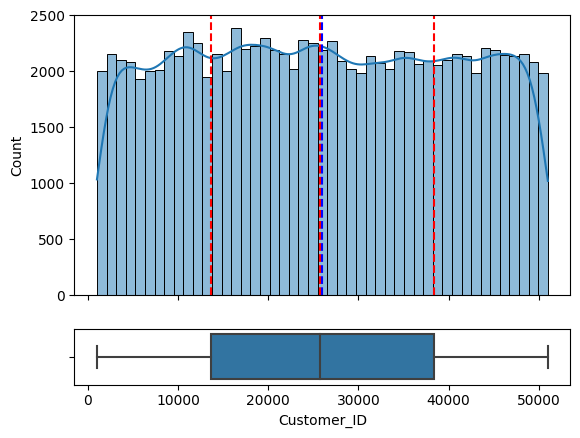

 
count    100000.000000
mean      25982.666640
std       14340.543051
min        1006.000000
25%       13664.500000
50%       25777.000000
75%       38385.000000
max       50999.000000
Name: Customer_ID, dtype: float64
 
lower_whisker: 1006
upper_whisker: 50999
outlier counts: 0
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
2. Month


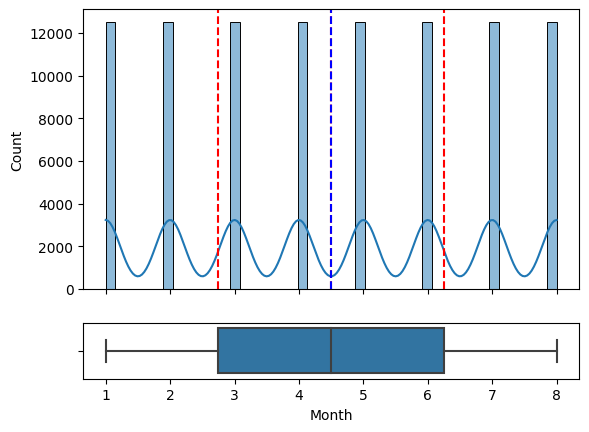

 
count    100000.000000
mean          4.500000
std           2.291299
min           1.000000
25%           2.750000
50%           4.500000
75%           6.250000
max           8.000000
Name: Month, dtype: float64
 
lower_whisker: 1
upper_whisker: 8
outlier counts: 0
 
Data not skewed
 
Data not normal
--------------------------------------------------
 
3. Age


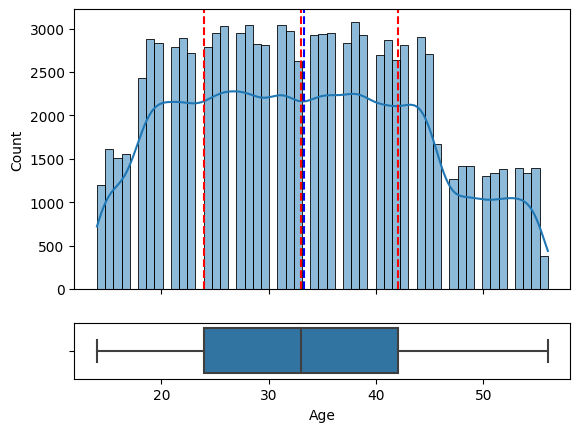

 
count    100000.000000
mean         33.316340
std          10.764812
min          14.000000
25%          24.000000
50%          33.000000
75%          42.000000
max          56.000000
Name: Age, dtype: float64
 
lower_whisker: 14.0
upper_whisker: 56.0
outlier counts: 0
 
Data skewed with skew: 20.062990298338097
 
Data not normal
--------------------------------------------------
 
4. Annual_Income


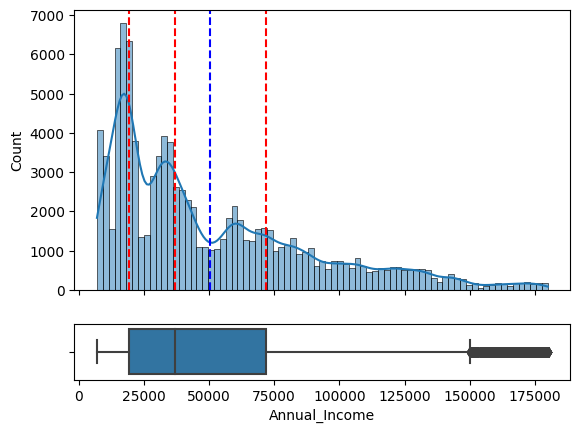

 
count    100000.000000
mean      50505.123449
std       38299.422093
min        7005.930000
25%       19342.972500
50%       36999.705000
75%       71683.470000
max      179987.280000
Name: Annual_Income, dtype: float64
 
lower_whisker: 7005.93
upper_whisker: 150131.68
outlier counts: 2000
 
Data skewed with skew: 118.99570712792169
 
Data not normal
--------------------------------------------------
 
5. Monthly_Inhand_Salary


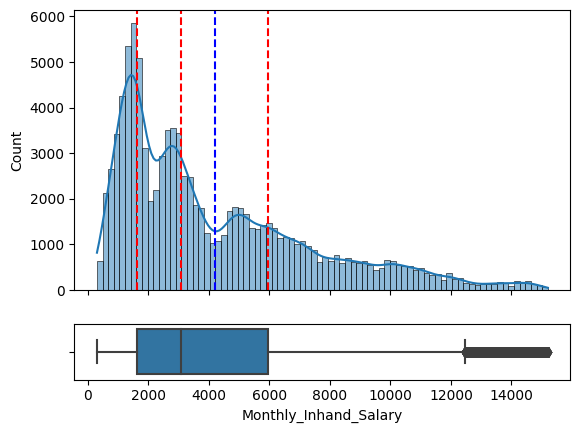

 
count    100000.000000
mean       4197.270835
std        3186.432497
min         303.645417
25%        1626.594167
50%        3095.905000
75%        5957.715000
max       15204.633333
Name: Monthly_Inhand_Salary, dtype: float64
 
lower_whisker: 303.6454166666666
upper_whisker: 12452.33
outlier counts: 2017
 
Data skewed with skew: 118.87974702484696
 
Data not normal
--------------------------------------------------
 
6. Num_Bank_Accounts


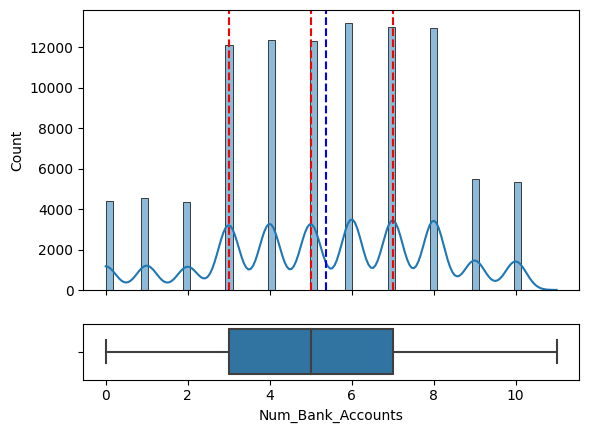

 
count    100000.000000
mean          5.368820
std           2.593314
min           0.000000
25%           3.000000
50%           5.000000
75%           7.000000
max          11.000000
Name: Num_Bank_Accounts, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 11.0
outlier counts: 0
 
Data skewed with skew: -24.316151596809156
 
Data not normal
--------------------------------------------------
 
7. Num_Credit_Card


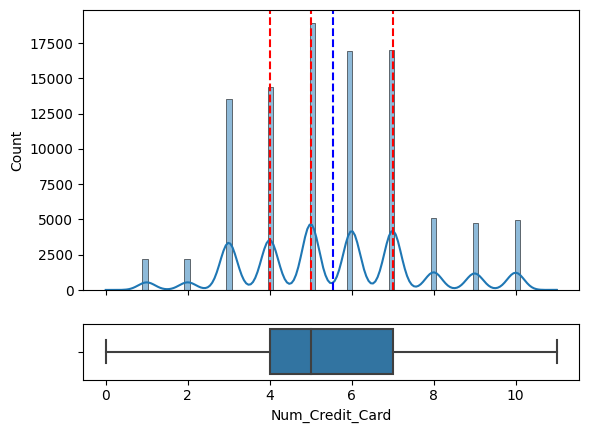

 
count    100000.000000
mean          5.533570
std           2.067098
min           0.000000
25%           4.000000
50%           5.000000
75%           7.000000
max          11.000000
Name: Num_Credit_Card, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 11.0
outlier counts: 0
 
Data skewed with skew: 28.79409442564283
 
Data not normal
--------------------------------------------------
 
8. Interest_Rate


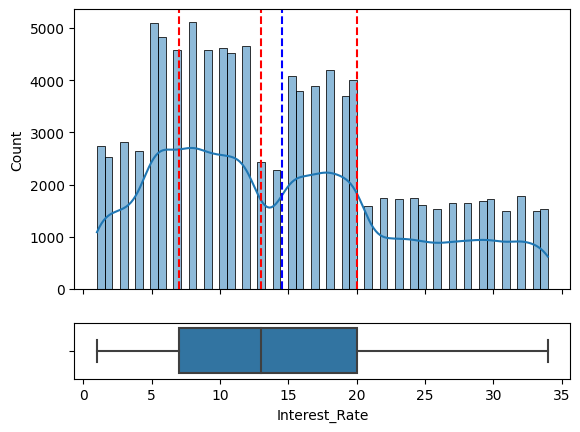

 
count    100000.00000
mean         14.53208
std           8.74133
min           1.00000
25%           7.00000
50%          13.00000
75%          20.00000
max          34.00000
Name: Interest_Rate, dtype: float64
 
lower_whisker: 1.0
upper_whisker: 34.0
outlier counts: 0
 
Data skewed with skew: 60.66378086497307
 
Data not normal
--------------------------------------------------
 
9. Num_of_Loan


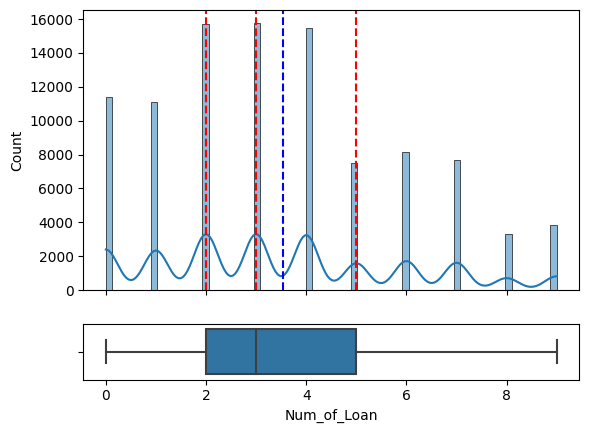

 
count    100000.000000
mean          3.532880
std           2.446356
min           0.000000
25%           2.000000
50%           3.000000
75%           5.000000
max           9.000000
Name: Num_of_Loan, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 9.0
outlier counts: 0
 
Data skewed with skew: 55.002113192196155
 
Data not normal
--------------------------------------------------
 
10. Delay_from_due_date


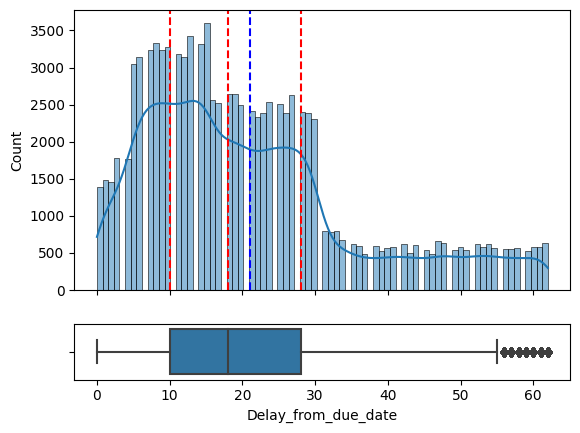

 
count    100000.00000
mean         21.08141
std          14.80456
min           0.00000
25%          10.00000
50%          18.00000
75%          28.00000
max          62.00000
Name: Delay_from_due_date, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 55.0
outlier counts: 4002
 
Data skewed with skew: 106.2773330659446
 
Data not normal
--------------------------------------------------
 
11. Num_of_Delayed_Payment


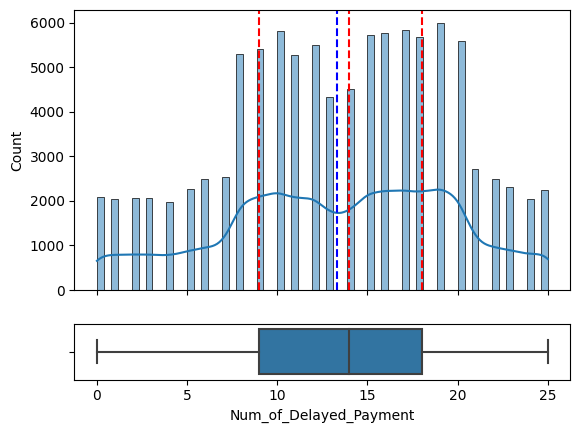

 
count    100000.000000
mean         13.313120
std           6.237166
min           0.000000
25%           9.000000
50%          14.000000
75%          18.000000
max          25.000000
Name: Num_of_Delayed_Payment, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 25.0
outlier counts: 0
 
Data skewed with skew: -27.380830160366607
 
Data not normal
--------------------------------------------------
 
12. Changed_Credit_Limit


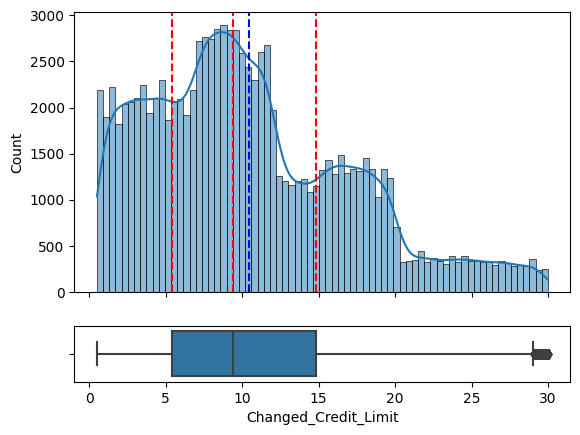

 
count    100000.000000
mean         10.470323
std           6.609481
min           0.500000
25%           5.380000
50%           9.400000
75%          14.850000
max          29.980000
Name: Changed_Credit_Limit, dtype: float64
 
lower_whisker: 0.5
upper_whisker: 29.04
outlier counts: 579
 
Data skewed with skew: 82.70480935571096
 
Data not normal
--------------------------------------------------
 
13. Num_Credit_Inquiries


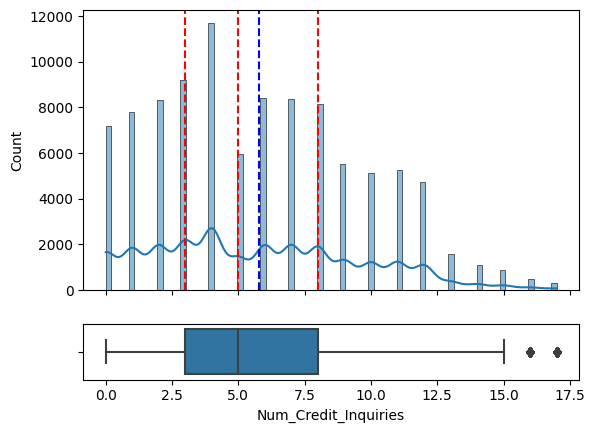

 
count    100000.000000
mean          5.798250
std           3.867826
min           0.000000
25%           3.000000
50%           5.000000
75%           8.000000
max          17.000000
Name: Num_Credit_Inquiries, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 15.0
outlier counts: 787
 
Data skewed with skew: 50.56330282792397
 
Data not normal
--------------------------------------------------
 
14. Outstanding_Debt


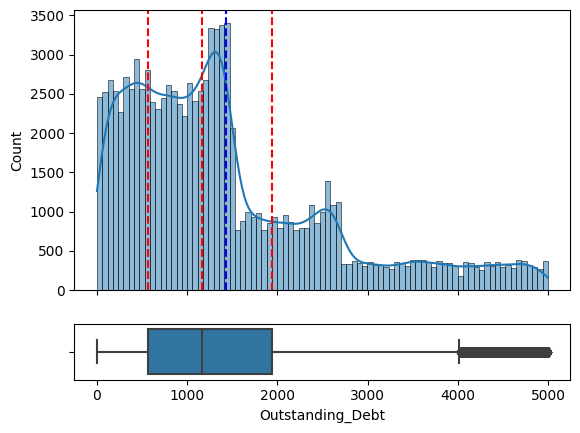

 
count    100000.000000
mean       1426.220376
std        1155.129026
min           0.230000
25%         566.072500
50%        1166.155000
75%        1945.962500
max        4998.070000
Name: Outstanding_Debt, dtype: float64
 
lower_whisker: 0.23
upper_whisker: 4014.35
outlier counts: 5272
 
Data skewed with skew: 124.71298394690707
 
Data not normal
--------------------------------------------------
 
15. Credit_Utilization_Ratio


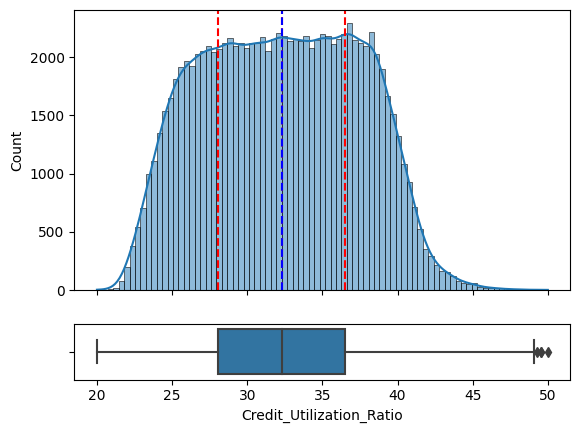

 
count    100000.000000
mean         32.285173
std           5.116875
min          20.000000
25%          28.052567
50%          32.305784
75%          36.496663
max          50.000000
Name: Credit_Utilization_Ratio, dtype: float64
 
lower_whisker: 20.0
upper_whisker: 49.06427745162148
outlier counts: 4
 
Data skewed with skew: 3.693843474954193
 
Data not normal
--------------------------------------------------
 
16. Credit_History_Age


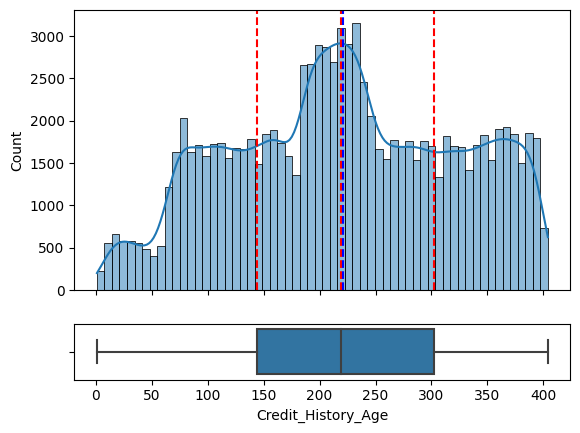

 
count    100000.000000
mean        221.220460
std          99.680716
min           1.000000
25%         144.000000
50%         219.000000
75%         302.000000
max         404.000000
Name: Credit_History_Age, dtype: float64
 
lower_whisker: 1.0
upper_whisker: 404.0
outlier counts: 0
 
Data skewed with skew: -6.30076754706476
 
Data not normal
--------------------------------------------------
 
17. Total_EMI_per_month


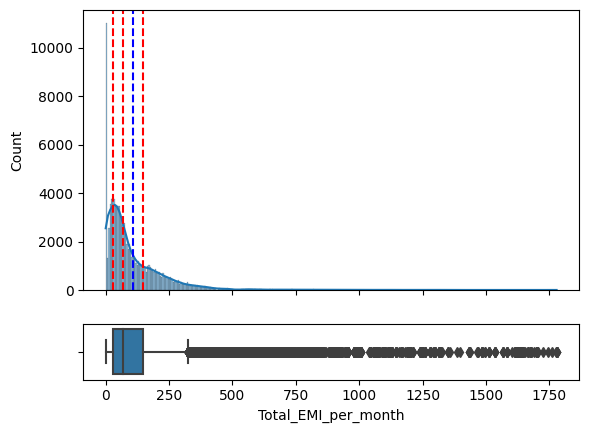

 
count    100000.000000
mean        107.699208
std         132.267056
min           0.000000
25%          29.268886
50%          66.462304
75%         147.392573
max        1779.103254
Name: Total_EMI_per_month, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 324.53131715239385
outlier counts: 5044
 
Data skewed with skew: 242.7418716437872
 
Data not normal
--------------------------------------------------
 
18. Amount_invested_monthly


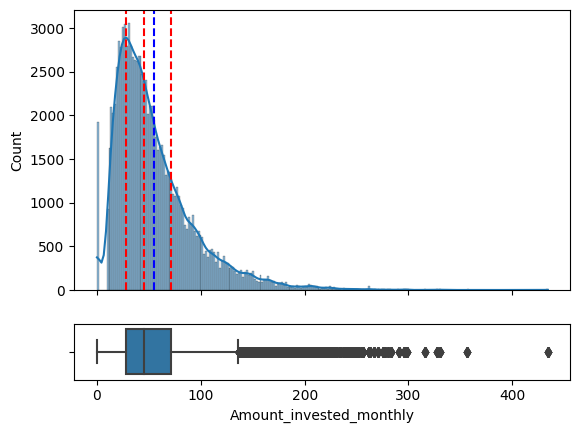

 
count    100000.000000
mean         55.101315
std          39.006932
min           0.000000
25%          27.959111
50%          45.156550
75%          71.295797
max         434.191089
Name: Amount_invested_monthly, dtype: float64
 
lower_whisker: 0.0
upper_whisker: 136.24705587894837
outlier counts: 4464
 
Data skewed with skew: 159.35913620348518
 
Data not normal
--------------------------------------------------
 
19. Monthly_Balance


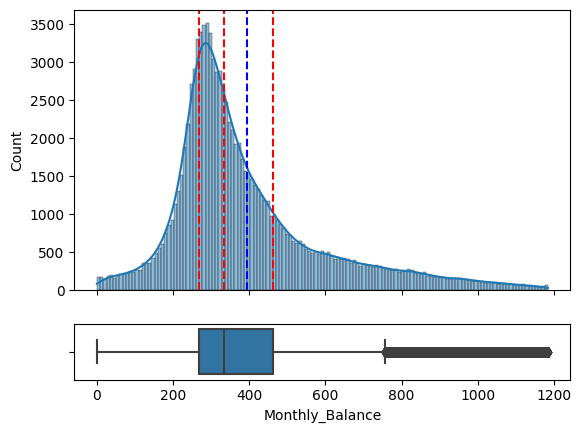

 
count    100000.000000
mean        392.697586
std         201.652719
min           0.007760
25%         267.615983
50%         333.865366
75%         463.215683
max        1183.930696
Name: Monthly_Balance, dtype: float64
 
lower_whisker: 0.0077596647753352
upper_whisker: 756.4625434314671
outlier counts: 7400
 
Data skewed with skew: 134.99093947419692
 
Data not normal
--------------------------------------------------
 


In [15]:
# Assigning a variable to hold the numerical values
numerical_cols = ["Customer_ID", "Month", "Age", "Annual_Income", "Monthly_Inhand_Salary", "Num_Bank_Accounts", "Num_Credit_Card", "Interest_Rate",
"Num_of_Loan", "Delay_from_due_date", "Num_of_Delayed_Payment", "Changed_Credit_Limit", "Num_Credit_Inquiries", "Outstanding_Debt", "Credit_Utilization_Ratio",
"Credit_History_Age", "Total_EMI_per_month", "Amount_invested_monthly", "Monthly_Balance"]

# Univariate Analysis
# Finding the count, mean, std, min, Q1, Q2, Q3, max for each column. In addition to finding the outlier counts in each column, how much the data is skewed-
# and if the data adopts a normal distribution or not.

y = 1 # Keeping track of the num of loops
# List to store normally distributed columns
norm_data = [] 

# Loop through numerical columns
for x in numerical_cols:
    print(f'{y}. {x}')
    
    # Create subplots for histogram and box plot
    fig, ax = plt.subplots(2, 1, sharex=True, gridspec_kw={'height_ratios':[5,1]})
    
    # Histogram with percentiles and mean lines
    sns.histplot(data=df, x=x, kde=True, ax=ax[0])
    ax[0].axvline(np.nanpercentile(df[x], 25), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 50), c='red', linestyle='--')
    ax[0].axvline(np.nanpercentile(df[x], 75), c='red', linestyle='--')
    ax[0].axvline(np.mean(df[x]), c='blue', linestyle='--')
    
    # Box plot
    sns.boxplot(data=df, x=x, ax=ax[1])
    ax[1].set_xlabel(f'{x}')
    plt.show()
    
    # Print summary statistics
    print(' ')
    print(df[x].describe())
    
    # Outlier detection
    print(' ')
    outlier(df[x])
    
    # Skewness test
    print(' ')
    sk, pval = st.skewtest(df[x])
    if pval < 0.05:
        print(f'Data skewed with skew: {sk}')
    else:
        print(f'Data not skewed')
    
    # Normality test
    print(' ')
    norm, pval = st.normaltest(df[x])
    if pval < 0.05:
        print(f'Data not normal')
    else:
        print(f'Data normal')
        norm_data.append(x)
    
    print('-' * 50)
    print(' ')
    y += 1

1. Customer_ID - Month


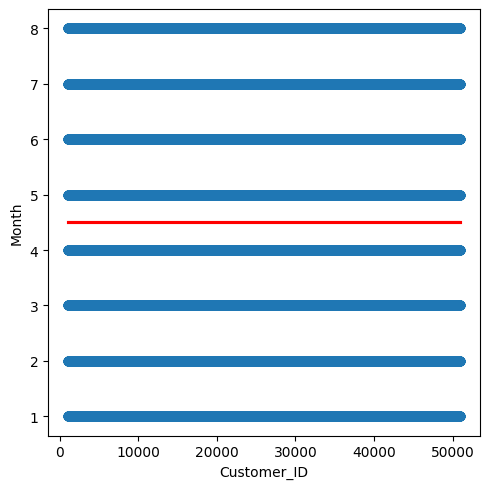

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Customer_ID and Month
 
 
2. Customer_ID - Age


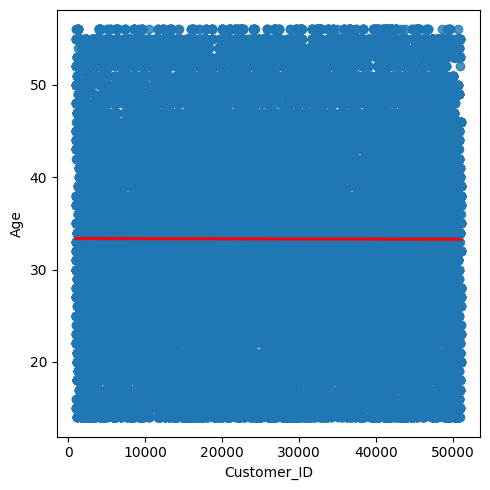

data have Spearman correlation with specification:
corr: -0.0031354885418018734
pvalue: 0.32143242449877324
Low corr between Customer_ID and Age
 
 
3. Customer_ID - Annual_Income


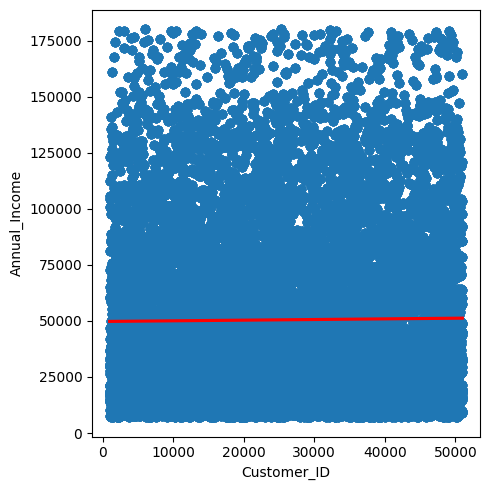

data have Spearman correlation with specification:
corr: 0.013403124950027046
pvalue: 2.2494038352771302e-05
Low corr between Customer_ID and Annual_Income
 
 
4. Customer_ID - Monthly_Inhand_Salary


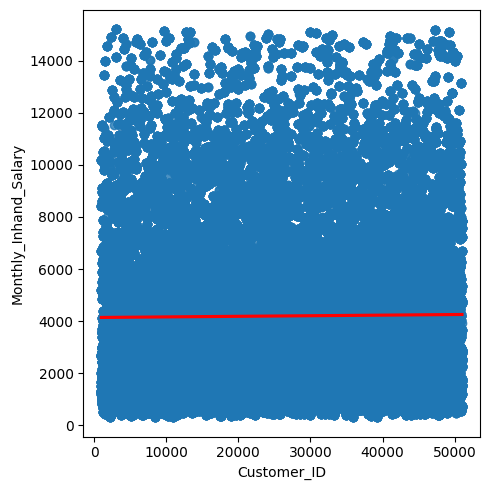

data have Spearman correlation with specification:
corr: 0.011351744954376188
pvalue: 0.00033092196273478986
Low corr between Customer_ID and Monthly_Inhand_Salary
 
 
5. Customer_ID - Num_Bank_Accounts


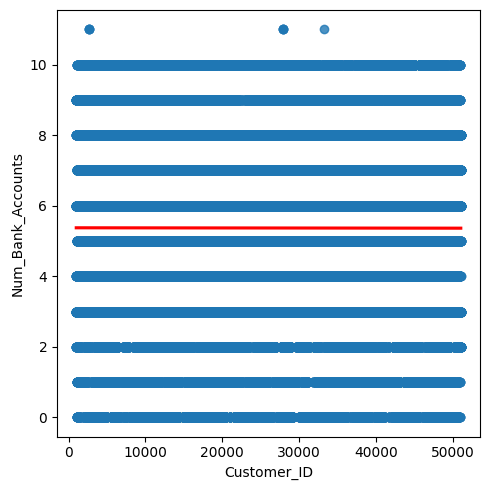

data have Spearman correlation with specification:
corr: -0.001995125192219729
pvalue: 0.5281015151911503
Low corr between Customer_ID and Num_Bank_Accounts
 
 
6. Customer_ID - Num_Credit_Card


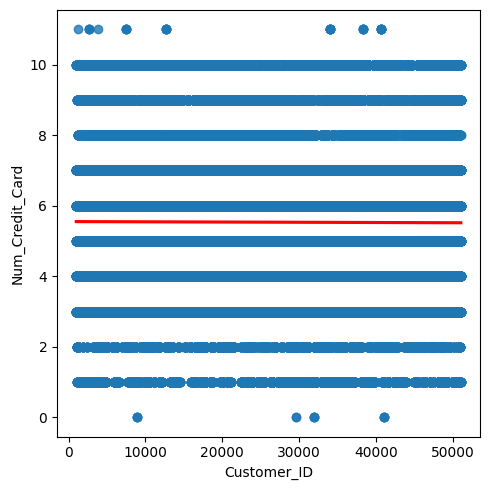

data have Spearman correlation with specification:
corr: -0.0022473139605513016
pvalue: 0.47729799760448754
Low corr between Customer_ID and Num_Credit_Card
 
 
7. Customer_ID - Interest_Rate


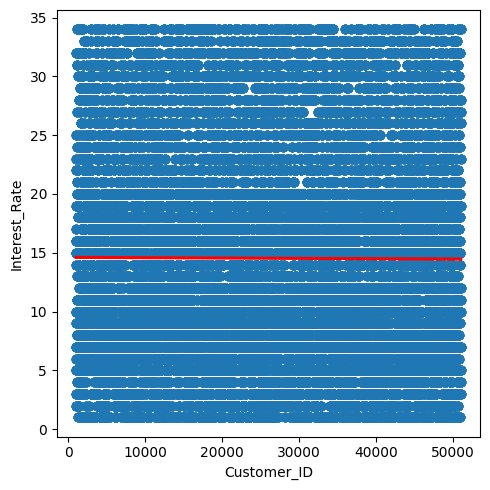

data have Spearman correlation with specification:
corr: -0.0065724050990845825
pvalue: 0.03767497641399583
Low corr between Customer_ID and Interest_Rate
 
 
8. Customer_ID - Num_of_Loan


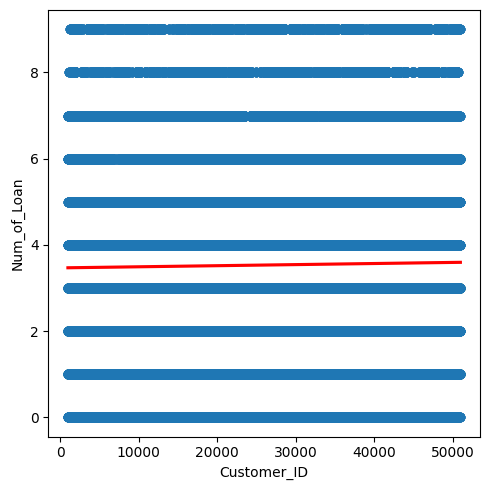

data have Spearman correlation with specification:
corr: 0.012234383875137622
pvalue: 0.0001093058126698329
Low corr between Customer_ID and Num_of_Loan
 
 
9. Customer_ID - Delay_from_due_date


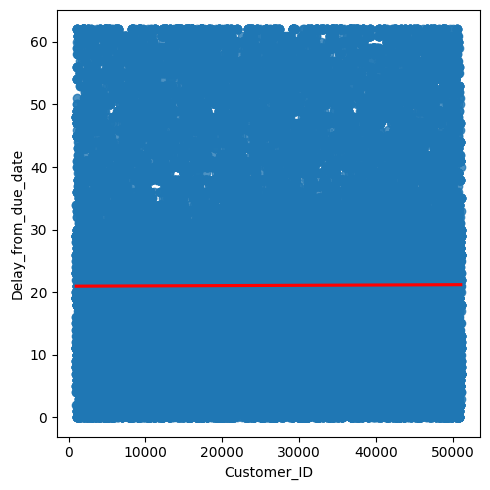

data have Spearman correlation with specification:
corr: 0.0046864642808817055
pvalue: 0.13834568524093482
Low corr between Customer_ID and Delay_from_due_date
 
 
10. Customer_ID - Num_of_Delayed_Payment


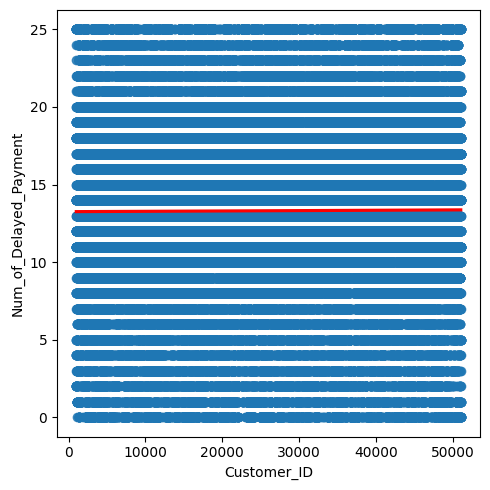

data have Spearman correlation with specification:
corr: 0.004989645811511203
pvalue: 0.11459900646587073
Low corr between Customer_ID and Num_of_Delayed_Payment
 
 
11. Customer_ID - Changed_Credit_Limit


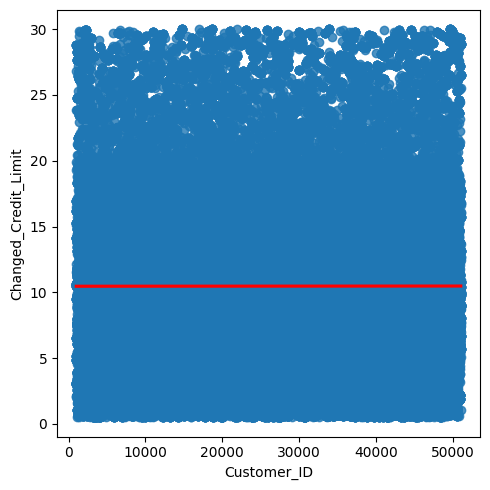

data have Spearman correlation with specification:
corr: -0.0002551137120944122
pvalue: 0.9357019841312988
Low corr between Customer_ID and Changed_Credit_Limit
 
 
12. Customer_ID - Num_Credit_Inquiries


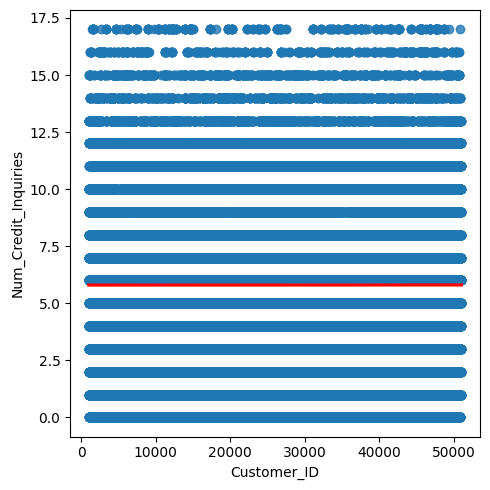

data have Spearman correlation with specification:
corr: 0.0013220749718000427
pvalue: 0.6758946431323538
Low corr between Customer_ID and Num_Credit_Inquiries
 
 
13. Customer_ID - Outstanding_Debt


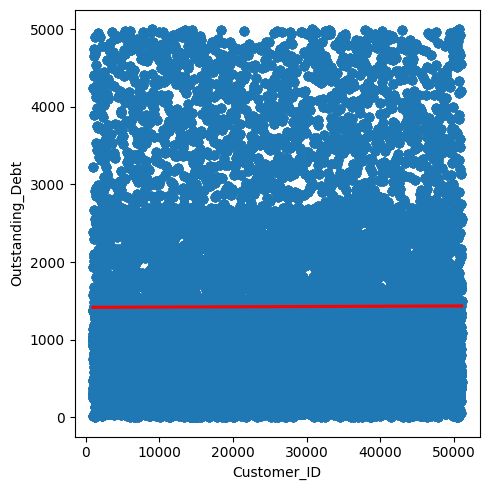

data have Spearman correlation with specification:
corr: 0.006500415865447977
pvalue: 0.03982031534703078
Low corr between Customer_ID and Outstanding_Debt
 
 
14. Customer_ID - Credit_Utilization_Ratio


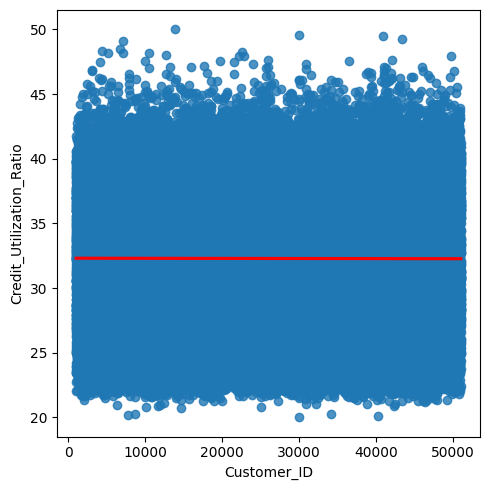

data have Spearman correlation with specification:
corr: -0.0022688881935178868
pvalue: 0.4730795767245518
Low corr between Customer_ID and Credit_Utilization_Ratio
 
 
15. Customer_ID - Credit_History_Age


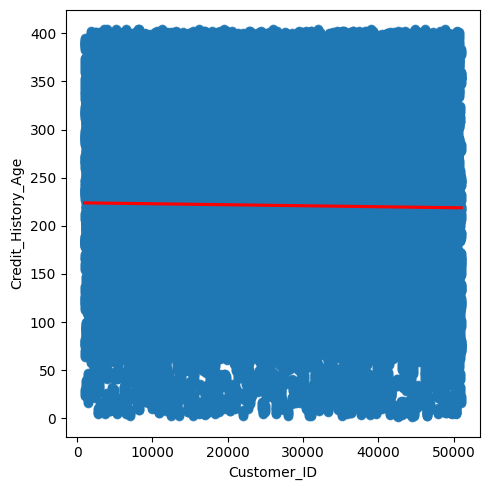

data have Spearman correlation with specification:
corr: -0.013944870274525413
pvalue: 1.0341146349287057e-05
Low corr between Customer_ID and Credit_History_Age
 
 
16. Customer_ID - Total_EMI_per_month


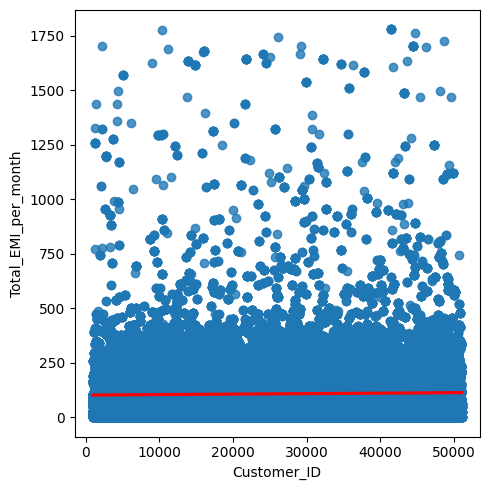

data have Spearman correlation with specification:
corr: 0.022379465687031964
pvalue: 1.4645421195273338e-12
Low corr between Customer_ID and Total_EMI_per_month
 
 
17. Customer_ID - Amount_invested_monthly


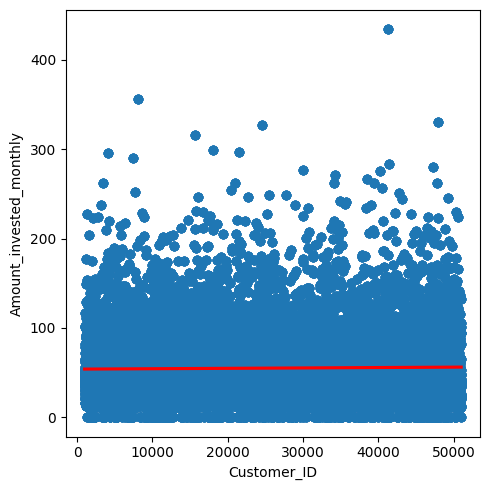

data have Spearman correlation with specification:
corr: 0.013180210516453012
pvalue: 3.071795624338293e-05
Low corr between Customer_ID and Amount_invested_monthly
 
 
18. Customer_ID - Monthly_Balance


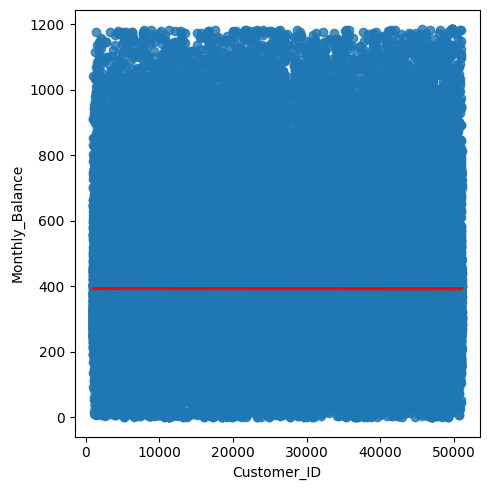

data have Spearman correlation with specification:
corr: -0.0021212925653849484
pvalue: 0.502345412669015
Low corr between Customer_ID and Monthly_Balance
 
 
19. Month - Age


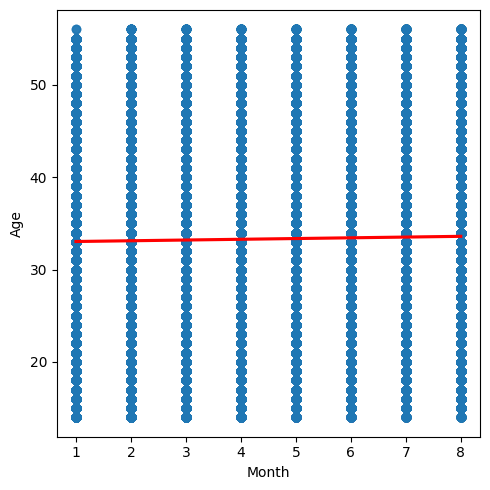

data have Spearman correlation with specification:
corr: 0.016228727098437496
pvalue: 2.863020438717638e-07
Low corr between Month and Age
 
 
20. Month - Annual_Income


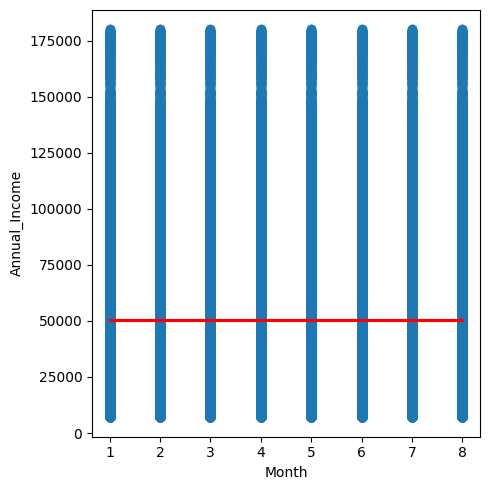

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Month and Annual_Income
 
 
21. Month - Monthly_Inhand_Salary


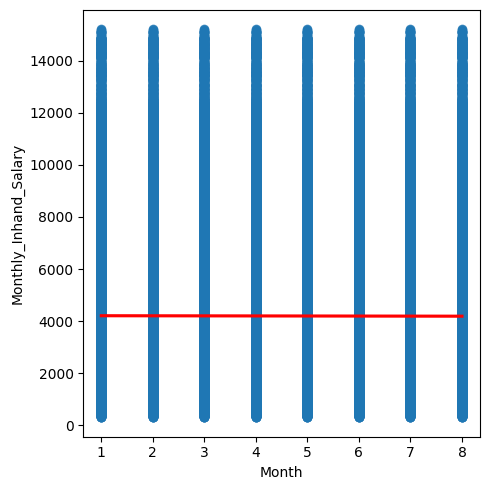

data have Spearman correlation with specification:
corr: -0.0016620342188895486
pvalue: 0.5991834184806906
Low corr between Month and Monthly_Inhand_Salary
 
 
22. Month - Num_Bank_Accounts


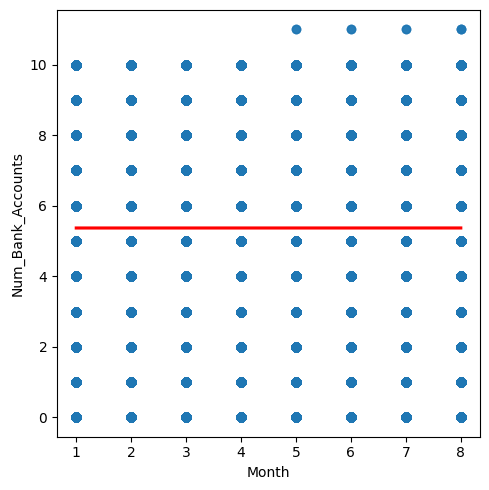

data have Spearman correlation with specification:
corr: 5.449358980834393e-05
pvalue: 0.9862513974296354
Low corr between Month and Num_Bank_Accounts
 
 
23. Month - Num_Credit_Card


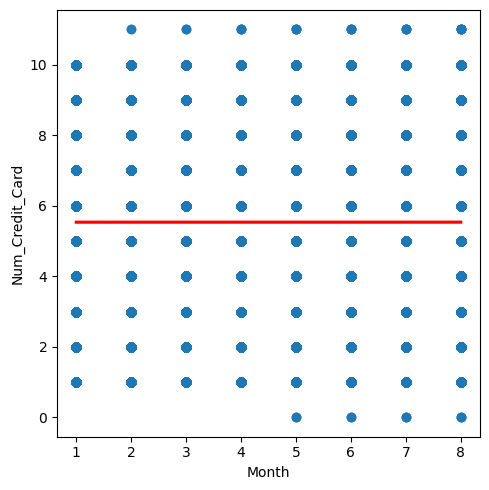

data have Spearman correlation with specification:
corr: -7.27146634123689e-07
pvalue: 0.9998165335629056
Low corr between Month and Num_Credit_Card
 
 
24. Month - Interest_Rate


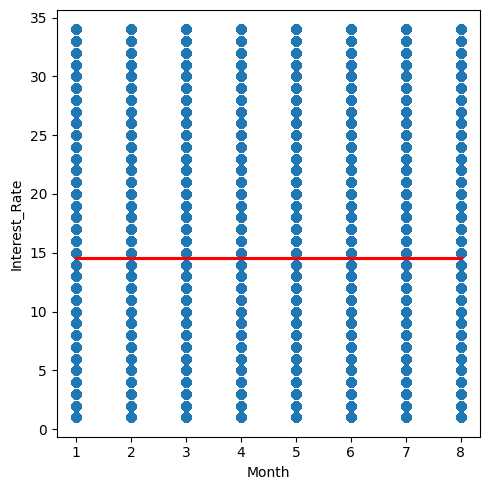

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Month and Interest_Rate
 
 
25. Month - Num_of_Loan


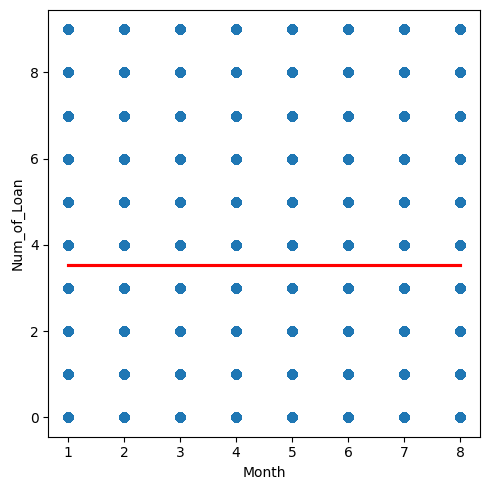

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Month and Num_of_Loan
 
 
26. Month - Delay_from_due_date


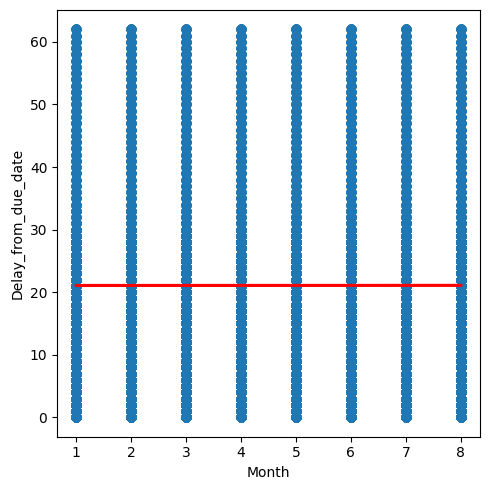

data have Spearman correlation with specification:
corr: 0.0005894798171832453
pvalue: 0.8521251550935823
Low corr between Month and Delay_from_due_date
 
 
27. Month - Num_of_Delayed_Payment


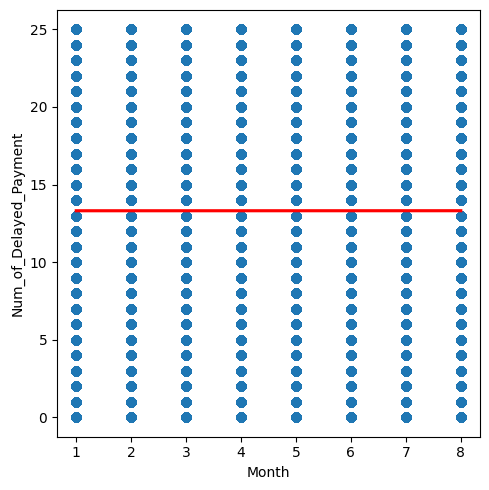

data have Spearman correlation with specification:
corr: 9.686603225956252e-06
pvalue: 0.997555976010079
Low corr between Month and Num_of_Delayed_Payment
 
 
28. Month - Changed_Credit_Limit


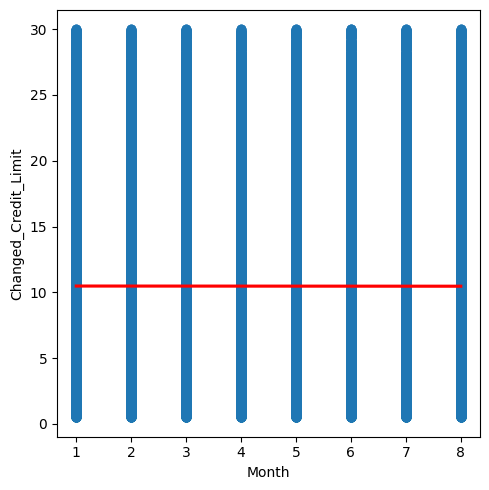

data have Spearman correlation with specification:
corr: -0.0013860292889916585
pvalue: 0.6611719590041119
Low corr between Month and Changed_Credit_Limit
 
 
29. Month - Num_Credit_Inquiries


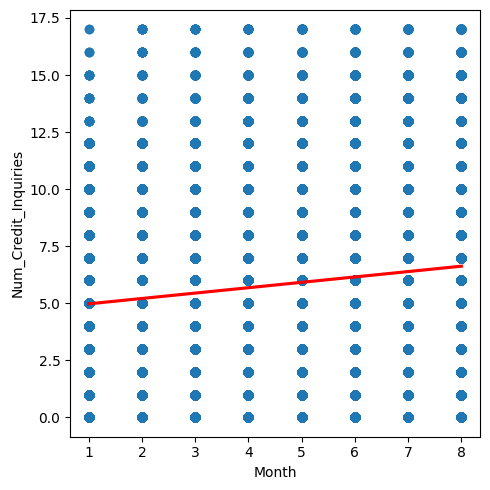

data have Spearman correlation with specification:
corr: 0.1328070412875036
pvalue: 0.0
Low corr between Month and Num_Credit_Inquiries
 
 
30. Month - Outstanding_Debt


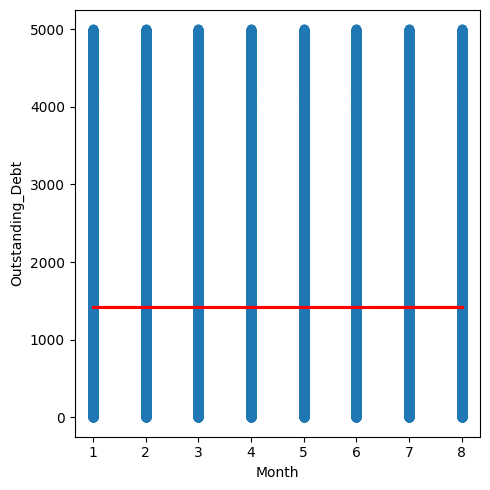

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Month and Outstanding_Debt
 
 
31. Month - Credit_Utilization_Ratio


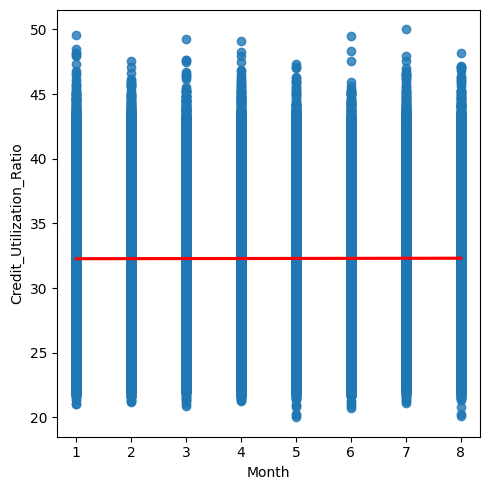

data have Spearman correlation with specification:
corr: 0.002623850840143315
pvalue: 0.4066939746579059
Low corr between Month and Credit_Utilization_Ratio
 
 
32. Month - Credit_History_Age


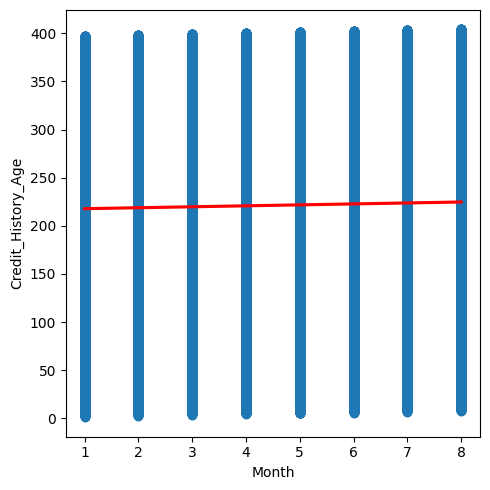

data have Spearman correlation with specification:
corr: 0.022735043980697426
pvalue: 6.46531030696212e-13
Low corr between Month and Credit_History_Age
 
 
33. Month - Total_EMI_per_month


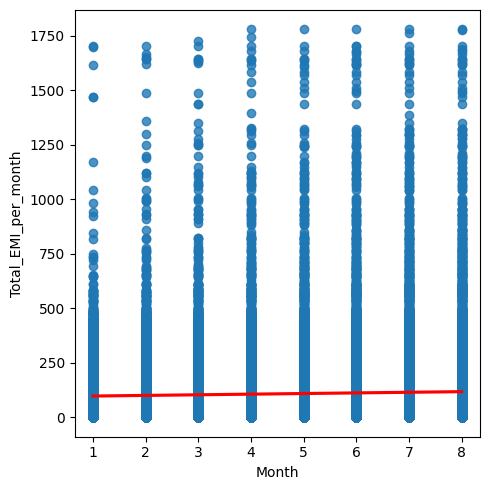

data have Spearman correlation with specification:
corr: 0.02627239440317693
pvalue: 9.61945552779358e-17
Low corr between Month and Total_EMI_per_month
 
 
34. Month - Amount_invested_monthly


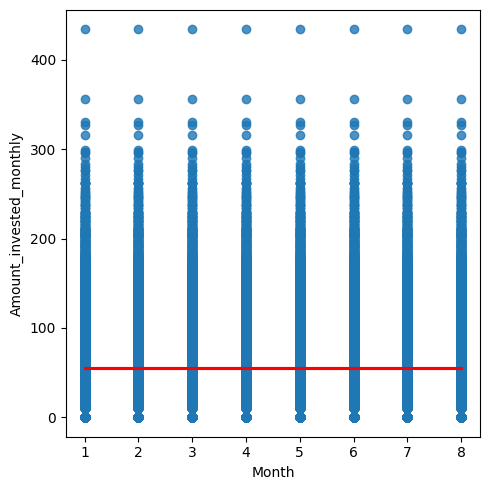

data have Spearman correlation with specification:
corr: 0.0
pvalue: 1.0
Low corr between Month and Amount_invested_monthly
 
 
35. Month - Monthly_Balance


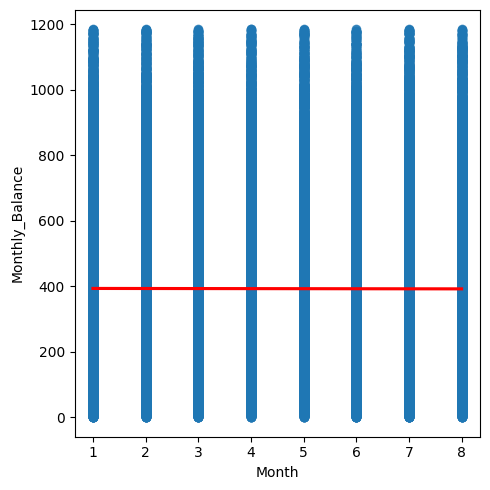

data have Spearman correlation with specification:
corr: -0.0019084526875976148
pvalue: 0.5461769564089247
Low corr between Month and Monthly_Balance
 
 
36. Age - Annual_Income


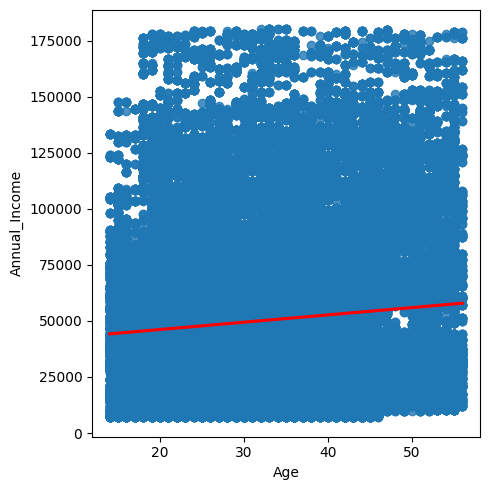

data have Spearman correlation with specification:
corr: 0.08462808488776691
pvalue: 2.502712793170772e-158
Low corr between Age and Annual_Income
 
 
37. Age - Monthly_Inhand_Salary


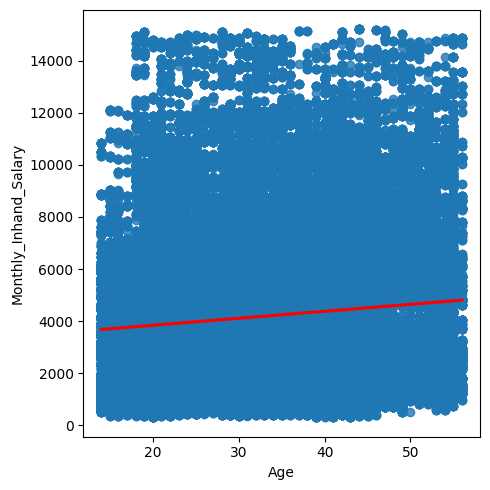

data have Spearman correlation with specification:
corr: 0.08250706080470879
pvalue: 1.449479368498735e-150
Low corr between Age and Monthly_Inhand_Salary
 
 
38. Age - Num_Bank_Accounts


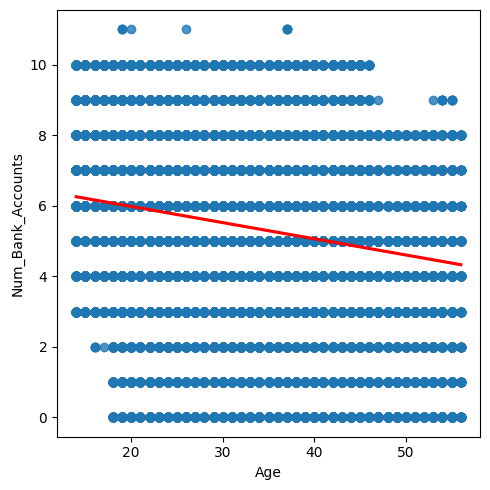

data have Spearman correlation with specification:
corr: -0.17535918915325113
pvalue: 0.0
Low corr between Age and Num_Bank_Accounts
 
 
39. Age - Num_Credit_Card


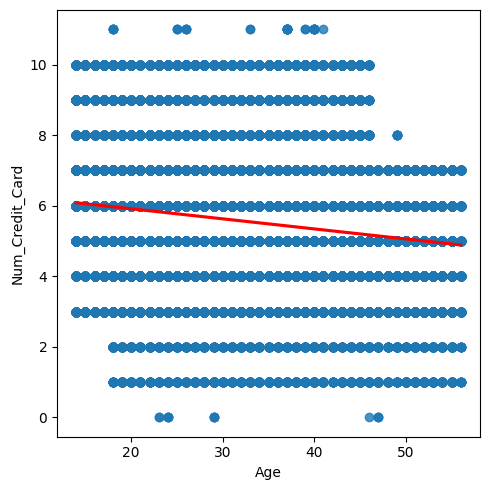

data have Spearman correlation with specification:
corr: -0.1325036406778306
pvalue: 0.0
Low corr between Age and Num_Credit_Card
 
 
40. Age - Interest_Rate


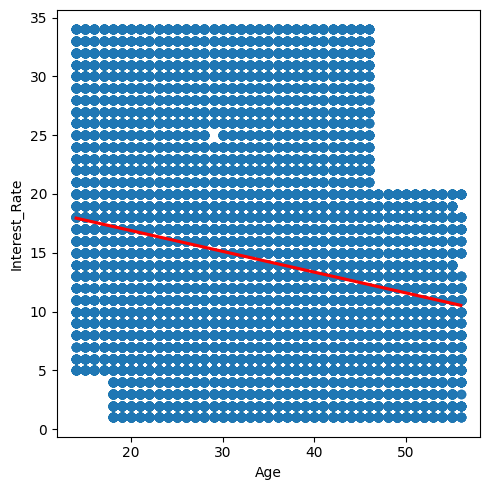

data have Spearman correlation with specification:
corr: -0.20267679307309777
pvalue: 0.0
Low corr between Age and Interest_Rate
 
 
41. Age - Num_of_Loan


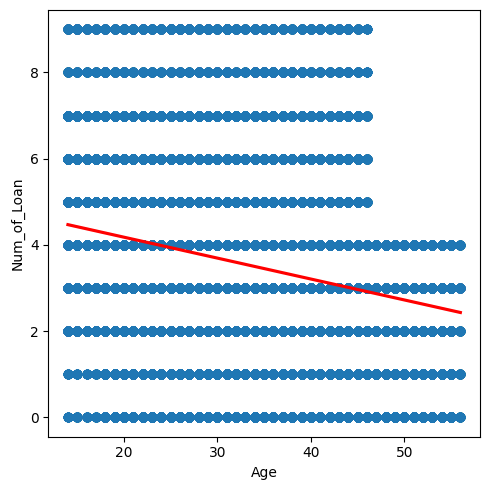

data have Spearman correlation with specification:
corr: -0.20029198301480952
pvalue: 0.0
Low corr between Age and Num_of_Loan
 
 
42. Age - Delay_from_due_date


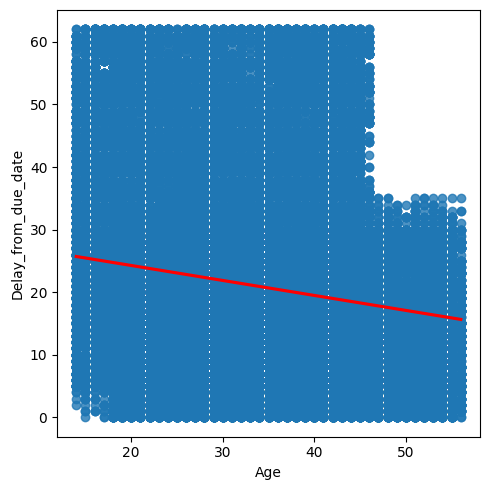

data have Spearman correlation with specification:
corr: -0.1637909488804615
pvalue: 0.0
Low corr between Age and Delay_from_due_date
 
 
43. Age - Num_of_Delayed_Payment


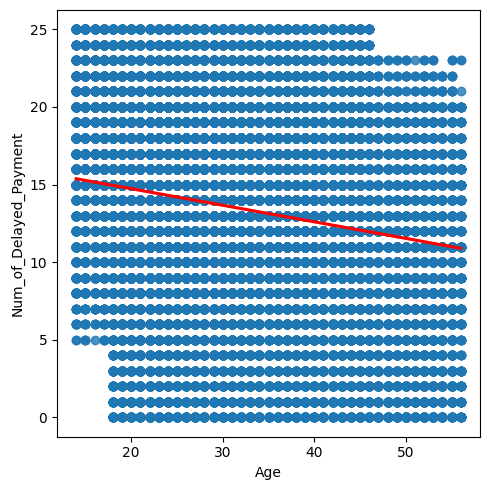

data have Spearman correlation with specification:
corr: -0.17134994036155635
pvalue: 0.0
Low corr between Age and Num_of_Delayed_Payment
 
 
44. Age - Changed_Credit_Limit


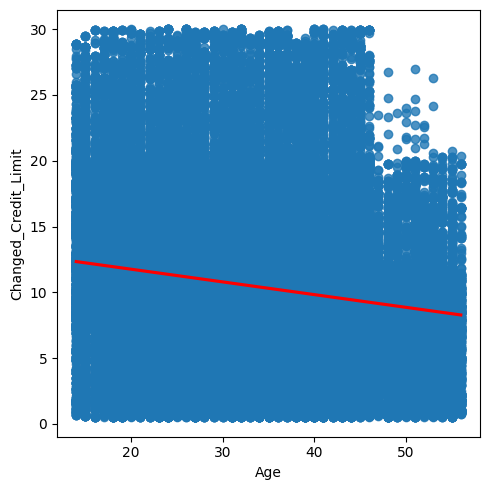

data have Spearman correlation with specification:
corr: -0.14776188183710176
pvalue: 0.0
Low corr between Age and Changed_Credit_Limit
 
 
45. Age - Num_Credit_Inquiries


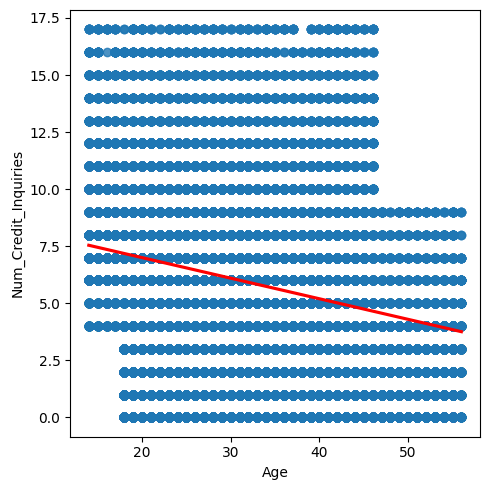

data have Spearman correlation with specification:
corr: -0.24315315752390923
pvalue: 0.0
Low corr between Age and Num_Credit_Inquiries
 
 
46. Age - Outstanding_Debt


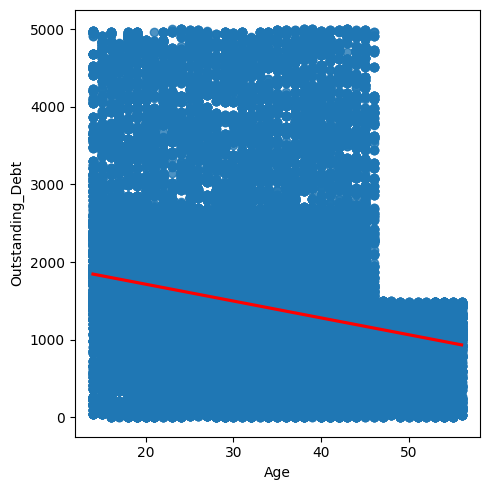

data have Spearman correlation with specification:
corr: -0.1975816739099637
pvalue: 0.0
Low corr between Age and Outstanding_Debt
 
 
47. Age - Credit_Utilization_Ratio


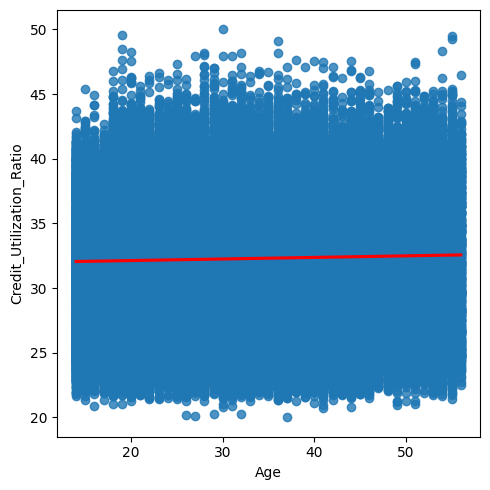

data have Spearman correlation with specification:
corr: 0.022717790883729817
pvalue: 6.728907929762434e-13
Low corr between Age and Credit_Utilization_Ratio
 
 
48. Age - Credit_History_Age


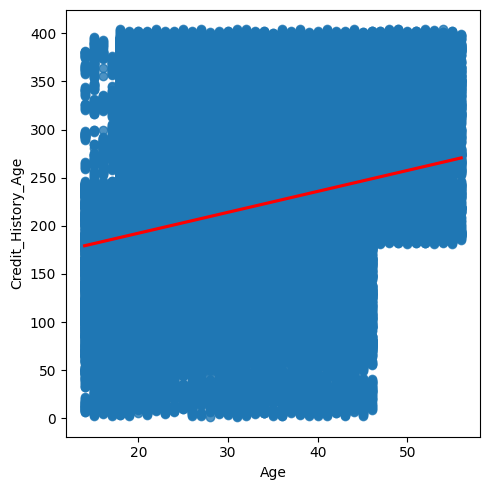

data have Spearman correlation with specification:
corr: 0.22468511127748472
pvalue: 0.0
Low corr between Age and Credit_History_Age
 
 
49. Age - Total_EMI_per_month


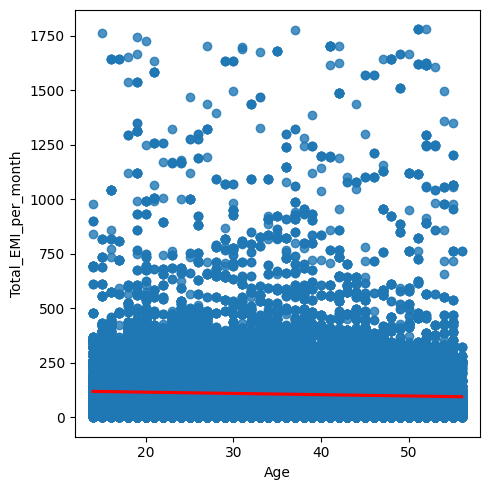

data have Spearman correlation with specification:
corr: -0.08507136530922449
pvalue: 5.63453004131173e-160
Low corr between Age and Total_EMI_per_month
 
 
50. Age - Amount_invested_monthly


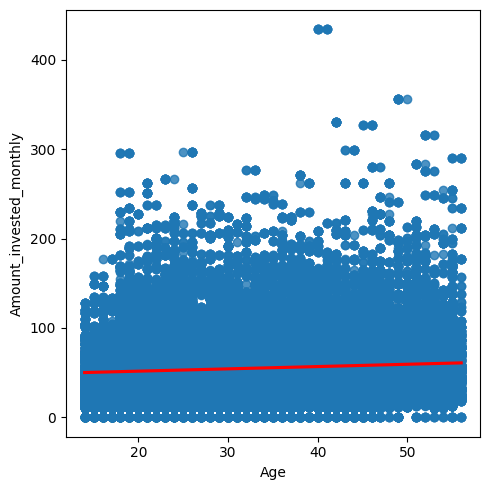

data have Spearman correlation with specification:
corr: 0.058701433339236074
pvalue: 4.769450582524111e-77
Low corr between Age and Amount_invested_monthly
 
 
51. Age - Monthly_Balance


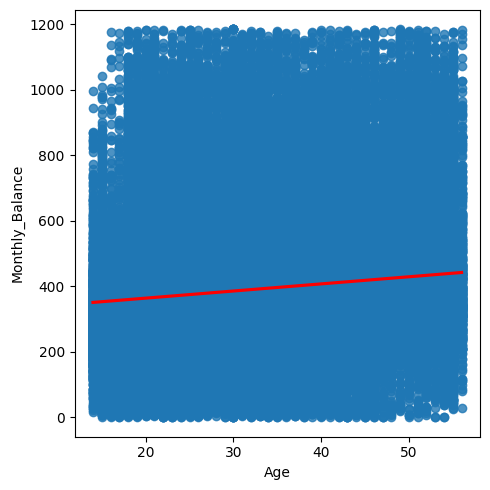

data have Spearman correlation with specification:
corr: 0.11603323529524111
pvalue: 9.912174768358601e-297
Low corr between Age and Monthly_Balance
 
 
52. Annual_Income - Monthly_Inhand_Salary


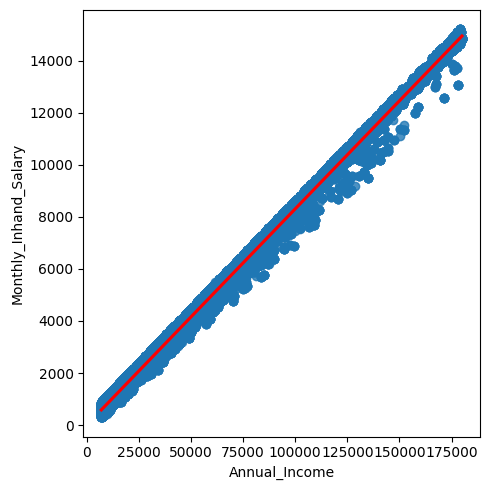

data have Spearman correlation with specification:
corr: 0.9944375509203287
pvalue: 0.0
High corr between Annual_Income and Monthly_Inhand_Salary
 
 
53. Annual_Income - Num_Bank_Accounts


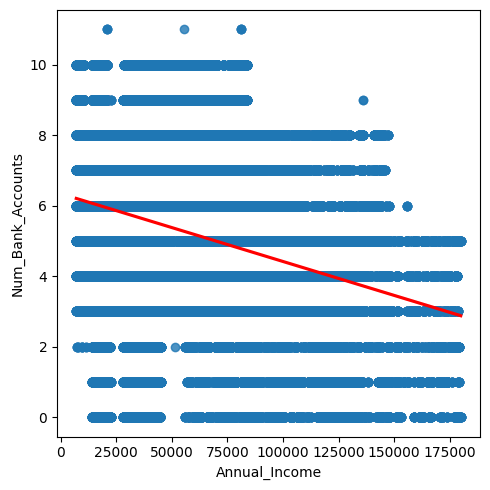

data have Spearman correlation with specification:
corr: -0.2719879450282102
pvalue: 0.0
Low corr between Annual_Income and Num_Bank_Accounts
 
 
54. Annual_Income - Num_Credit_Card


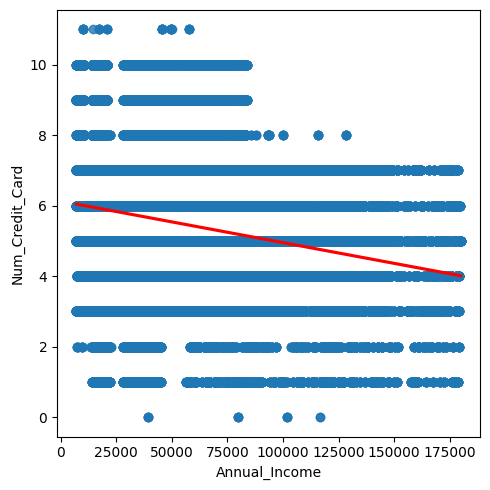

data have Spearman correlation with specification:
corr: -0.20555598038185793
pvalue: 0.0
Low corr between Annual_Income and Num_Credit_Card
 
 
55. Annual_Income - Interest_Rate


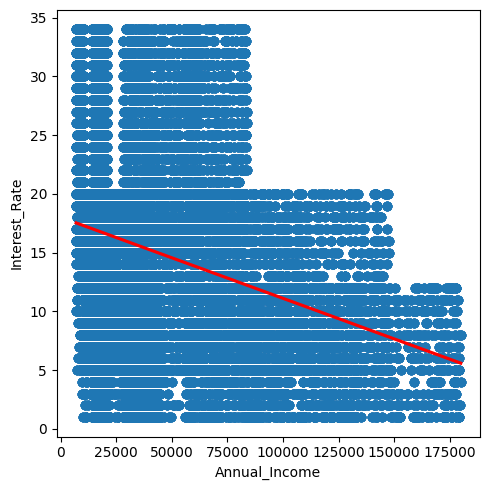

data have Spearman correlation with specification:
corr: -0.296941971322337
pvalue: 0.0
Low corr between Annual_Income and Interest_Rate
 
 
56. Annual_Income - Num_of_Loan


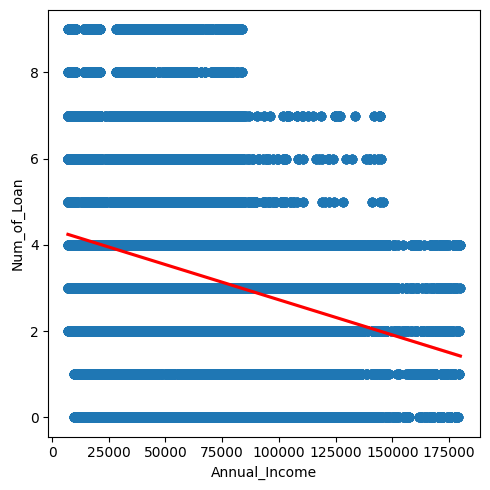

data have Spearman correlation with specification:
corr: -0.2500848058540933
pvalue: 0.0
Low corr between Annual_Income and Num_of_Loan
 
 
57. Annual_Income - Delay_from_due_date


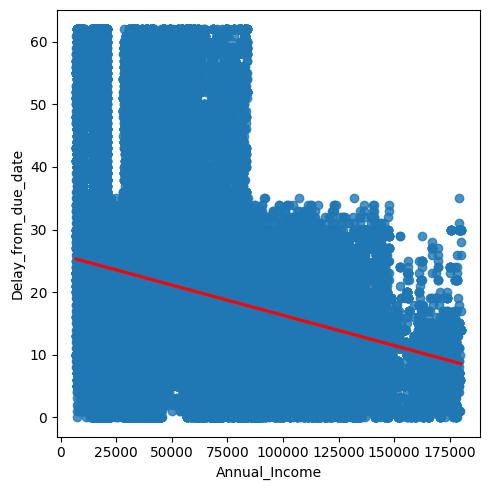

data have Spearman correlation with specification:
corr: -0.2433544615251316
pvalue: 0.0
Low corr between Annual_Income and Delay_from_due_date
 
 
58. Annual_Income - Num_of_Delayed_Payment


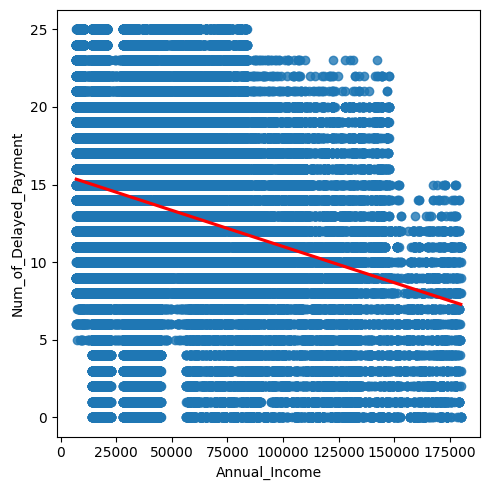

data have Spearman correlation with specification:
corr: -0.265905053108974
pvalue: 0.0
Low corr between Annual_Income and Num_of_Delayed_Payment
 
 
59. Annual_Income - Changed_Credit_Limit


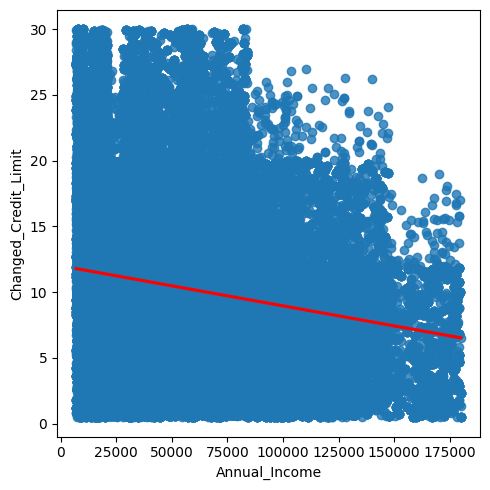

data have Spearman correlation with specification:
corr: -0.15847095597151592
pvalue: 0.0
Low corr between Annual_Income and Changed_Credit_Limit
 
 
60. Annual_Income - Num_Credit_Inquiries


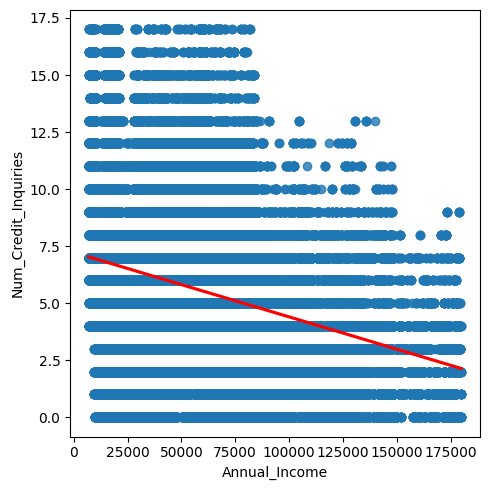

data have Spearman correlation with specification:
corr: -0.2787062494292327
pvalue: 0.0
Low corr between Annual_Income and Num_Credit_Inquiries
 
 
61. Annual_Income - Outstanding_Debt


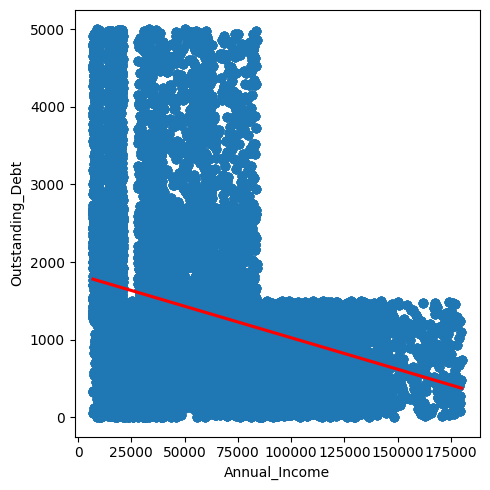

data have Spearman correlation with specification:
corr: -0.2770985714755855
pvalue: 0.0
Low corr between Annual_Income and Outstanding_Debt
 
 
62. Annual_Income - Credit_Utilization_Ratio


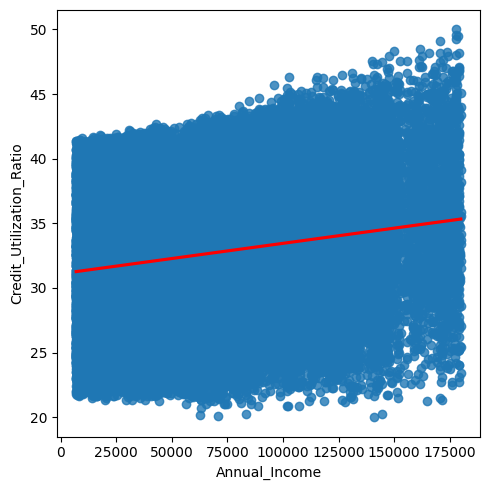

data have Spearman correlation with specification:
corr: 0.139267084231969
pvalue: 0.0
Low corr between Annual_Income and Credit_Utilization_Ratio
 
 
63. Annual_Income - Credit_History_Age


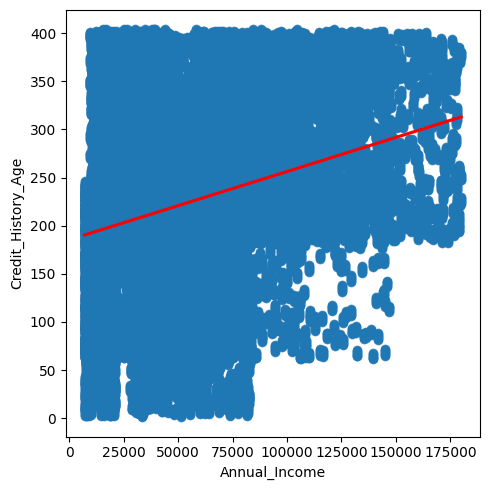

data have Spearman correlation with specification:
corr: 0.2736040322323793
pvalue: 0.0
Low corr between Annual_Income and Credit_History_Age
 
 
64. Annual_Income - Total_EMI_per_month


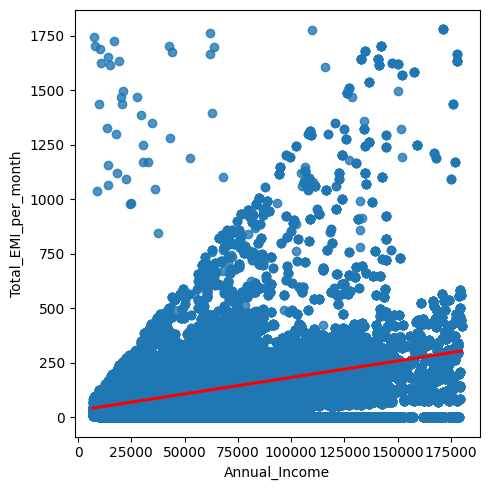

data have Spearman correlation with specification:
corr: 0.4904616327530233
pvalue: 0.0
Low corr between Annual_Income and Total_EMI_per_month
 
 
65. Annual_Income - Amount_invested_monthly


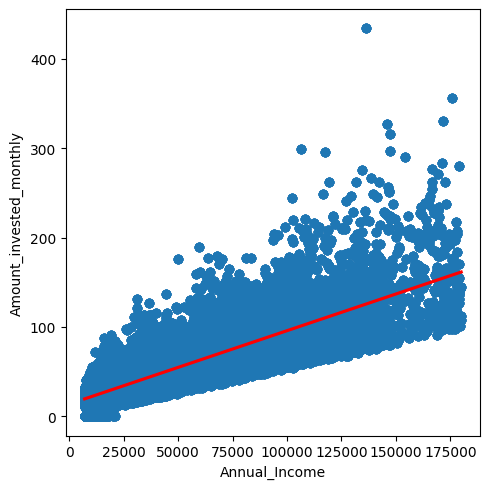

data have Spearman correlation with specification:
corr: 0.8170377500816699
pvalue: 0.0
High corr between Annual_Income and Amount_invested_monthly
 
 
66. Annual_Income - Monthly_Balance


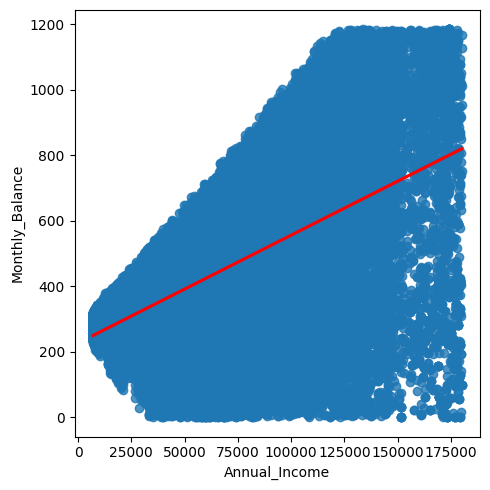

data have Spearman correlation with specification:
corr: 0.5450855857559681
pvalue: 0.0
Low corr between Annual_Income and Monthly_Balance
 
 
67. Monthly_Inhand_Salary - Num_Bank_Accounts


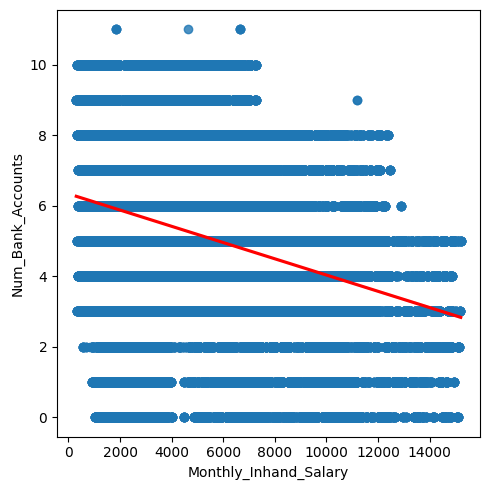

data have Spearman correlation with specification:
corr: -0.26834838249492
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Num_Bank_Accounts
 
 
68. Monthly_Inhand_Salary - Num_Credit_Card


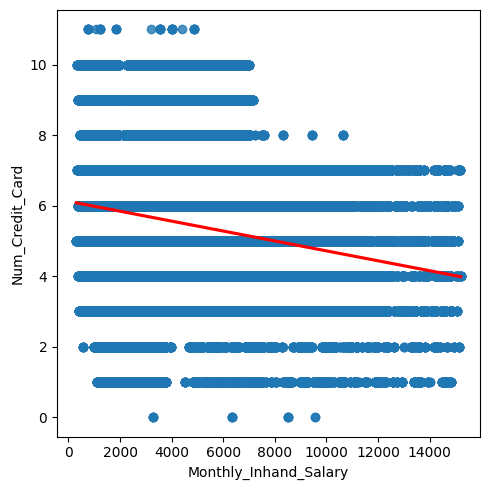

data have Spearman correlation with specification:
corr: -0.20202864564631243
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Num_Credit_Card
 
 
69. Monthly_Inhand_Salary - Interest_Rate


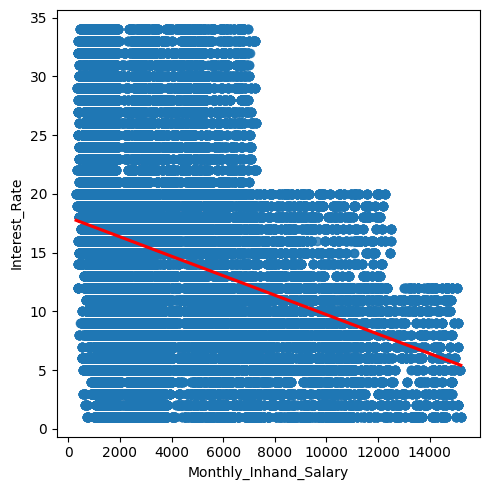

data have Spearman correlation with specification:
corr: -0.29449136100819473
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Interest_Rate
 
 
70. Monthly_Inhand_Salary - Num_of_Loan


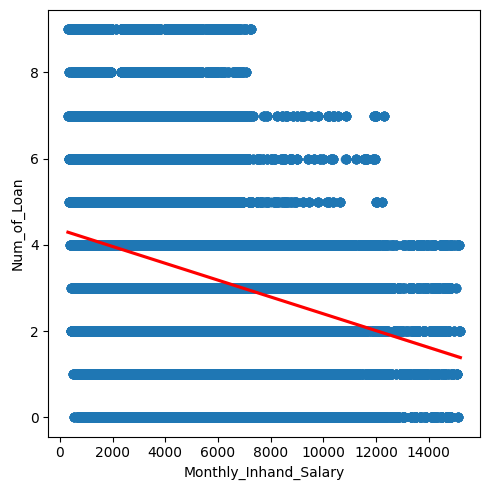

data have Spearman correlation with specification:
corr: -0.24718307191618072
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Num_of_Loan
 
 
71. Monthly_Inhand_Salary - Delay_from_due_date


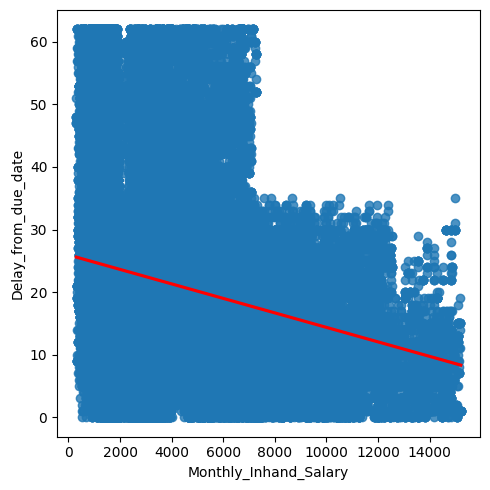

data have Spearman correlation with specification:
corr: -0.2410465801875499
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Delay_from_due_date
 
 
72. Monthly_Inhand_Salary - Num_of_Delayed_Payment


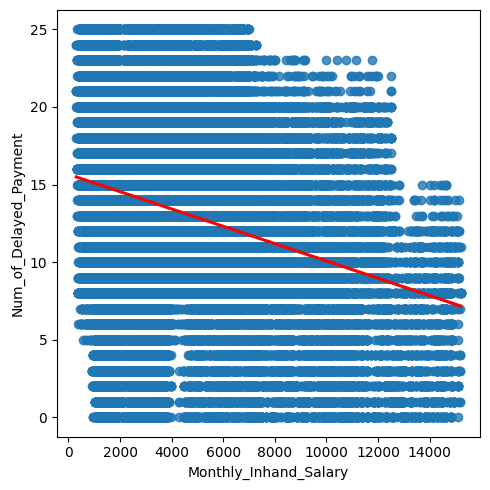

data have Spearman correlation with specification:
corr: -0.26272350303905884
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Num_of_Delayed_Payment
 
 
73. Monthly_Inhand_Salary - Changed_Credit_Limit


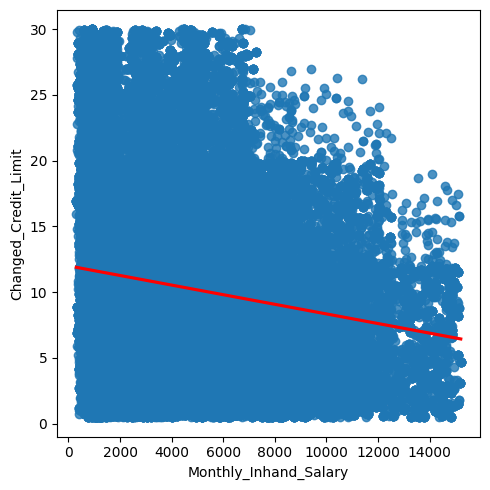

data have Spearman correlation with specification:
corr: -0.15749217377088282
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Changed_Credit_Limit
 
 
74. Monthly_Inhand_Salary - Num_Credit_Inquiries


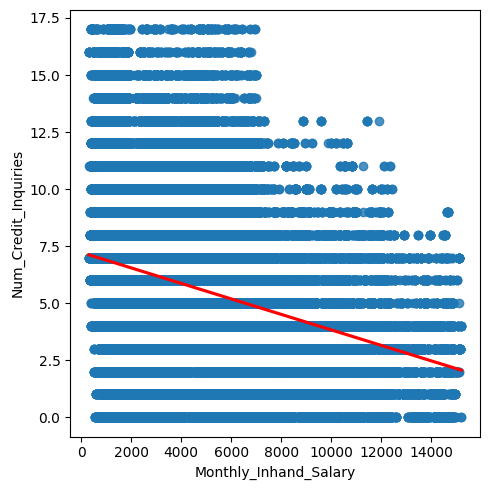

data have Spearman correlation with specification:
corr: -0.2755856925613225
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Num_Credit_Inquiries
 
 
75. Monthly_Inhand_Salary - Outstanding_Debt


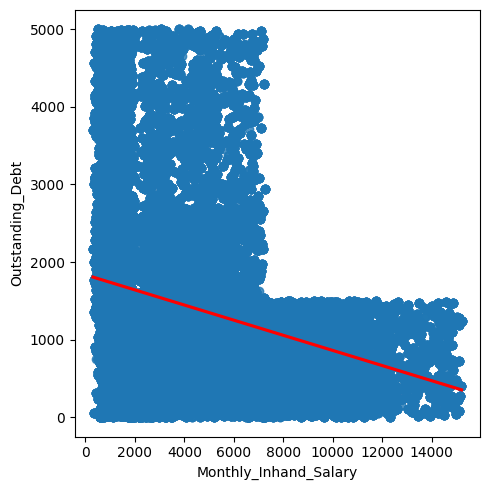

data have Spearman correlation with specification:
corr: -0.2749022080339873
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Outstanding_Debt
 
 
76. Monthly_Inhand_Salary - Credit_Utilization_Ratio


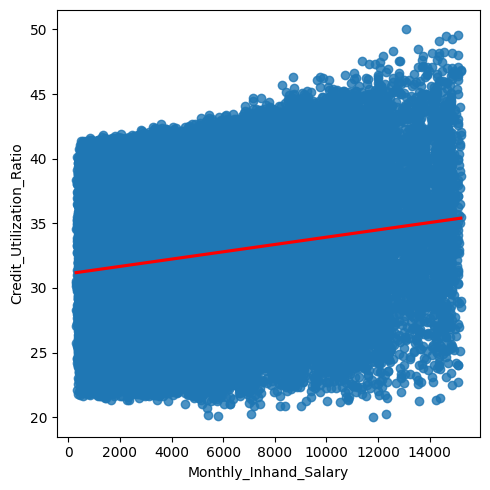

data have Spearman correlation with specification:
corr: 0.1400005713795955
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Credit_Utilization_Ratio
 
 
77. Monthly_Inhand_Salary - Credit_History_Age


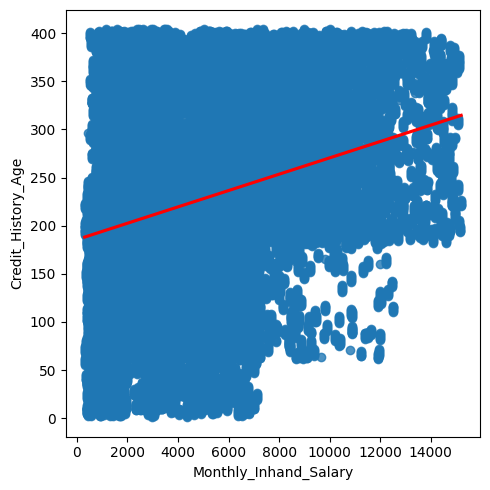

data have Spearman correlation with specification:
corr: 0.2707248349400711
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Credit_History_Age
 
 
78. Monthly_Inhand_Salary - Total_EMI_per_month


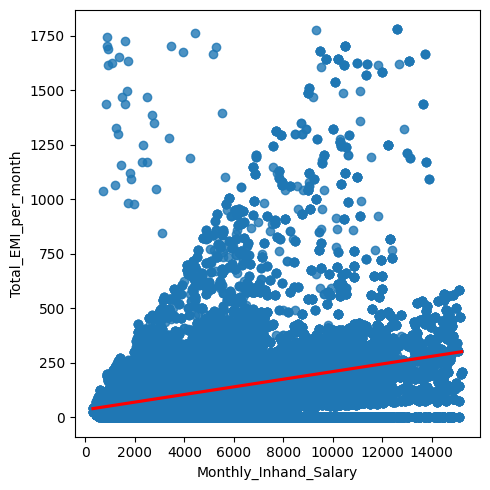

data have Spearman correlation with specification:
corr: 0.4842718593078933
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Total_EMI_per_month
 
 
79. Monthly_Inhand_Salary - Amount_invested_monthly


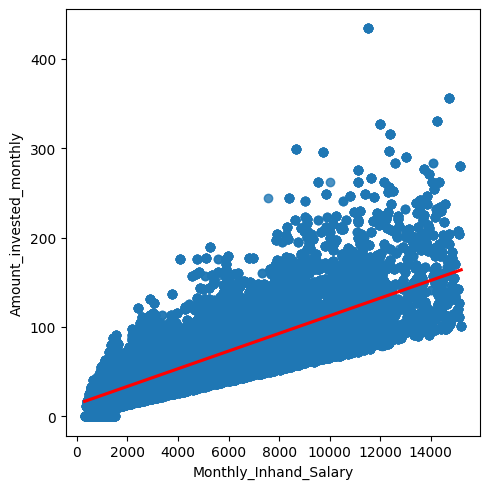

data have Spearman correlation with specification:
corr: 0.8185642527414851
pvalue: 0.0
High corr between Monthly_Inhand_Salary and Amount_invested_monthly
 
 
80. Monthly_Inhand_Salary - Monthly_Balance


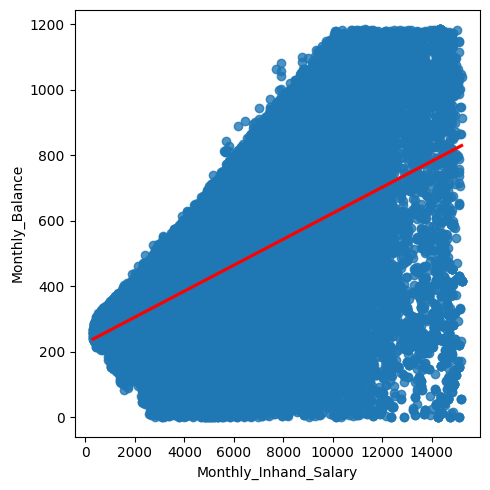

data have Spearman correlation with specification:
corr: 0.5498354635440131
pvalue: 0.0
Low corr between Monthly_Inhand_Salary and Monthly_Balance
 
 
81. Num_Bank_Accounts - Num_Credit_Card


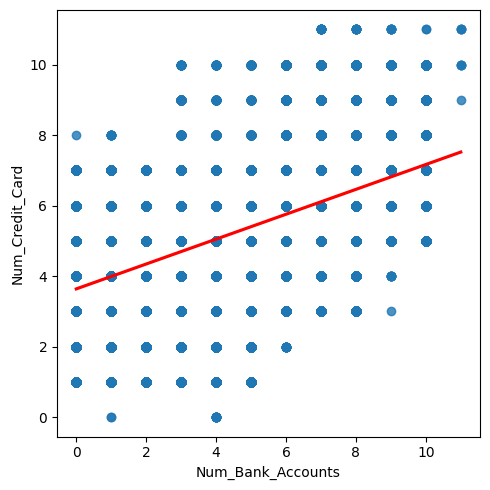

data have Spearman correlation with specification:
corr: 0.42780404480804973
pvalue: 0.0
Low corr between Num_Bank_Accounts and Num_Credit_Card
 
 
82. Num_Bank_Accounts - Interest_Rate


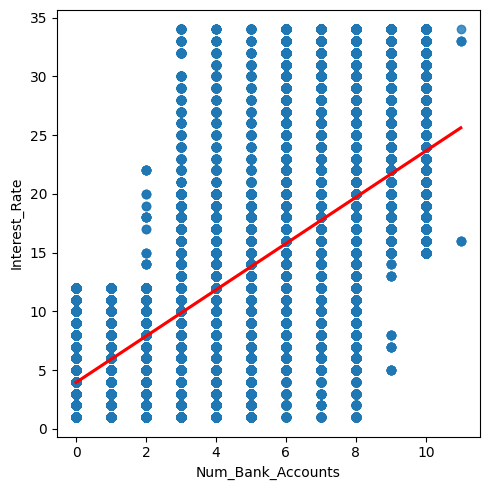

data have Spearman correlation with specification:
corr: 0.5920320415281085
pvalue: 0.0
Low corr between Num_Bank_Accounts and Interest_Rate
 
 
83. Num_Bank_Accounts - Num_of_Loan


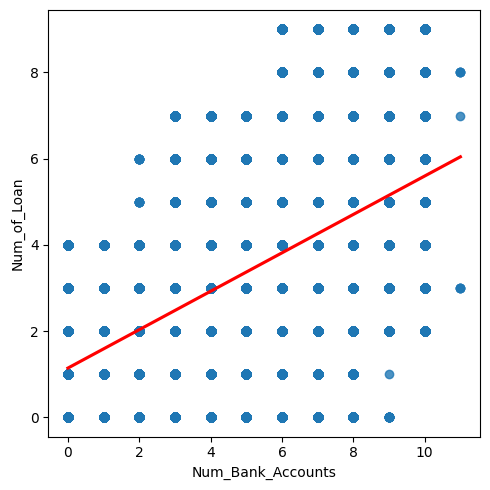

data have Spearman correlation with specification:
corr: 0.45822224691556257
pvalue: 0.0
Low corr between Num_Bank_Accounts and Num_of_Loan
 
 
84. Num_Bank_Accounts - Delay_from_due_date


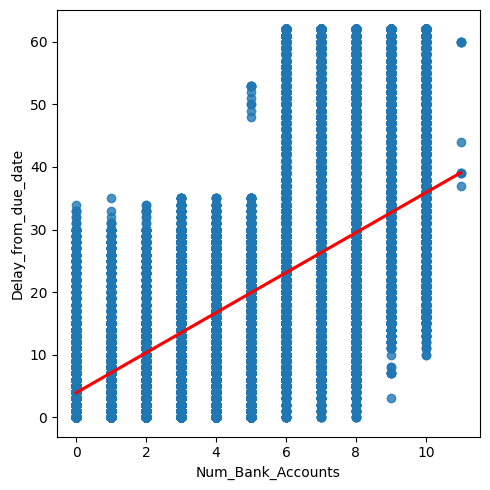

data have Spearman correlation with specification:
corr: 0.5704599748802018
pvalue: 0.0
Low corr between Num_Bank_Accounts and Delay_from_due_date
 
 
85. Num_Bank_Accounts - Num_of_Delayed_Payment


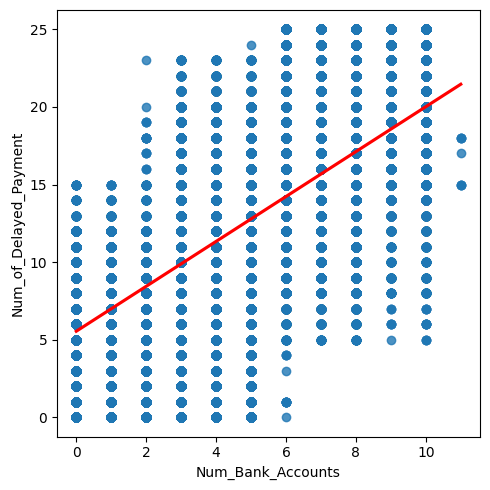

data have Spearman correlation with specification:
corr: 0.589180731333574
pvalue: 0.0
Low corr between Num_Bank_Accounts and Num_of_Delayed_Payment
 
 
86. Num_Bank_Accounts - Changed_Credit_Limit


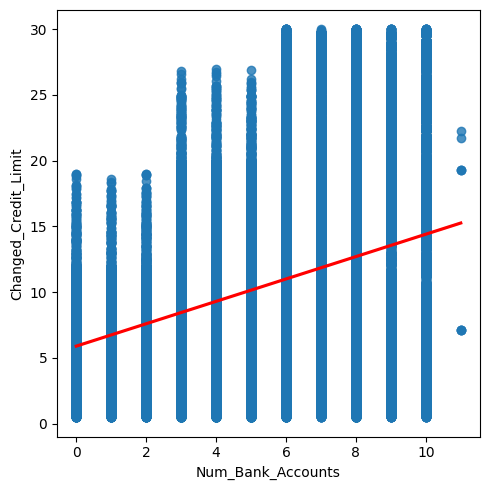

data have Spearman correlation with specification:
corr: 0.2963426266184453
pvalue: 0.0
Low corr between Num_Bank_Accounts and Changed_Credit_Limit
 
 
87. Num_Bank_Accounts - Num_Credit_Inquiries


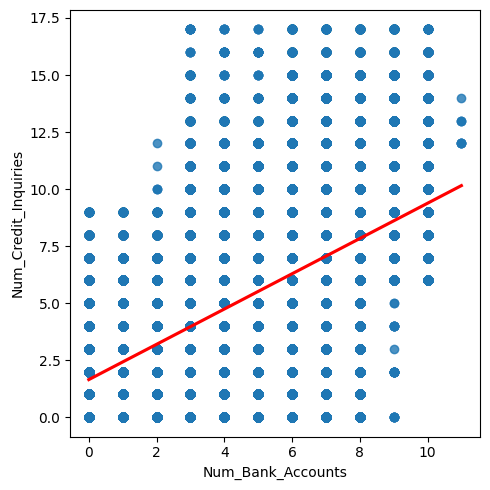

data have Spearman correlation with specification:
corr: 0.5225215308427623
pvalue: 0.0
Low corr between Num_Bank_Accounts and Num_Credit_Inquiries
 
 
88. Num_Bank_Accounts - Outstanding_Debt


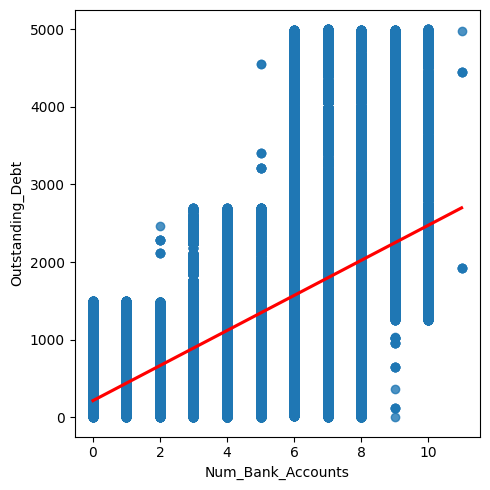

data have Spearman correlation with specification:
corr: 0.4982939632293612
pvalue: 0.0
Low corr between Num_Bank_Accounts and Outstanding_Debt
 
 
89. Num_Bank_Accounts - Credit_Utilization_Ratio


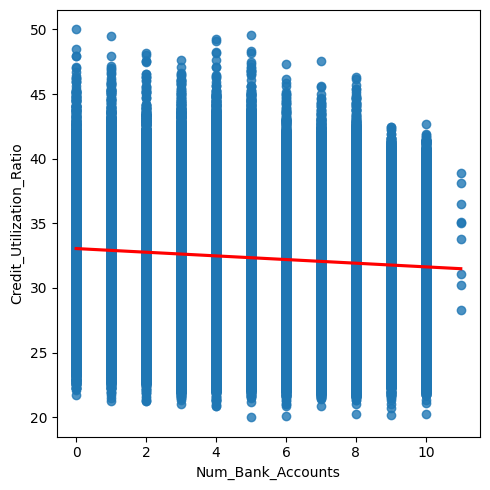

data have Spearman correlation with specification:
corr: -0.06519471059311764
pvalue: 1.249350828746752e-94
Low corr between Num_Bank_Accounts and Credit_Utilization_Ratio
 
 
90. Num_Bank_Accounts - Credit_History_Age


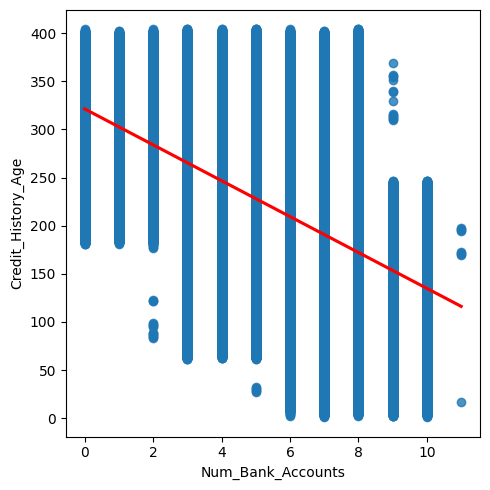

data have Spearman correlation with specification:
corr: -0.4914129489562446
pvalue: 0.0
Low corr between Num_Bank_Accounts and Credit_History_Age
 
 
91. Num_Bank_Accounts - Total_EMI_per_month


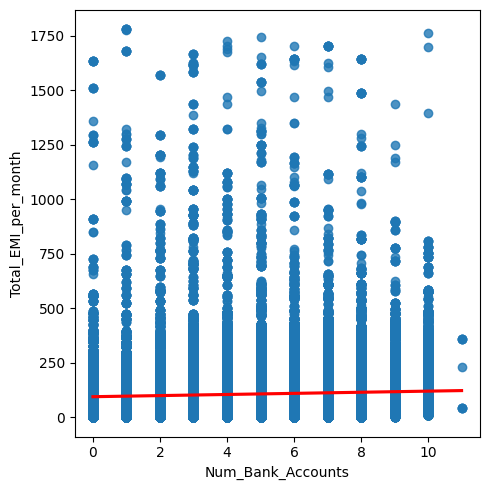

data have Spearman correlation with specification:
corr: 0.1244647560485518
pvalue: 0.0
Low corr between Num_Bank_Accounts and Total_EMI_per_month
 
 
92. Num_Bank_Accounts - Amount_invested_monthly


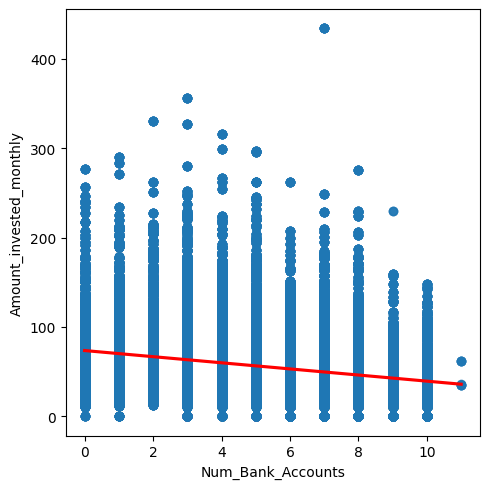

data have Spearman correlation with specification:
corr: -0.2155001826777827
pvalue: 0.0
Low corr between Num_Bank_Accounts and Amount_invested_monthly
 
 
93. Num_Bank_Accounts - Monthly_Balance


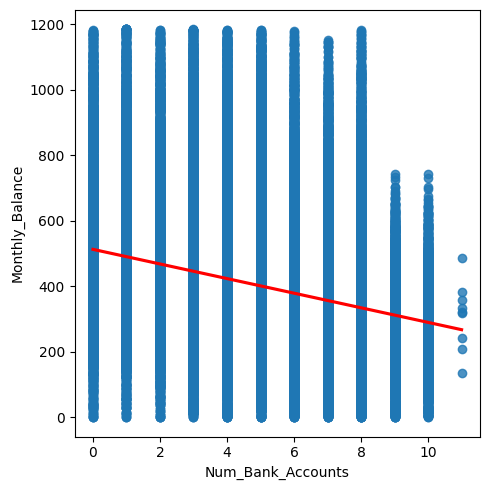

data have Spearman correlation with specification:
corr: -0.2980429898481789
pvalue: 0.0
Low corr between Num_Bank_Accounts and Monthly_Balance
 
 
94. Num_Credit_Card - Interest_Rate


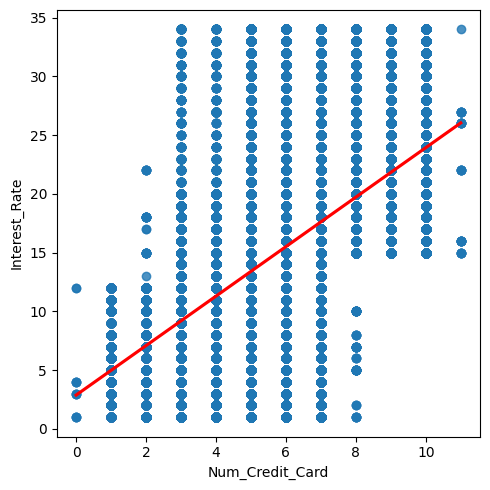

data have Spearman correlation with specification:
corr: 0.4669880566725196
pvalue: 0.0
Low corr between Num_Credit_Card and Interest_Rate
 
 
95. Num_Credit_Card - Num_of_Loan


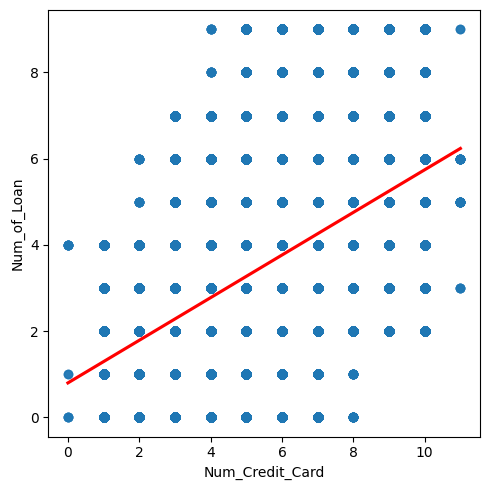

data have Spearman correlation with specification:
corr: 0.3843516684700564
pvalue: 0.0
Low corr between Num_Credit_Card and Num_of_Loan
 
 
96. Num_Credit_Card - Delay_from_due_date


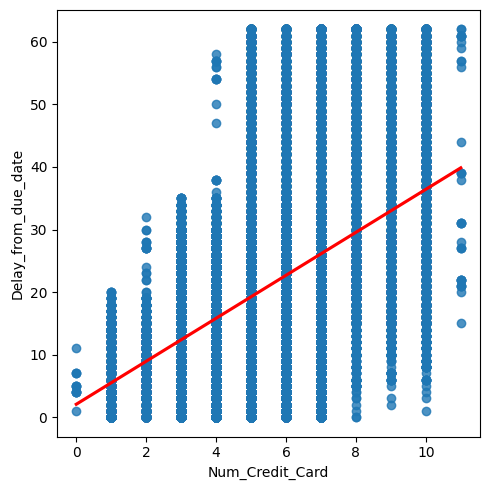

data have Spearman correlation with specification:
corr: 0.44273025227364426
pvalue: 0.0
Low corr between Num_Credit_Card and Delay_from_due_date
 
 
97. Num_Credit_Card - Num_of_Delayed_Payment


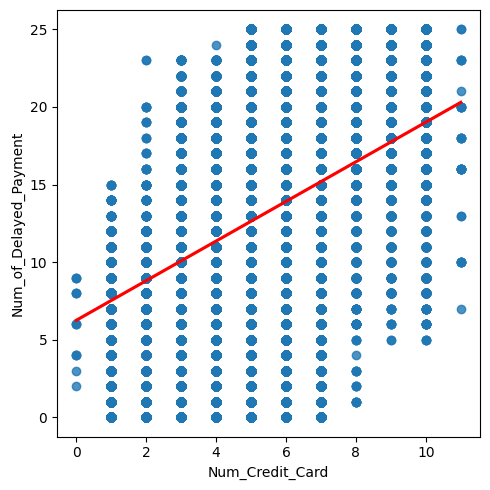

data have Spearman correlation with specification:
corr: 0.405322220005463
pvalue: 0.0
Low corr between Num_Credit_Card and Num_of_Delayed_Payment
 
 
98. Num_Credit_Card - Changed_Credit_Limit


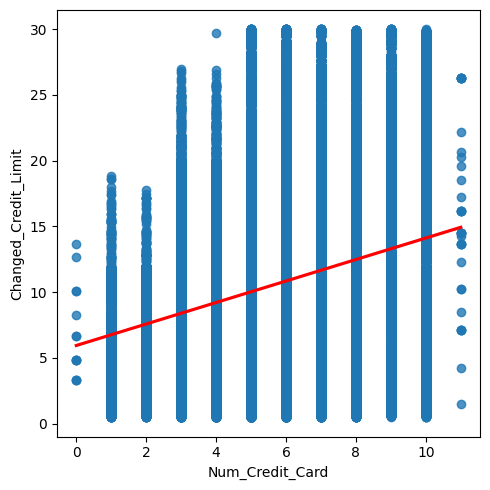

data have Spearman correlation with specification:
corr: 0.2022735024546288
pvalue: 0.0
Low corr between Num_Credit_Card and Changed_Credit_Limit
 
 
99. Num_Credit_Card - Num_Credit_Inquiries


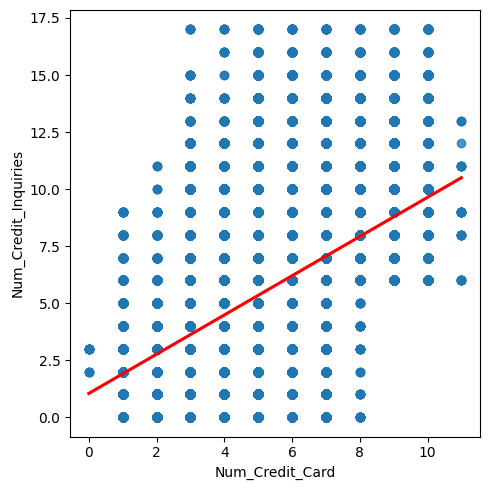

data have Spearman correlation with specification:
corr: 0.4335303131295071
pvalue: 0.0
Low corr between Num_Credit_Card and Num_Credit_Inquiries
 
 
100. Num_Credit_Card - Outstanding_Debt


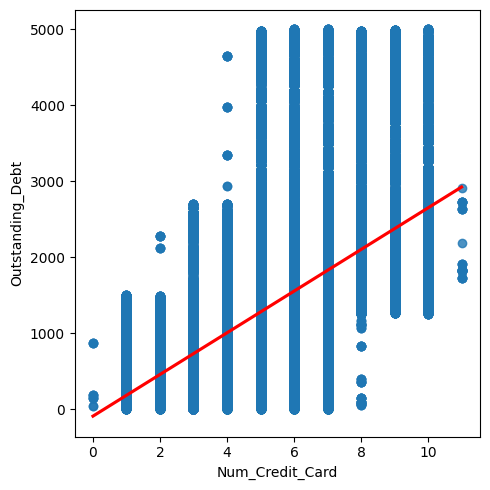

data have Spearman correlation with specification:
corr: 0.4587804288267066
pvalue: 0.0
Low corr between Num_Credit_Card and Outstanding_Debt
 
 
101. Num_Credit_Card - Credit_Utilization_Ratio


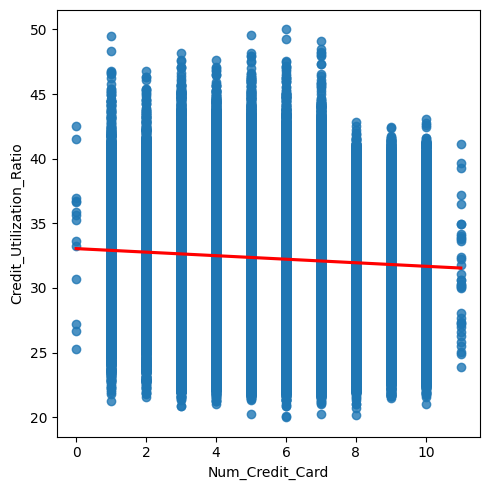

data have Spearman correlation with specification:
corr: -0.04868763246819863
pvalue: 1.5073023157702366e-53
Low corr between Num_Credit_Card and Credit_Utilization_Ratio
 
 
102. Num_Credit_Card - Credit_History_Age


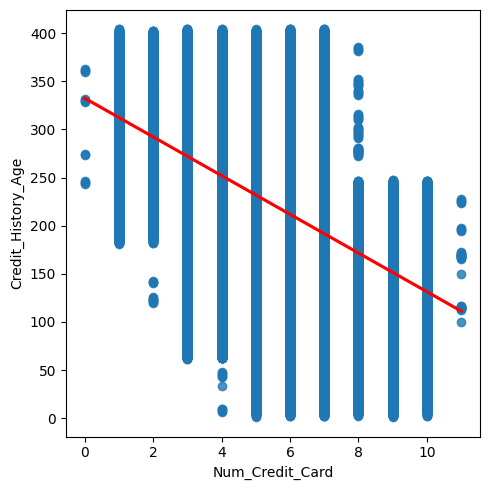

data have Spearman correlation with specification:
corr: -0.40212326654428177
pvalue: 0.0
Low corr between Num_Credit_Card and Credit_History_Age
 
 
103. Num_Credit_Card - Total_EMI_per_month


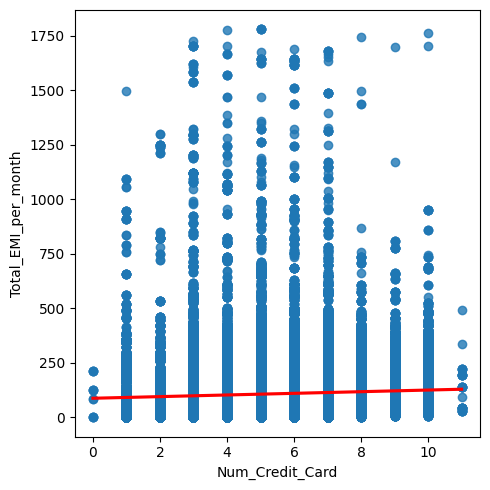

data have Spearman correlation with specification:
corr: 0.12136395355850105
pvalue: 0.0
Low corr between Num_Credit_Card and Total_EMI_per_month
 
 
104. Num_Credit_Card - Amount_invested_monthly


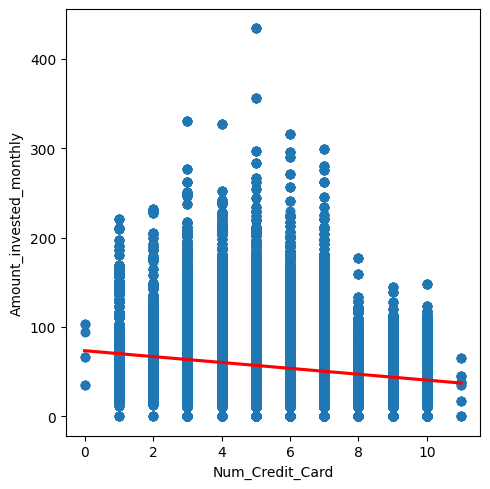

data have Spearman correlation with specification:
corr: -0.16532921711153883
pvalue: 0.0
Low corr between Num_Credit_Card and Amount_invested_monthly
 
 
105. Num_Credit_Card - Monthly_Balance


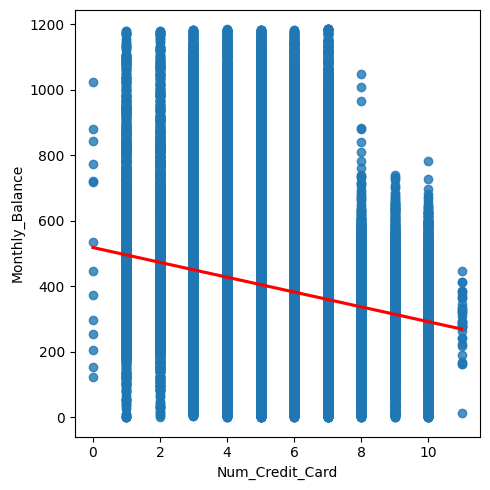

data have Spearman correlation with specification:
corr: -0.23978222308459496
pvalue: 0.0
Low corr between Num_Credit_Card and Monthly_Balance
 
 
106. Interest_Rate - Num_of_Loan


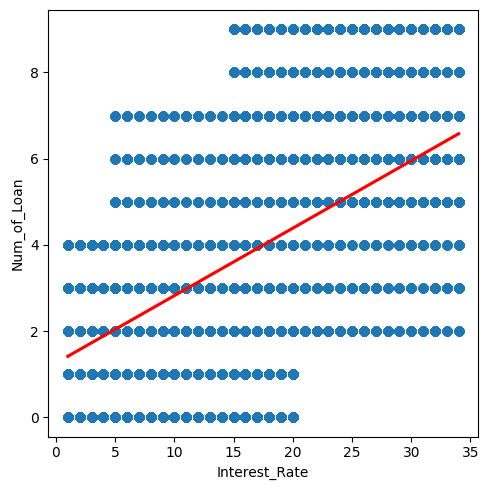

data have Spearman correlation with specification:
corr: 0.5318646176921225
pvalue: 0.0
Low corr between Interest_Rate and Num_of_Loan
 
 
107. Interest_Rate - Delay_from_due_date


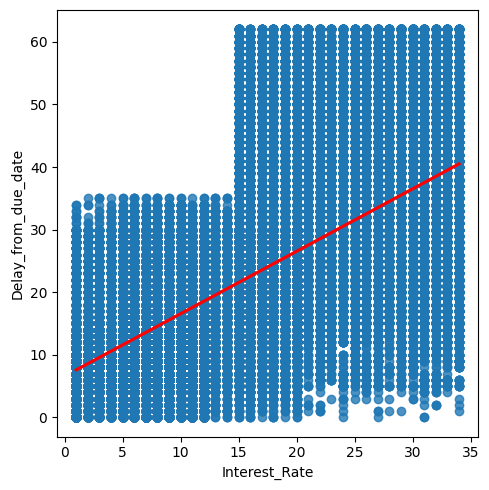

data have Spearman correlation with specification:
corr: 0.5729373552796653
pvalue: 0.0
Low corr between Interest_Rate and Delay_from_due_date
 
 
108. Interest_Rate - Num_of_Delayed_Payment


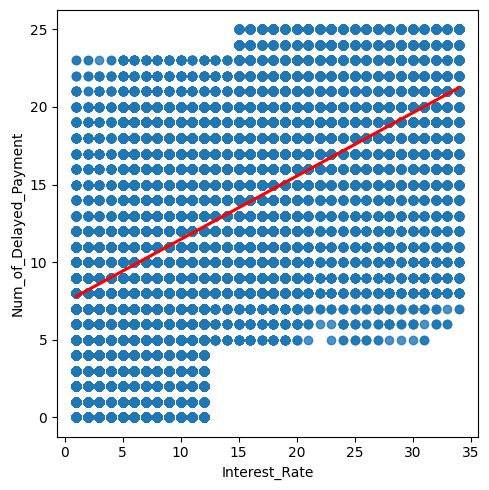

data have Spearman correlation with specification:
corr: 0.5805760644169288
pvalue: 0.0
Low corr between Interest_Rate and Num_of_Delayed_Payment
 
 
109. Interest_Rate - Changed_Credit_Limit


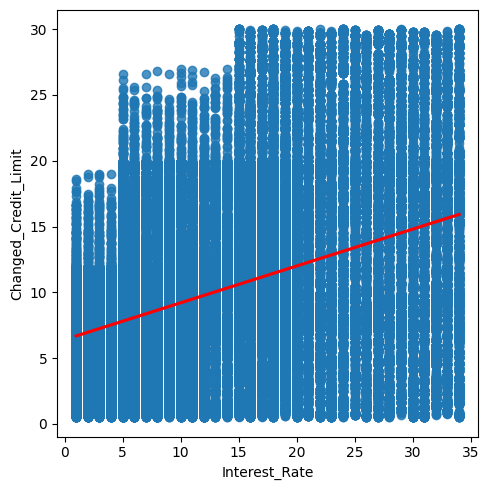

data have Spearman correlation with specification:
corr: 0.34261675529781754
pvalue: 0.0
Low corr between Interest_Rate and Changed_Credit_Limit
 
 
110. Interest_Rate - Num_Credit_Inquiries


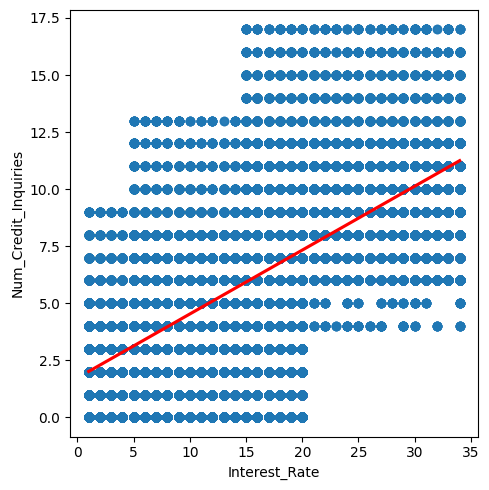

data have Spearman correlation with specification:
corr: 0.6265480123296522
pvalue: 0.0
High corr between Interest_Rate and Num_Credit_Inquiries
 
 
111. Interest_Rate - Outstanding_Debt


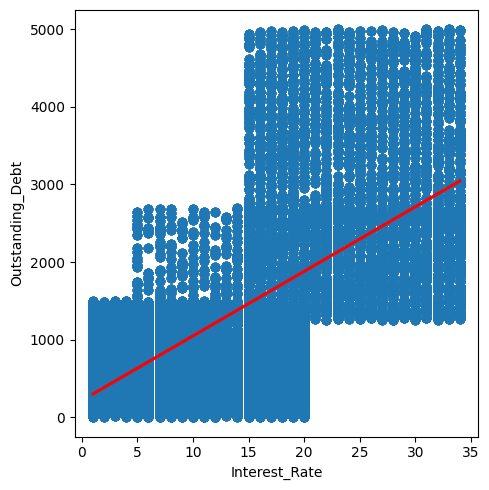

data have Spearman correlation with specification:
corr: 0.6107080530987232
pvalue: 0.0
High corr between Interest_Rate and Outstanding_Debt
 
 
112. Interest_Rate - Credit_Utilization_Ratio


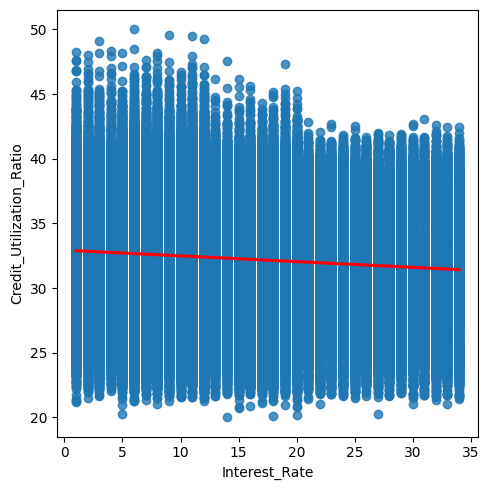

data have Spearman correlation with specification:
corr: -0.07000025979020477
pvalue: 7.827403332423435e-109
Low corr between Interest_Rate and Credit_Utilization_Ratio
 
 
113. Interest_Rate - Credit_History_Age


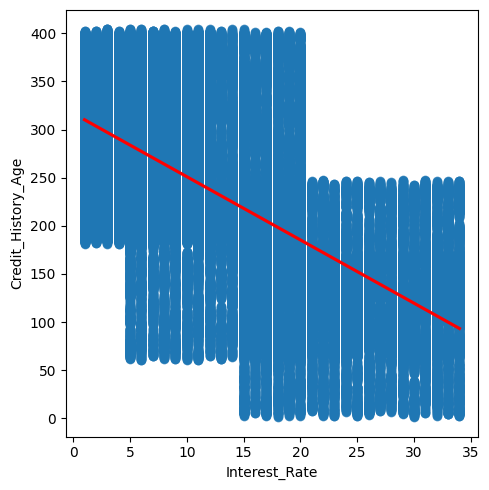

data have Spearman correlation with specification:
corr: -0.5752606755690227
pvalue: 0.0
Low corr between Interest_Rate and Credit_History_Age
 
 
114. Interest_Rate - Total_EMI_per_month


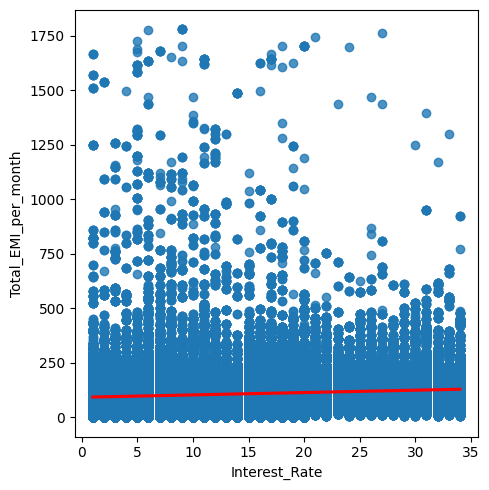

data have Spearman correlation with specification:
corr: 0.1612048779504477
pvalue: 0.0
Low corr between Interest_Rate and Total_EMI_per_month
 
 
115. Interest_Rate - Amount_invested_monthly


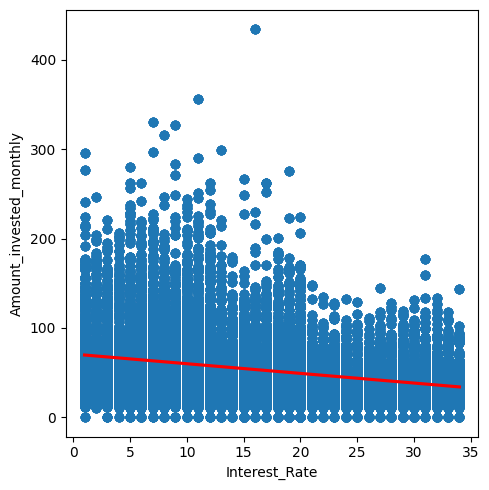

data have Spearman correlation with specification:
corr: -0.2372070011234787
pvalue: 0.0
Low corr between Interest_Rate and Amount_invested_monthly
 
 
116. Interest_Rate - Monthly_Balance


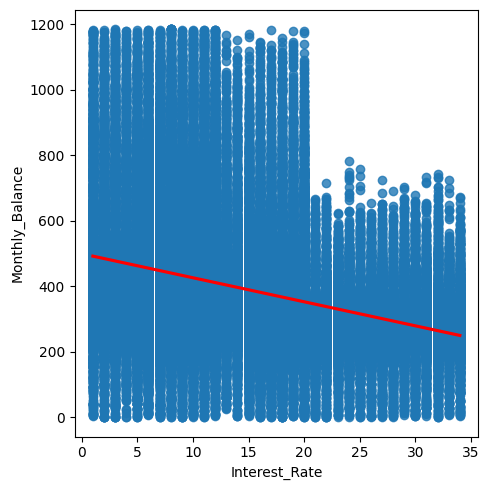

data have Spearman correlation with specification:
corr: -0.33305232512127086
pvalue: 0.0
Low corr between Interest_Rate and Monthly_Balance
 
 
117. Num_of_Loan - Delay_from_due_date


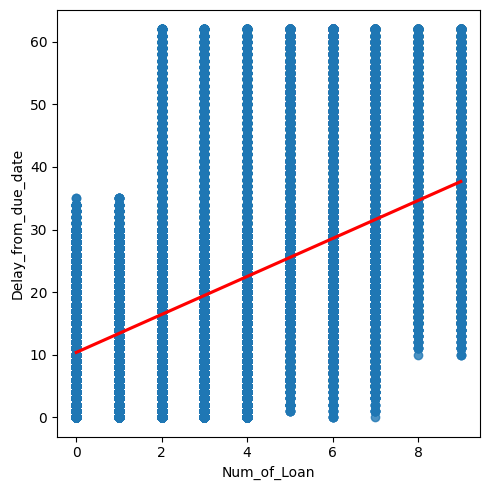

data have Spearman correlation with specification:
corr: 0.4552171201510568
pvalue: 0.0
Low corr between Num_of_Loan and Delay_from_due_date
 
 
118. Num_of_Loan - Num_of_Delayed_Payment


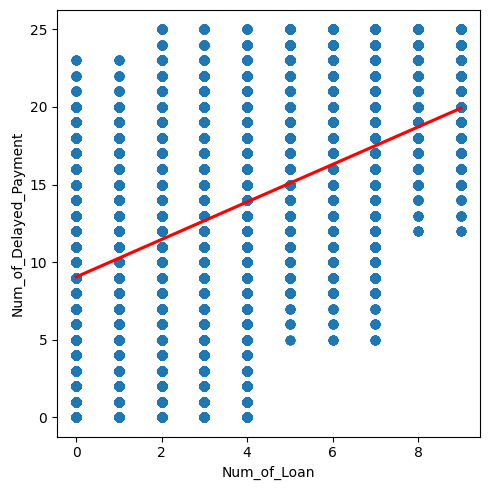

data have Spearman correlation with specification:
corr: 0.4586005774191928
pvalue: 0.0
Low corr between Num_of_Loan and Num_of_Delayed_Payment
 
 
119. Num_of_Loan - Changed_Credit_Limit


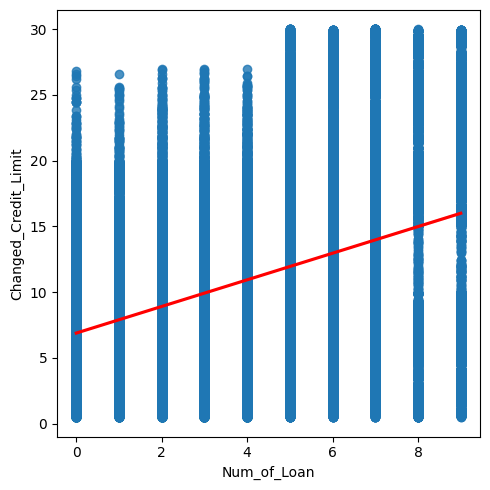

data have Spearman correlation with specification:
corr: 0.3126016140164711
pvalue: 0.0
Low corr between Num_of_Loan and Changed_Credit_Limit
 
 
120. Num_of_Loan - Num_Credit_Inquiries


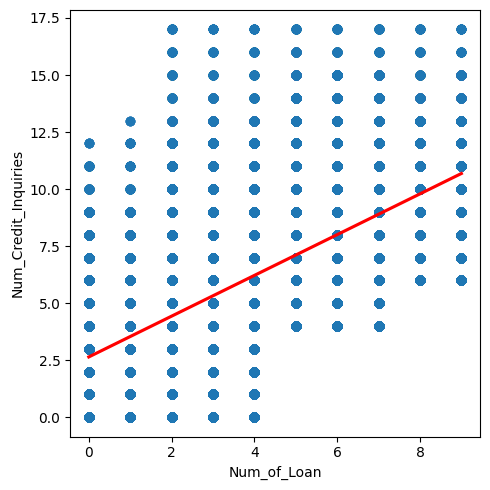

data have Spearman correlation with specification:
corr: 0.5594192878182047
pvalue: 0.0
Low corr between Num_of_Loan and Num_Credit_Inquiries
 
 
121. Num_of_Loan - Outstanding_Debt


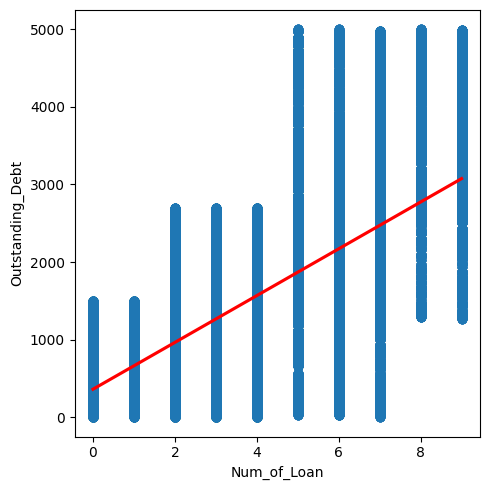

data have Spearman correlation with specification:
corr: 0.5591265676740986
pvalue: 0.0
Low corr between Num_of_Loan and Outstanding_Debt
 
 
122. Num_of_Loan - Credit_Utilization_Ratio


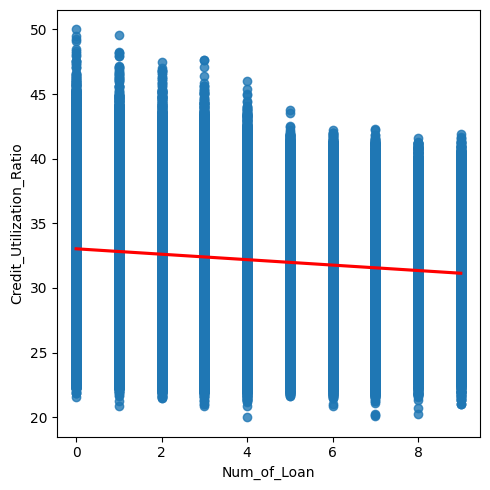

data have Spearman correlation with specification:
corr: -0.09407079724620639
pvalue: 2.6069860624903086e-195
Low corr between Num_of_Loan and Credit_Utilization_Ratio
 
 
123. Num_of_Loan - Credit_History_Age


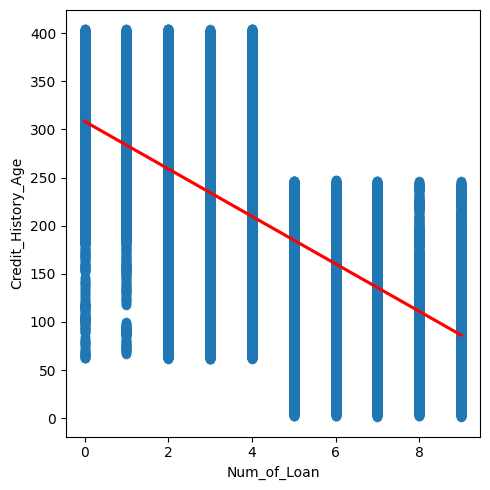

data have Spearman correlation with specification:
corr: -0.5960694763597529
pvalue: 0.0
Low corr between Num_of_Loan and Credit_History_Age
 
 
124. Num_of_Loan - Total_EMI_per_month


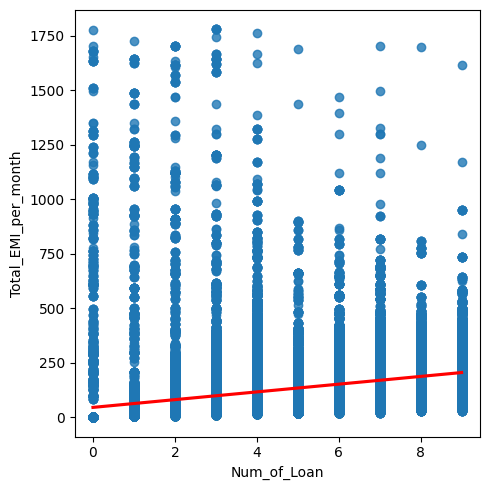

data have Spearman correlation with specification:
corr: 0.5815168564966096
pvalue: 0.0
Low corr between Num_of_Loan and Total_EMI_per_month
 
 
125. Num_of_Loan - Amount_invested_monthly


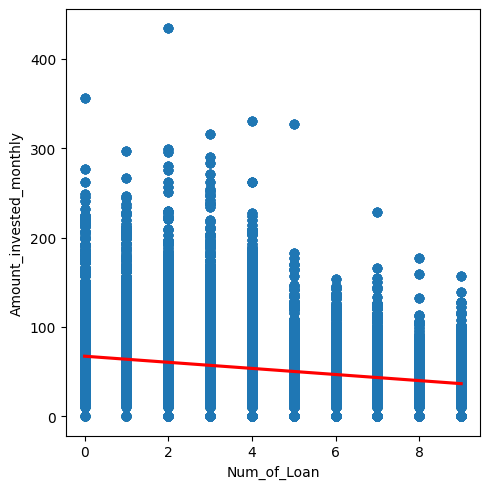

data have Spearman correlation with specification:
corr: -0.20507265328866037
pvalue: 0.0
Low corr between Num_of_Loan and Amount_invested_monthly
 
 
126. Num_of_Loan - Monthly_Balance


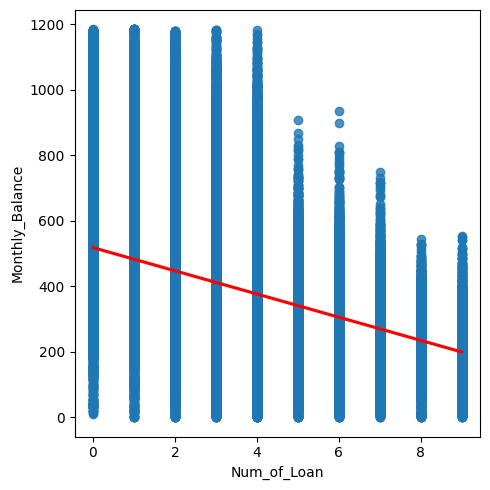

data have Spearman correlation with specification:
corr: -0.4710305139460432
pvalue: 0.0
Low corr between Num_of_Loan and Monthly_Balance
 
 
127. Delay_from_due_date - Num_of_Delayed_Payment


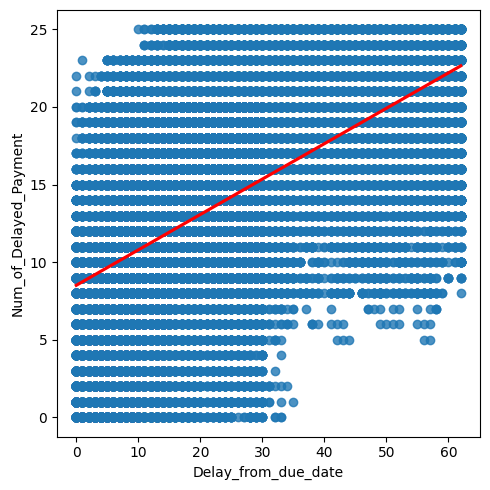

data have Spearman correlation with specification:
corr: 0.5556254776800558
pvalue: 0.0
Low corr between Delay_from_due_date and Num_of_Delayed_Payment
 
 
128. Delay_from_due_date - Changed_Credit_Limit


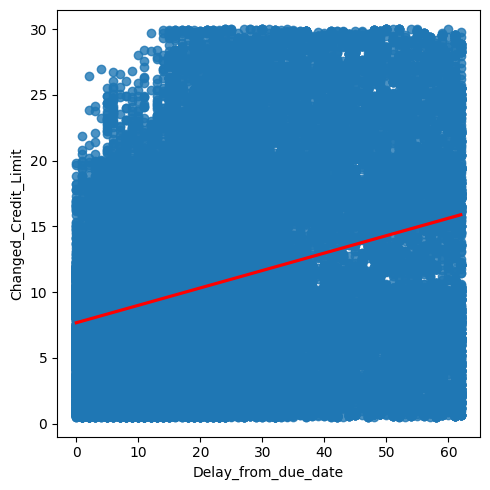

data have Spearman correlation with specification:
corr: 0.2689829983125027
pvalue: 0.0
Low corr between Delay_from_due_date and Changed_Credit_Limit
 
 
129. Delay_from_due_date - Num_Credit_Inquiries


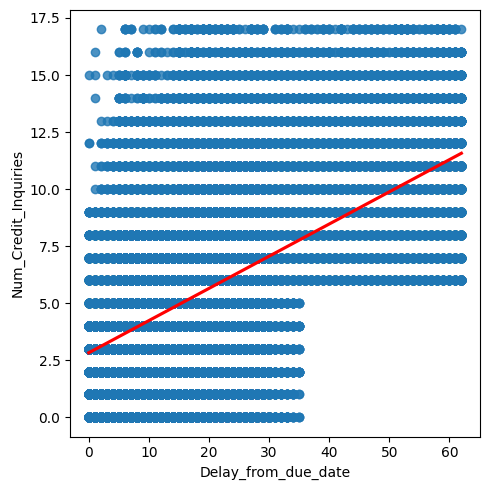

data have Spearman correlation with specification:
corr: 0.5187479618507703
pvalue: 0.0
Low corr between Delay_from_due_date and Num_Credit_Inquiries
 
 
130. Delay_from_due_date - Outstanding_Debt


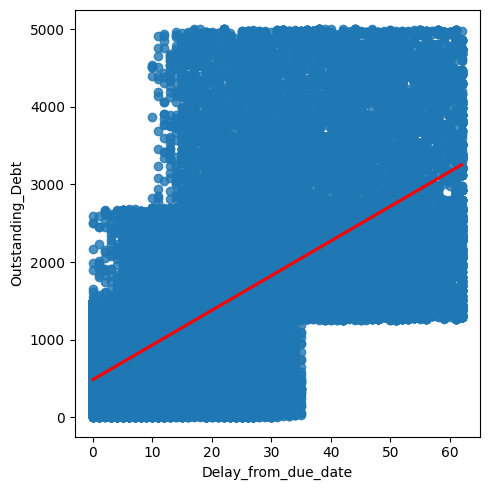

data have Spearman correlation with specification:
corr: 0.5186976867844543
pvalue: 0.0
Low corr between Delay_from_due_date and Outstanding_Debt
 
 
131. Delay_from_due_date - Credit_Utilization_Ratio


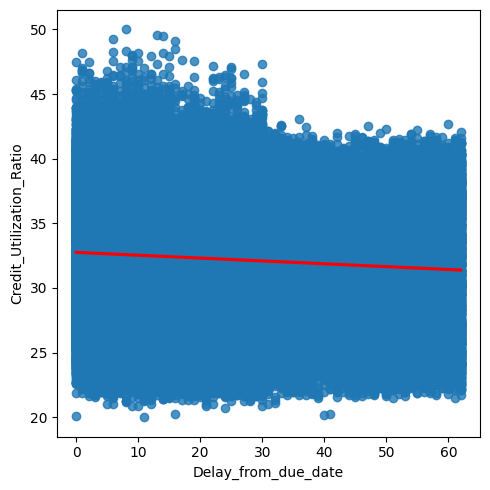

data have Spearman correlation with specification:
corr: -0.05962530335727439
pvalue: 1.9481030341943146e-79
Low corr between Delay_from_due_date and Credit_Utilization_Ratio
 
 
132. Delay_from_due_date - Credit_History_Age


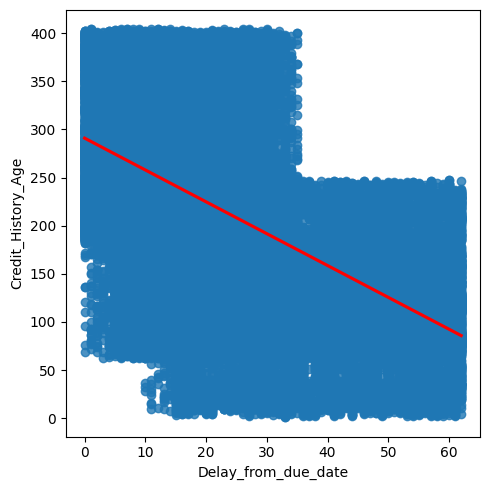

data have Spearman correlation with specification:
corr: -0.4819471120215777
pvalue: 0.0
Low corr between Delay_from_due_date and Credit_History_Age
 
 
133. Delay_from_due_date - Total_EMI_per_month


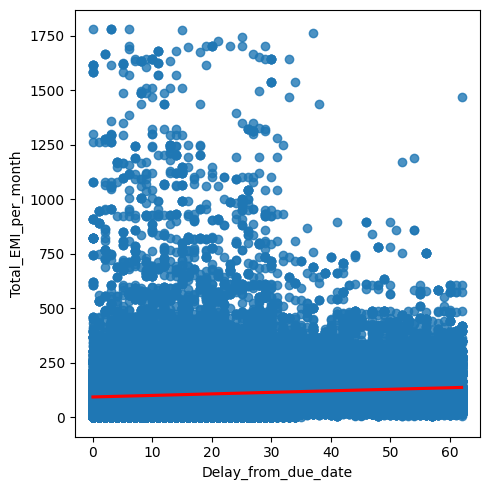

data have Spearman correlation with specification:
corr: 0.14889326573506342
pvalue: 0.0
Low corr between Delay_from_due_date and Total_EMI_per_month
 
 
134. Delay_from_due_date - Amount_invested_monthly


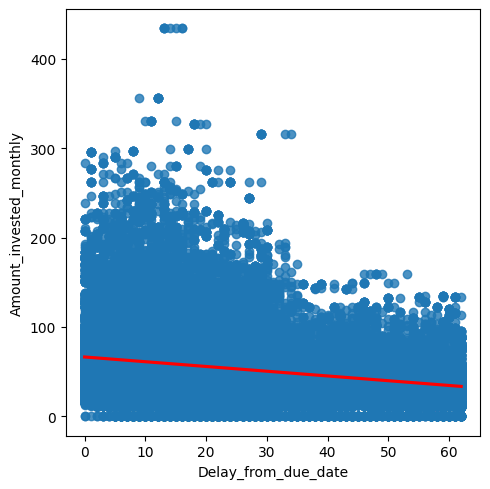

data have Spearman correlation with specification:
corr: -0.1942130220547962
pvalue: 0.0
Low corr between Delay_from_due_date and Amount_invested_monthly
 
 
135. Delay_from_due_date - Monthly_Balance


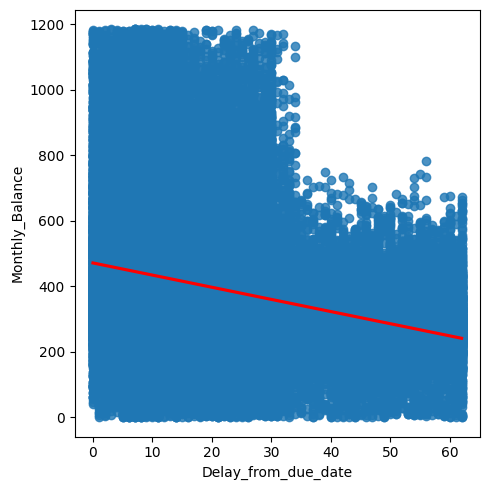

data have Spearman correlation with specification:
corr: -0.28302192012175265
pvalue: 0.0
Low corr between Delay_from_due_date and Monthly_Balance
 
 
136. Num_of_Delayed_Payment - Changed_Credit_Limit


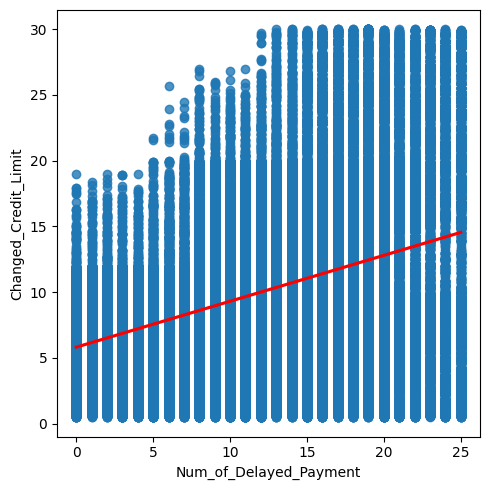

data have Spearman correlation with specification:
corr: 0.2873210844740473
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Changed_Credit_Limit
 
 
137. Num_of_Delayed_Payment - Num_Credit_Inquiries


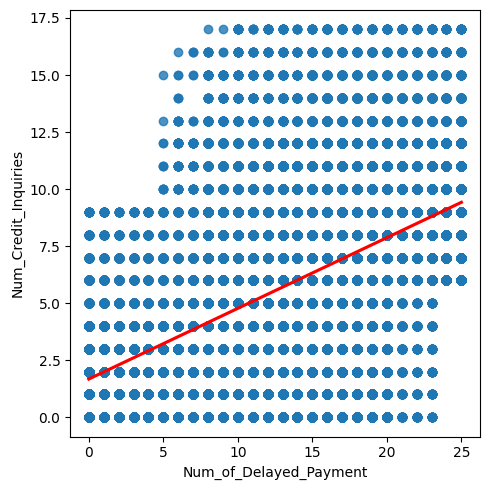

data have Spearman correlation with specification:
corr: 0.5044346303553925
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Num_Credit_Inquiries
 
 
138. Num_of_Delayed_Payment - Outstanding_Debt


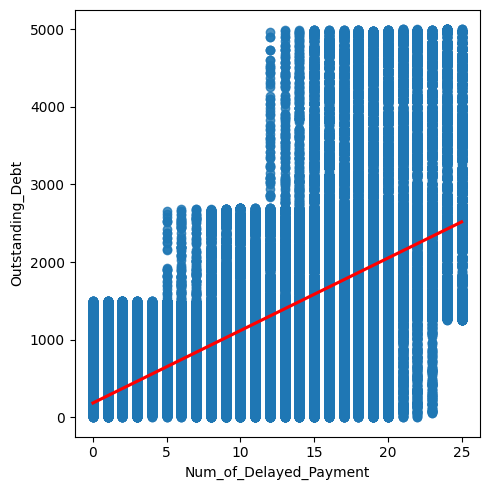

data have Spearman correlation with specification:
corr: 0.48428785810680597
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Outstanding_Debt
 
 
139. Num_of_Delayed_Payment - Credit_Utilization_Ratio


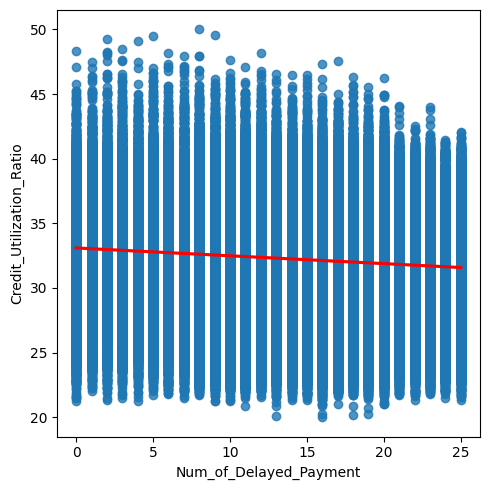

data have Spearman correlation with specification:
corr: -0.06749125195707582
pvalue: 2.727118446741842e-101
Low corr between Num_of_Delayed_Payment and Credit_Utilization_Ratio
 
 
140. Num_of_Delayed_Payment - Credit_History_Age


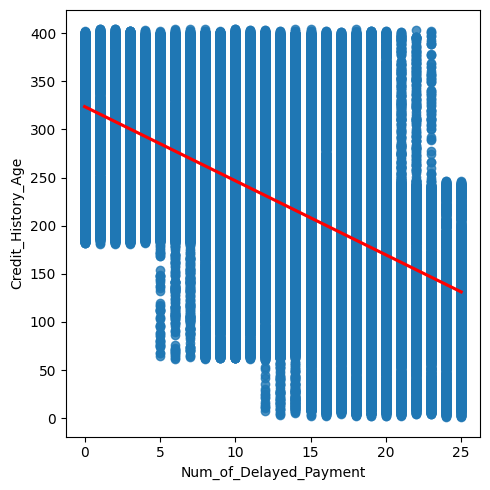

data have Spearman correlation with specification:
corr: -0.48562634008811456
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Credit_History_Age
 
 
141. Num_of_Delayed_Payment - Total_EMI_per_month


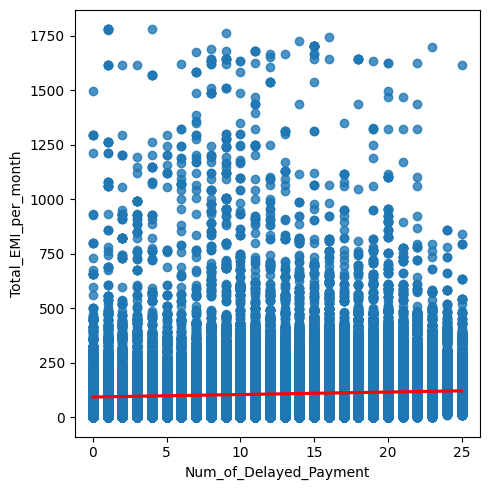

data have Spearman correlation with specification:
corr: 0.1357038618154324
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Total_EMI_per_month
 
 
142. Num_of_Delayed_Payment - Amount_invested_monthly


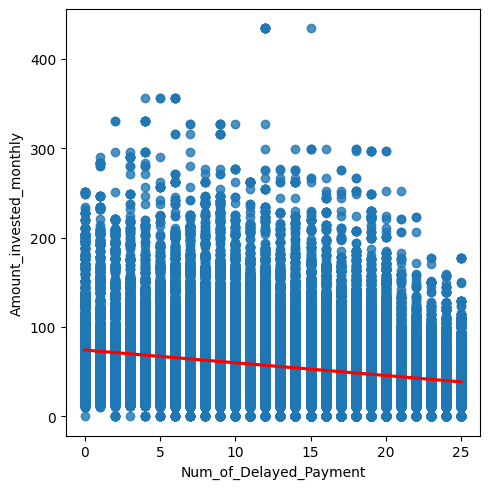

data have Spearman correlation with specification:
corr: -0.21564804575257188
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Amount_invested_monthly
 
 
143. Num_of_Delayed_Payment - Monthly_Balance


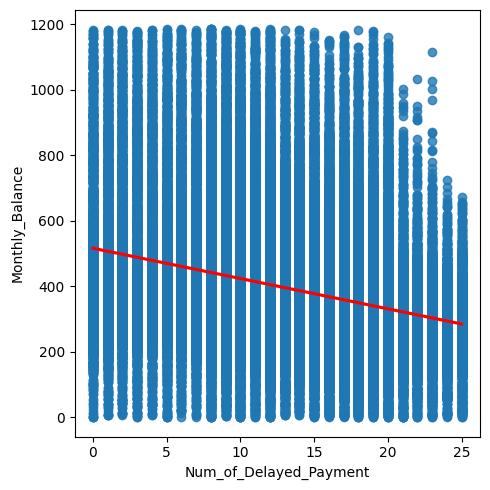

data have Spearman correlation with specification:
corr: -0.294882639835496
pvalue: 0.0
Low corr between Num_of_Delayed_Payment and Monthly_Balance
 
 
144. Changed_Credit_Limit - Num_Credit_Inquiries


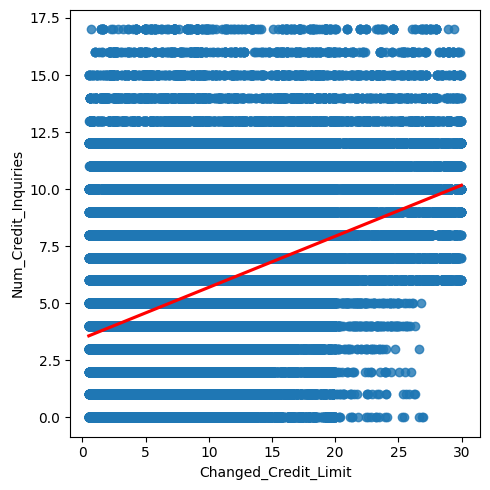

data have Spearman correlation with specification:
corr: 0.3676717390647755
pvalue: 0.0
Low corr between Changed_Credit_Limit and Num_Credit_Inquiries
 
 
145. Changed_Credit_Limit - Outstanding_Debt


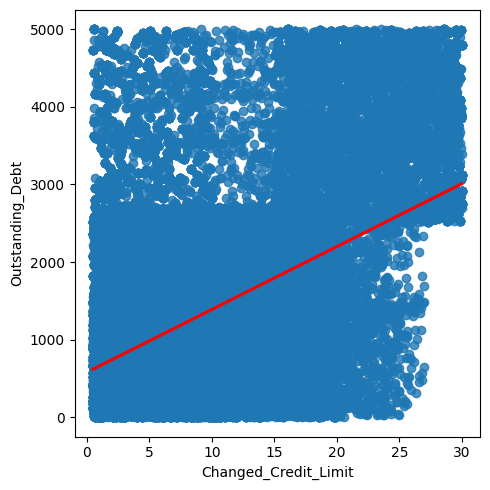

data have Spearman correlation with specification:
corr: 0.3162024312758793
pvalue: 0.0
Low corr between Changed_Credit_Limit and Outstanding_Debt
 
 
146. Changed_Credit_Limit - Credit_Utilization_Ratio


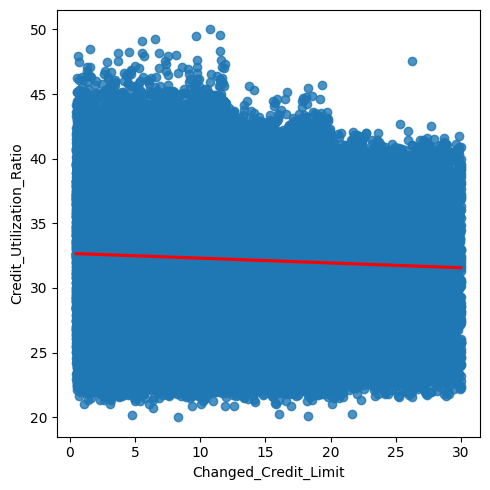

data have Spearman correlation with specification:
corr: -0.04124402518514319
pvalue: 6.532794968765506e-39
Low corr between Changed_Credit_Limit and Credit_Utilization_Ratio
 
 
147. Changed_Credit_Limit - Credit_History_Age


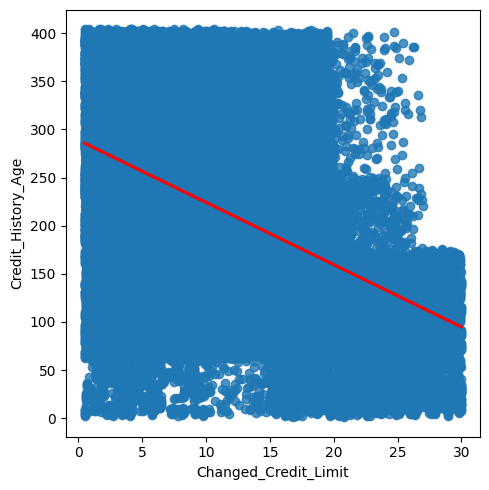

data have Spearman correlation with specification:
corr: -0.3880831953854759
pvalue: 0.0
Low corr between Changed_Credit_Limit and Credit_History_Age
 
 
148. Changed_Credit_Limit - Total_EMI_per_month


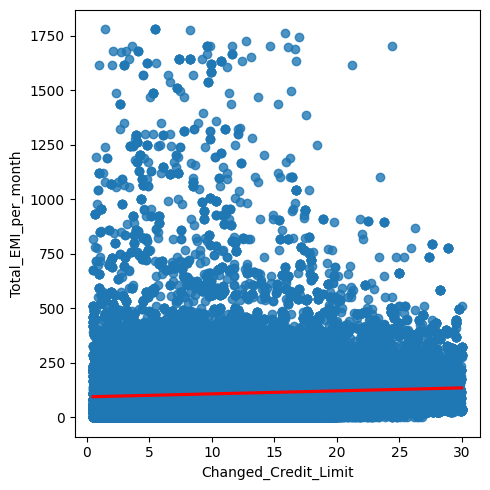

data have Spearman correlation with specification:
corr: 0.1119849406106434
pvalue: 2.0880945184469286e-276
Low corr between Changed_Credit_Limit and Total_EMI_per_month
 
 
149. Changed_Credit_Limit - Amount_invested_monthly


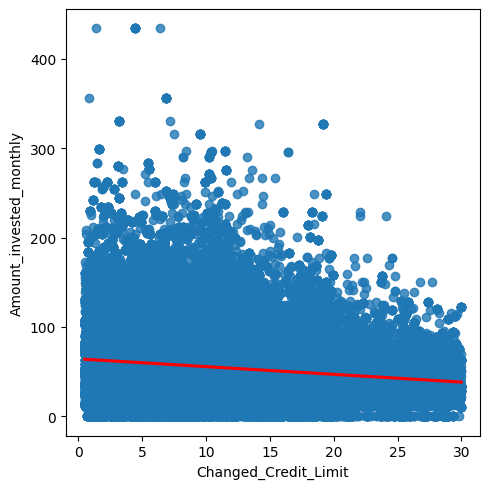

data have Spearman correlation with specification:
corr: -0.13002078180333557
pvalue: 0.0
Low corr between Changed_Credit_Limit and Amount_invested_monthly
 
 
150. Changed_Credit_Limit - Monthly_Balance


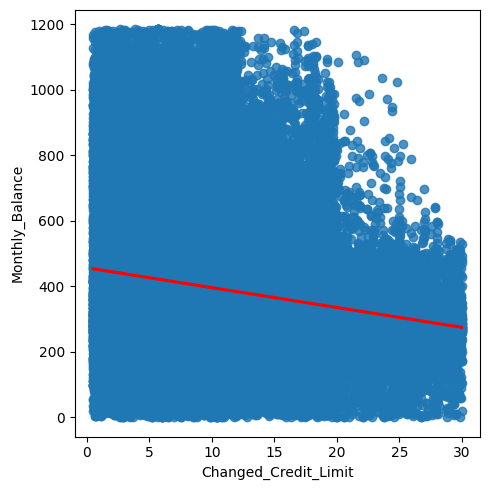

data have Spearman correlation with specification:
corr: -0.18474483403691036
pvalue: 0.0
Low corr between Changed_Credit_Limit and Monthly_Balance
 
 
151. Num_Credit_Inquiries - Outstanding_Debt


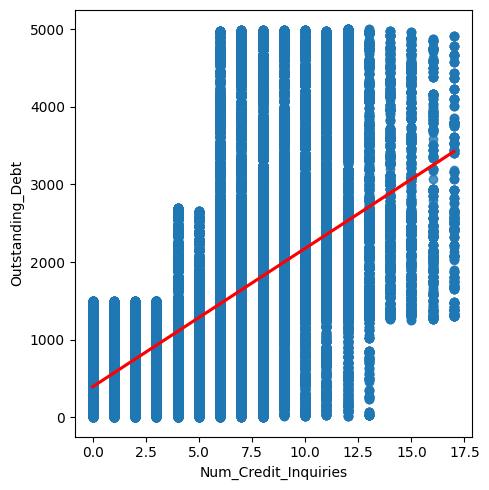

data have Spearman correlation with specification:
corr: 0.5978545016626461
pvalue: 0.0
Low corr between Num_Credit_Inquiries and Outstanding_Debt
 
 
152. Num_Credit_Inquiries - Credit_Utilization_Ratio


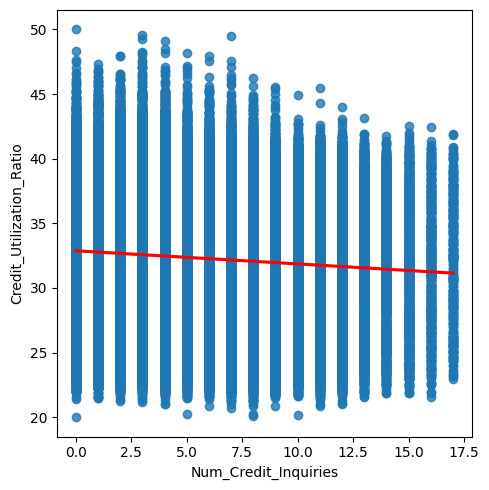

data have Spearman correlation with specification:
corr: -0.07331033500016812
pvalue: 3.3102226981908803e-119
Low corr between Num_Credit_Inquiries and Credit_Utilization_Ratio
 
 
153. Num_Credit_Inquiries - Credit_History_Age


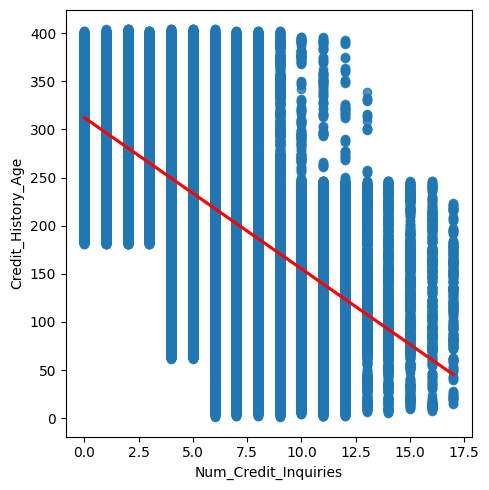

data have Spearman correlation with specification:
corr: -0.6311166484920852
pvalue: 0.0
High corr between Num_Credit_Inquiries and Credit_History_Age
 
 
154. Num_Credit_Inquiries - Total_EMI_per_month


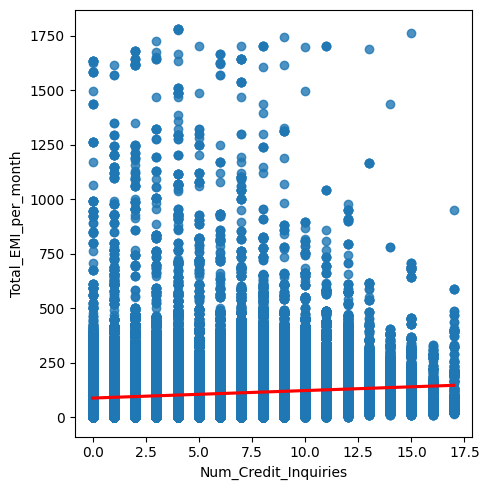

data have Spearman correlation with specification:
corr: 0.1986071409722746
pvalue: 0.0
Low corr between Num_Credit_Inquiries and Total_EMI_per_month
 
 
155. Num_Credit_Inquiries - Amount_invested_monthly


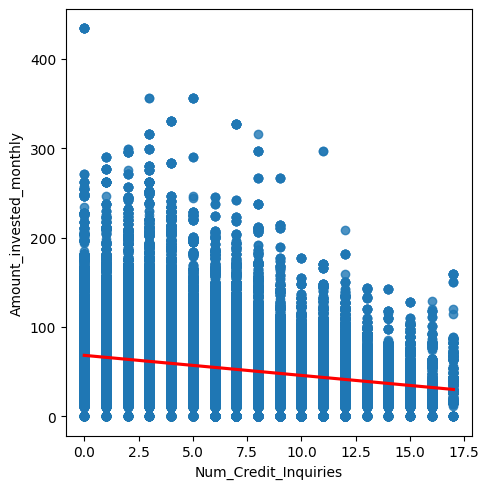

data have Spearman correlation with specification:
corr: -0.21644075530766044
pvalue: 0.0
Low corr between Num_Credit_Inquiries and Amount_invested_monthly
 
 
156. Num_Credit_Inquiries - Monthly_Balance


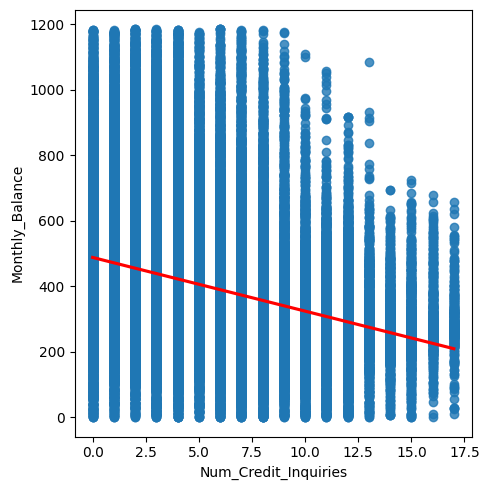

data have Spearman correlation with specification:
corr: -0.3362010287586812
pvalue: 0.0
Low corr between Num_Credit_Inquiries and Monthly_Balance
 
 
157. Outstanding_Debt - Credit_Utilization_Ratio


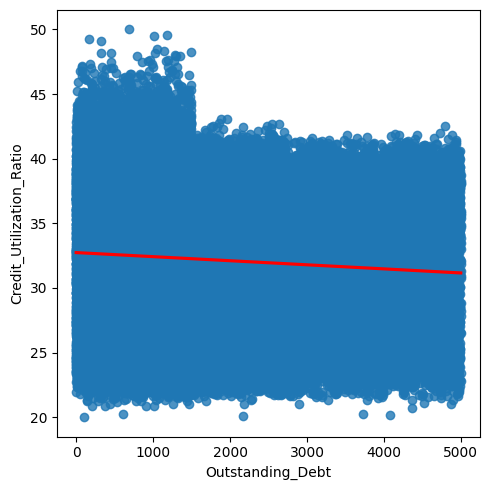

data have Spearman correlation with specification:
corr: -0.0661682429728773
pvalue: 2.001191111767398e-97
Low corr between Outstanding_Debt and Credit_Utilization_Ratio
 
 
158. Outstanding_Debt - Credit_History_Age


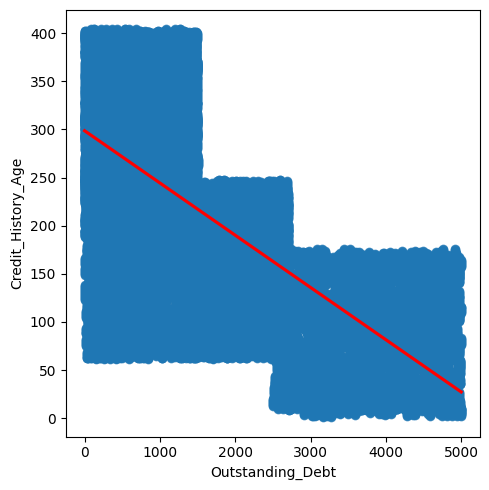

data have Spearman correlation with specification:
corr: -0.5964001211156719
pvalue: 0.0
Low corr between Outstanding_Debt and Credit_History_Age
 
 
159. Outstanding_Debt - Total_EMI_per_month


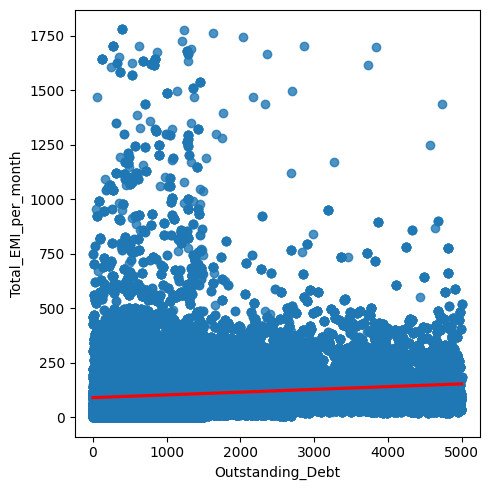

data have Spearman correlation with specification:
corr: 0.18237109021908704
pvalue: 0.0
Low corr between Outstanding_Debt and Total_EMI_per_month
 
 
160. Outstanding_Debt - Amount_invested_monthly


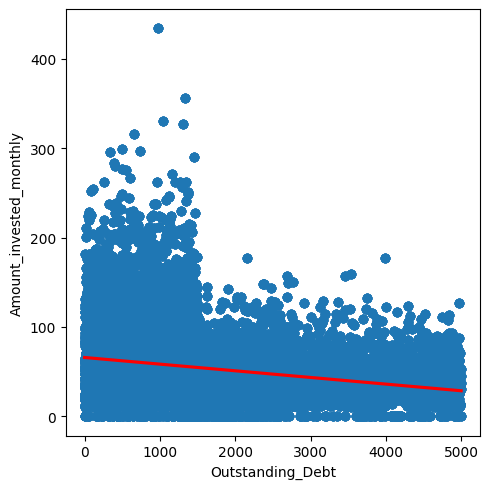

data have Spearman correlation with specification:
corr: -0.21865691881182212
pvalue: 0.0
Low corr between Outstanding_Debt and Amount_invested_monthly
 
 
161. Outstanding_Debt - Monthly_Balance


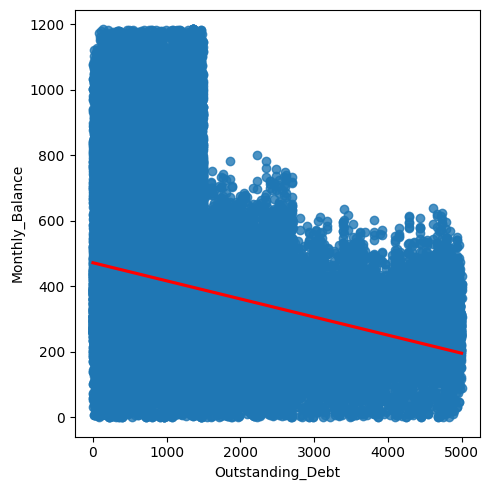

data have Spearman correlation with specification:
corr: -0.3406229202230865
pvalue: 0.0
Low corr between Outstanding_Debt and Monthly_Balance
 
 
162. Credit_Utilization_Ratio - Credit_History_Age


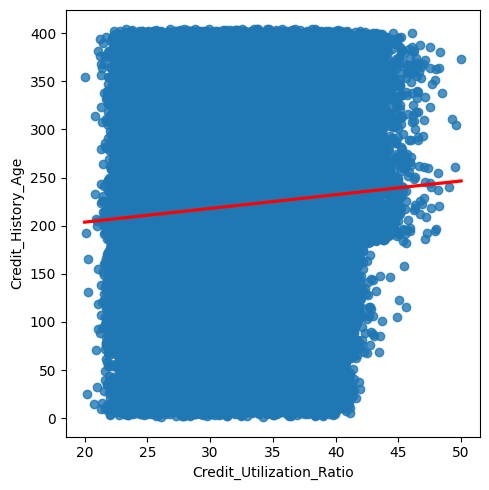

data have Spearman correlation with specification:
corr: 0.06902451577110585
pvalue: 7.237550630197817e-106
Low corr between Credit_Utilization_Ratio and Credit_History_Age
 
 
163. Credit_Utilization_Ratio - Total_EMI_per_month


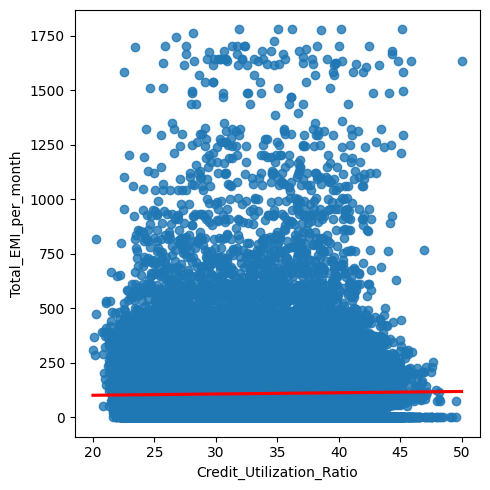

data have Spearman correlation with specification:
corr: 0.008641237406650046
pvalue: 0.006283353050477275
Low corr between Credit_Utilization_Ratio and Total_EMI_per_month
 
 
164. Credit_Utilization_Ratio - Amount_invested_monthly


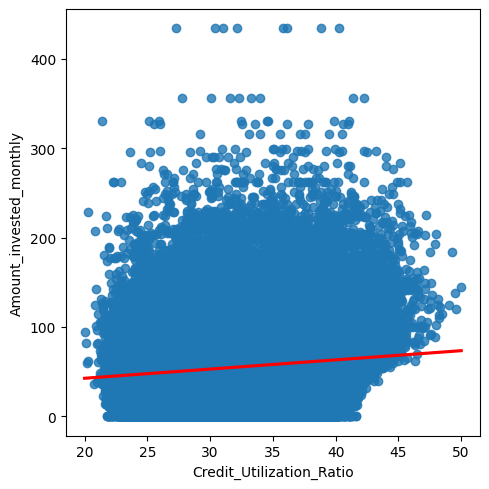

data have Spearman correlation with specification:
corr: 0.11556852839258829
pvalue: 2.3265756773770645e-294
Low corr between Credit_Utilization_Ratio and Amount_invested_monthly
 
 
165. Credit_Utilization_Ratio - Monthly_Balance


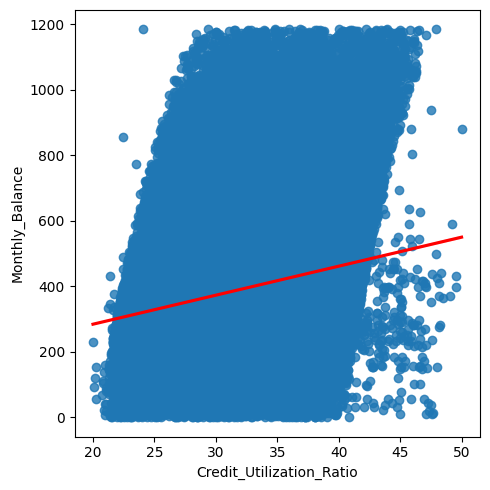

data have Spearman correlation with specification:
corr: 0.18072280146161904
pvalue: 0.0
Low corr between Credit_Utilization_Ratio and Monthly_Balance
 
 
166. Credit_History_Age - Total_EMI_per_month


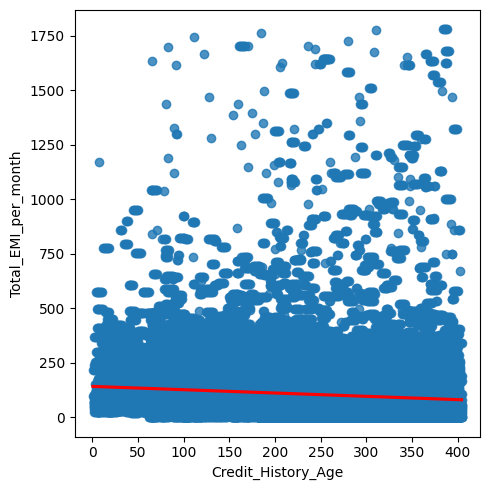

data have Spearman correlation with specification:
corr: -0.22128634189051094
pvalue: 0.0
Low corr between Credit_History_Age and Total_EMI_per_month
 
 
167. Credit_History_Age - Amount_invested_monthly


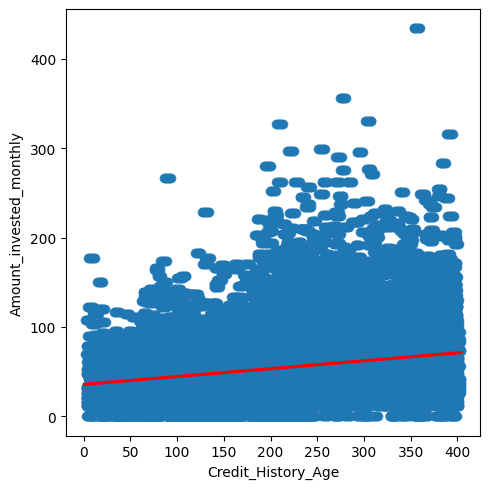

data have Spearman correlation with specification:
corr: 0.2200511703379083
pvalue: 0.0
Low corr between Credit_History_Age and Amount_invested_monthly
 
 
168. Credit_History_Age - Monthly_Balance


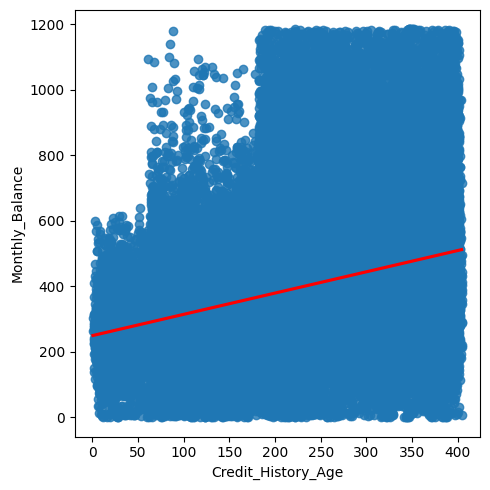

data have Spearman correlation with specification:
corr: 0.3505668647253072
pvalue: 0.0
Low corr between Credit_History_Age and Monthly_Balance
 
 
169. Total_EMI_per_month - Amount_invested_monthly


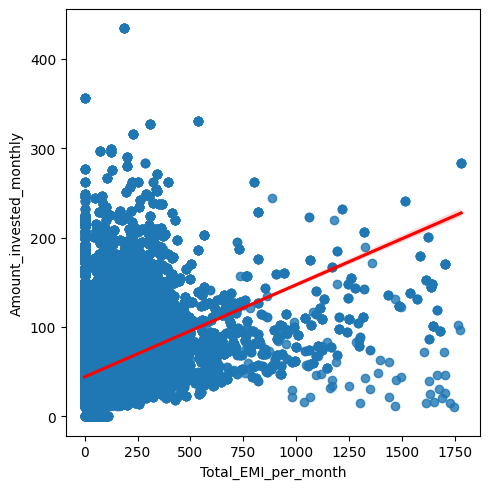

data have Spearman correlation with specification:
corr: 0.40107123733115374
pvalue: 0.0
Low corr between Total_EMI_per_month and Amount_invested_monthly
 
 
170. Total_EMI_per_month - Monthly_Balance


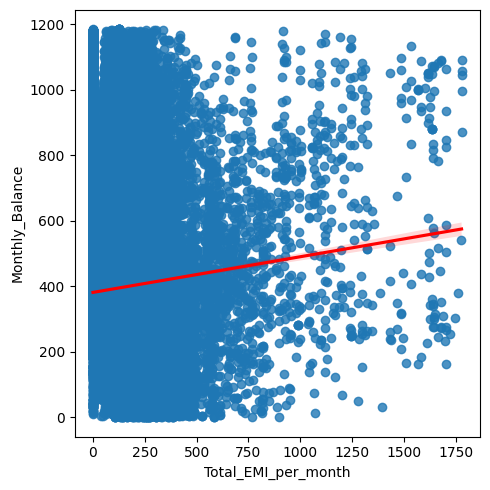

data have Spearman correlation with specification:
corr: -0.0076768761718255946
pvalue: 0.01519713414083755
Low corr between Total_EMI_per_month and Monthly_Balance
 
 
171. Amount_invested_monthly - Monthly_Balance


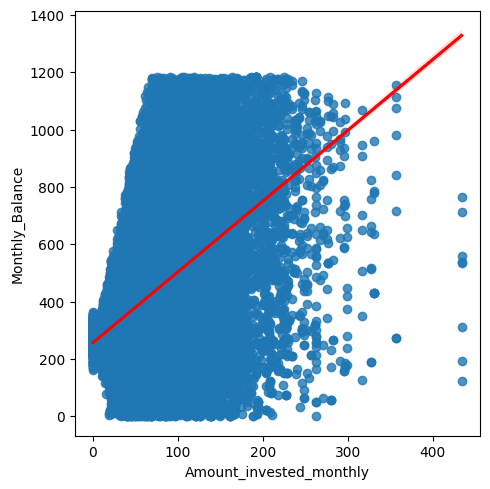

data have Spearman correlation with specification:
corr: 0.4239644412028487
pvalue: 0.0
Low corr between Amount_invested_monthly and Monthly_Balance
 
 


In [24]:
# Conducting pairwise correlation analysis between numerical columns, plotting scatter plots, and categorizing correlations as high or low based on thresholds.

# Bivariate Analysis 

y = 1 # Keeping track of the num of loops
high_cor = []
low_cor = []

# Loop through combinations of numerical columns for bivariate analysis
for col1, col2 in combinations(numerical_cols, 2):
    plt.figure(figsize=(5, 5))
    print(f'{y}. {col1} - {col2}')
    
    # Create a scatter plot with a regression line
    sns.regplot(data = df, x = col1, y = col2, line_kws={'color':'red'})
    plt.tight_layout()
    plt.show()
    
    # Check if both columns are normally distributed
    if (col1 in norm_data) and (col2 in norm_data):
        # Calculate Pearson correlation and p-value
        pear, pval1 = st.pearsonr(df[col1], df[col2])
        print(f'data have Pearson correlation with specification:')
        print(f'corr: {pear}')
        print(f'pvalue: {pval1}')
        
        # Determine if correlation is high or low based on threshold
        if (pear > 0.6) or (pear < -0.6):
            high_cor.append([col1, col2])
            print(f'High corr between {col1} and {col2}')
        else:
            low_cor.append([col1, col2])
    
    # Calculate Spearman correlation and p-value for non-normally distributed data
    else:
        spear, pval2 = st.spearmanr(df[col1], df[col2])
        print(f'data have Spearman correlation with specification:')
        print(f'corr: {spear}')
        print(f'pvalue: {pval2}')
        
        # Determine if correlation is high or low based on threshold
        if (spear > 0.6) or (spear < -0.6):
            high_cor.append([col1, col2])
            print(f'High corr between {col1} and {col2}')
        else:
            low_cor.append([col1, col2])
            print(f'Low corr between {col1} and {col2}')
    
    print(' ')
    y += 1
    print(' ')

In [25]:
# Modification on features with high correlation to avoid multi-colinearity.
# Approach is as follows:
# 1) Find the correlation between each numerical feature and the target column "Credit_Score."
# 2) Compare the correlations and determine which column to keep from the two features that are highly correlated.
# 3) Drop the feature that has the lower correlation in comparison to the other.
# In this case we're looking to compare the ones in the "high_cor" list.
high_cor


[['Annual_Income', 'Monthly_Inhand_Salary'],
 ['Annual_Income', 'Amount_invested_monthly'],
 ['Monthly_Inhand_Salary', 'Amount_invested_monthly'],
 ['Interest_Rate', 'Num_Credit_Inquiries'],
 ['Interest_Rate', 'Outstanding_Debt'],
 ['Num_Credit_Inquiries', 'Credit_History_Age']]

# Plotting Continuous features against the target feature "Credit_score"

Correlations with Credit_Score:
Credit_Score_encoded        1.000000
Num_of_Delayed_Payment      0.203116
Changed_Credit_Limit        0.190080
Num_Bank_Accounts           0.177389
Interest_Rate               0.121088
Num_Credit_Card             0.113333
Delay_from_due_date         0.097286
Num_Credit_Inquiries        0.067845
Num_of_Loan                 0.064064
Outstanding_Debt            0.037153
Customer_ID                -0.009946
Credit_Utilization_Ratio   -0.014371
Month                      -0.038069
Monthly_Balance            -0.047380
Age                        -0.058923
Total_EMI_per_month        -0.059341
Amount_invested_monthly    -0.068770
Monthly_Inhand_Salary      -0.078770
Annual_Income              -0.080700
Credit_History_Age         -0.102598
Name: Credit_Score_encoded, dtype: float64

Correlation Heatmap:
                           Customer_ID         Month       Age  Annual_Income  \
Customer_ID               1.000000e+00 -6.660113e-17 -0.002172   1.076923e-02   
M

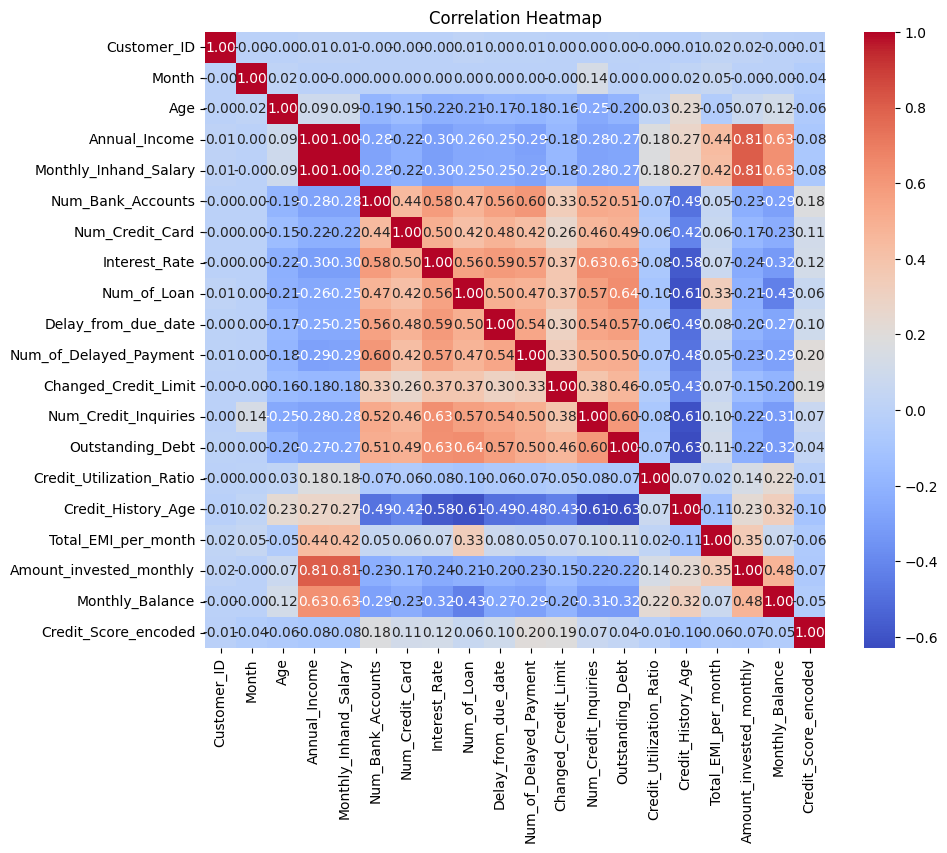

In [26]:
# Calculate the correlation matrix
correlation_matrix = df[numerical_cols + ["Credit_Score_encoded"]].corr()

# Print the correlations in descending order
correlations = correlation_matrix["Credit_Score_encoded"].sort_values(ascending=False)
print("Correlations with Credit_Score:")
print(correlations)

# Print the correlation heatmap
print("\nCorrelation Heatmap:")
print(correlation_matrix)

# Plot the correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(data = correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

In [27]:
# Dropping "Annual_Income", "Monthly_Inhand_Salary", "Num_Credit_Inquiries", "Outstanding_Debt" since they've been proved to hold-
# the least correlation with the target variable than the feature they're highly correlated with.
Dropping = ["Monthly_Inhand_Salary", "Num_Credit_Inquiries", "Outstanding_Debt"]
df.drop(Dropping, axis = 1, inplace = True)


In [29]:
# Save the modified dataframe to a CSV file
df.to_csv('After_dropping_corr_features2.csv', index=False)